# Projet 3 OpenFoodFacts - Notebook d'analyse des données


Lien vers les consignes du projet sur openclassrooms : https://openclassrooms.com/fr/projects/628/assignment

Lien vers la définition des variables : https://world.openfoodfacts.org/data/data-fields.txt

## Installation 

In [470]:
!pip install missingno
!pip install mlxtend
!pip install ppscore
!pip install --upgrade statsmodels


Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 9.2/9.2 MB 41.8 MB/s eta 0:00:00


- missingno : cette bibliothèque fournit des outils pour visualiser les données manquantes dans un ensemble de données. Elle est utile pour identifier rapidement les valeurs manquantes et les tendances des données. Elle peut être utilisée en conjonction avec d'autres bibliothèques d'analyse de données telles que pandas et matplotlib.

- mlxtend : cette bibliothèque est un ensemble d'outils pour l'analyse de données et l'apprentissage automatique. Elle fournit des algorithmes d'apprentissage automatique, des outils pour l'évaluation et la sélection de modèles, et des méthodes de prétraitement des données telles que le codage en une chaîne binaire.

- ppscore : cette bibliothèque fournit une mesure de la corrélation entre les variables appelée "Predictive Power Score" (PPS), qui peut être utilisée pour identifier les variables les plus importantes dans un ensemble de données pour la prédiction. La PPS est une mesure plus complète que la corrélation de Pearson, car elle peut identifier des relations non linéaires et non monotones entre les variables.

## Environnement & Imports

In [115]:
# Importation des bibliothèques nécessaires
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
import re
import missingno as msno
import matplotlib.dates as mdates
import os
from sklearn.decomposition import PCA
# Importation de la classe KMeans à partir de la bibliothèque scikit-learn
from sklearn.cluster import KMeans
from scipy.stats import trim_mean
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.stattools import adfuller

import ppscore as pps
import warnings
warnings.filterwarnings('ignore')

from matplotlib.colors import ListedColormap

from scipy.stats import f_oneway, kruskal, rankdata
from sklearn.linear_model import LinearRegression

# POUR RECALCULER LA PCA AVEC MLXTEND
from mlxtend.plotting import plot_pca_correlation_graph
from scipy.stats import pearsonr, spearmanr, kendalltau

# Affichage des graphiques dans le notebook
%matplotlib inline


In [116]:
#Modification des affichages de colonnes, lignes et largeurs de colonnes pour avoir un maximum d'information
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_colwidth', -1)

## Chargement

In [3]:
# Définition d'une fonction pour tracer une heatmap
# paramètres :
# corr : matrice de corrélation
# title : titre du graphe
# figsize : taille de la figure
# vmin : valeur minimale de la colormap
# vmax : valeur maximale de la colormap
# center : valeur centrale de la colormap
# palette : palette de couleurs
# shape : forme de la heatmap (rectangle ou triangle)
# fmt : format des nombres affichés
# robust : booléen pour utiliser une méthode de calcul robuste ou non
def plot_heatmap(corr, title, figsize=(8,4), vmin=-1, vmax=1, center=0,
                 palette = sns.color_palette("coolwarm", 20), shape='rect',
                 fmt='.2f', robust=False):
    
    # Création d'une figure et d'un axe
    fig, ax = plt.subplots(figsize=figsize)
    
    # Définition du masque pour la forme de la heatmap
    if shape == 'rect':
        mask=None
    elif shape == 'tri':
        mask = np.zeros_like(corr, dtype=np.bool)
        mask[np.triu_indices_from(mask)] = True
    else:
        print('ERROR : this type of heatmap does not exist')

    # Définition de la palette de couleurs
    palette = palette
    
    # Tracé de la heatmap
    ax = sns.heatmap(corr, mask=mask, cmap=palette, vmin=vmin, vmax=vmax,
                     center=center, annot=True, annot_kws={"size": 10},fmt=fmt,
                     square=False, linewidths=.5, linecolor = 'white',
                     cbar_kws={"shrink": .9, 'label': None}, robust = robust,
                     xticklabels= corr.columns, yticklabels = corr.index)
    
    # Configuration des axes et de la légende
    ax.tick_params(labelsize=8,top=False, bottom=True,
                labeltop=False, labelbottom=True)
    ax.collections[0].colorbar.ax.tick_params(labelsize=8)
    plt.setp(ax.get_xticklabels(), rotation=25, ha="right",rotation_mode="anchor")
    ax.set_title(title, fontweight='bold', fontsize=14)
    
    # Retourne le masque (inutilisé dans ce code)
    # return mask


In [124]:
from scipy.stats import trim_mean
from statsmodels.tsa.stattools import adfuller, kpss
import numpy as np

def stationary_tests(data, print_opt=True, trim_prop=0.9):
    # Suppression des valeurs manquantes et NaN
    data_m = data.dropna().values.astype(float)
#     data_m = data_m[~np.isnan(data_m)]
    data_m = data_m[~np.isnan(data_m)].astype(float)

    # Troncature des valeurs extrêmes
    trim_value = int(len(data_m) * trim_prop)
    data_m = trim_mean(data_m, trim_value)
    
    # apply KPSS test on residuals
    stat, p, lags, crit = kpss(data_m, nlags='auto')
    result = adfuller(data_m)

    if print_opt:
        # H0: series is not trend-stationary.
        print('--- Kwiatkowski---') 
        print('stat=%.3f, p=%.3f' % (stat, p))
        # not rejected -> series is not trend-stationary.
        print('prob. not trend-stationary') if p > 0.05\
             else print('prob. trend-stationary') # rejected -> trend-stationary
        
        # H0: there is a unit root i.e. series is non-stationary
        print('--- Aug. Dickey-Fuller ---\n stat.: %f' % result[0]) 
        print('p-value: %f' % result[1])
        # not rejected -> series is non-stationary
        print('prob. not stationary\n') if result[1] > 0.05\
                    else print('prob. stationary\n' )# rejected -> stationary
    # True : stationary/trend-stationary
    return {'Kwiatkowski': (round(p,4), str(p <= 0.05)),
            'Aug. Dickey-Fuller': (round(result[1],4), str(result[1] <= 0.05))}


# # Function applying stationary tests to data and returning if stat. or not

# def stationary_tests(data, print_opt=True):

#     data_m = np.array(data[~np.isnan(data)])
#     stat, p, lags, crit = kpss(data_m, nlags='auto')
#     result = adfuller(data_m)

#     if print_opt:

#         # : H0 : series is not trend-stationary.
#         print('--- Kwiatkowski---') 
#         print('stat=%.3f, p=%.3f' % (stat, p))
#         # not rejected -> series is not trend-stationary.
#         print('prob. not trend-stationary') if p > 0.05\
#              else print('prob. trend-stationary') # rejected -> trend-stationary
        
#         # H0 there is a unit root i.e. series is non-stationary
#         print('--- Aug. Dickey-Fuller ---\n stat.: %f' % result[0]) 
#         print('p-value: %f' % result[1])
#         # not rejected -> series is non-stationary
#         print('prob. not stationary\n') if result[1] > 0.05\
#                     else print('prob. stationary\n' )# rejected -> stationary
#     # True : stationnary/trend-stationnary
#     return {'Kwiatkowski': (round(p,4), str(p <= 0.05)),
#             'Aug. Dickey-Fuller': (round(result[1],4), str(result[1] <= 0.05))}



# def stationary_tests(data, print_opt=True, trim_prop=0.3):
# #     # On enlève les valeurs manquantes et on met les données dans un array numpy
# #     data_m = data.fillna(df.mean())

#     # Suppression des valeurs manquantes et NaN
    
#     data_m = data.dropna().values.astype(float)
#     data_m = data_m[~np.isnan(data_m)]

# #     data_m = data_m.dropna().values
# #     data_m = np.array(data_m[~np.isnan(data_m)])
#     data_m = data_m[~np.isnan(data_m)]
  
#     # Troncature des valeurs extrêmes
#     trim_value = int(len(data_m) * trim_prop)
#     data_m = trim_mean(data_m, trim_value)
    
#     # apply KPSS test on residuals
# #     resids = data_m - np.mean(data_m)
#     data_m = data_m[~np.isnan(data_m)]
    
#     stat, p, lags, crit = kpss(data_m, nlags='auto')
#     result = adfuller(data_m)

#     if print_opt:
#         # H0: series is not trend-stationary.
#         print('--- Kwiatkowski---') 
#         print('stat=%.3f, p=%.3f' % (stat, p))
#         # not rejected -> series is not trend-stationary.
#         print('prob. not trend-stationary') if p > 0.05\
#              else print('prob. trend-stationary') # rejected -> trend-stationary
        
#         # H0: there is a unit root i.e. series is non-stationary
#         print('--- Aug. Dickey-Fuller ---\n stat.: %f' % result[0]) 
#         print('p-value: %f' % result[1])
#         # not rejected -> series is non-stationary
#         print('prob. not stationary\n') if result[1] > 0.05\
#                     else print('prob. stationary\n' )# rejected -> stationary
#     # True : stationary/trend-stationary
#     return {'Kwiatkowski': (round(p,4), str(p <= 0.05)),
#             'Aug. Dickey-Fuller': (round(result[1],4), str(result[1] <= 0.05))}


In [203]:
# Plotting ANOVA and Kruskall-Wallis H test and return if same dist. or not

def id_cat_distrib_tests(data_df, Q_col, C_col, print_opt=True):

    gb = data_df.groupby(C_col)[Q_col]
    cat = list(gb.groups.keys())
    cat_series = [gr.dropna().values for n, gr in gb]

    if print_opt: print('oooooooo- {} vs. {} -oooooooo'.format(Q_col, C_col))

    # Analysis of Variance Test
    stat1, p1 = f_oneway(*cat_series)
    if print_opt:
        print('---ANOVA---')
        print('stat=%.3f, p=%.10f' % (stat1, p1))
        print('Prob. same distr') if p1 > 0.05 else print('Prob. different distr')
    # Kruskal-Wallis H Test
    stat2, p2 = kruskal(*cat_series)
    if print_opt:
        print('---Kruskal-Wallis---')
        print('stat={:.3f}, p={:.10f}'.format(stat2, p2))
        print('Prob. same distr') if p2 > 0.05 else print('Prob. different distr')
        
    return {'ANOVA': (round(p1,4), str(p1 > 0.05)),
            'Kruskal-Wallis': (round(p2,4), str(p2 > 0.05))}

 # - > at least one of the groups has a significantly different mean from the others.

In [204]:
def mult_test(data_df, test_func, print_opt=True, res_df=pd.DataFrame(), **kwargs):
    res_df_mod = res_df.copy('deep')
    
    data_df = pd.DataFrame(data_df).dropna()
    print(res_df_mod)
    for c in data_df.select_dtypes(include=np.number).columns:
        if print_opt: print('oooo--'+c+'--oooo')
        if test_func == 'stat':
            dic_stat = stationary_tests(data_df[c], print_opt=print_opt)
        elif test_func == 'id_dist':
            dic_stat = id_cat_distrib_tests(data_df, C_col=kwargs['C_col'],
                                            Q_col=c, print_opt=print_opt)
        else:
            print('ERROR: this function does not exist')
        for s in dic_stat.keys():
            res_df_mod.loc[s, c] = str(dic_stat.get(s))

    return res_df_mod


In [6]:
# # Plotting proportion of categories among newly entered products and returning
# # the dataframe of aggregated data for each categories

# def plot_cat_prop_thr_time(col, palette='dark', ncol=3):
#     print(df)
#     df_fx = df.copy()
#     if 'last_modified_t' in df_fx.columns:
#         print("la colonne existe ")
#     print("les colonnes df ")    
#     print(df_fx.columns)    
#     df_fx['last_modified_t'] = pd.to_datetime(df['last_modified_t'])   
#     df_fx.set_index('last_modified_t', inplace=True)
#     df_fx.index = pd.to_datetime(df_fx.index, unit='s')
#     print(df_fx)
# #     if 'last_modified_t' in df_f.columns:
# #     # Vérifier si "last_modified_t" a besoin d'être converti en datetime index
# #         if not pd.api.types.is_datetime64_any_dtype(df_f['last_modified_t']):
# #             df_f['last_modified_t'] = pd.to_datetime(df_f['last_modified_t'], unit='s')

# #         # Vérifier si la colonne "last_modified_t" est l'index du dataframe
# #         if 'last_modified_t' not in df.index.names:
# #             df.set_index('last_modified_t', inplace=True)
# #         else:
    
# #     # Vérifier si "last_modified_t" existe dans le dataframe
# #     if 'last_modified_t' in df_f.columns:
# #         # Vérifier si "last_modified_t" a besoin d'être converti en datetime index
# #         if not pd.api.types.is_datetime64_any_dtype(df_f['last_modified_t']):
# #             df_f['last_modified_t'] = pd.to_datetime(df_f['last_modified_t'], unit='s')

# #         # Vérifier si la colonne "last_modified_t" est l'index du dataframe
# #         if 'last_modified_t' not in df.index.names:
# #             df_f.set_index('last_modified_t', inplace=True)
            
# #     df_100g_thr_time = df.set_index('last_modified_t').sort_index()[col_100g]
# #     df_100g_thr_time.index = pd.to_datetime(df_100g_thr_time.index, unit='s')

# #     # Convert "last_modified_t" to datetime index
# #     df_f['last_modified_t'] = pd.to_datetime(df['last_modified_t'], unit='s')
# #     df_f.set_index('last_modified_t', inplace=True)

#     fig = plt.figure(figsize=(10,5))
#     gb = df_fx.groupby(col)
#     lab = gb.size().index
#     # mean aggregation by month
#     gb_week = df_fx.groupby([pd.Grouper(key='last_modified_t', freq='M'), col])
#     cat_n_item_counts = gb_week.size().unstack()
# #     print(cat_n_item_counts)
#     cat_n_item_prop = cat_n_item_counts\
#          .div(cat_n_item_counts.sum(axis='columns').values/100, axis='rows')
# #     print(cat_n_item_prop  )
#     with sns.color_palette(palette):
#         plt.stackplot(cat_n_item_prop.index, cat_n_item_prop.T.values,
#                       alpha=0.8, labels=cat_n_item_prop.columns)

#     ax = plt.gca()
#     plt.legend(bbox_to_anchor=[0.9,-0.1], ncol=ncol)
#     ax.set_xlabel("Time"), ax.set_ylabel("Category proportions (%)")
#     ax.set_title("Proportion of each category among new items ("+col+")")
#     plt.tight_layout(rect=[0, 0.05, 1, 1.2])
  
#     return cat_n_item_prop

In [7]:
# Tracé de la proportion de chaque catégorie parmi les nouveaux produits entrés et les produits retournés,
# en retournant le dataframe de données agrégées pour chaque catégorie.

def plot_cat_prop_thr_time(df_fx, col, palette='dark', ncol=3):
    # Affichage du dataframe de base
#     print(df)
    
    # Copie du dataframe pour éviter la modification de l'original
#     df_fx = df.copy()
    
    # Vérification si la colonne last_modified_t existe dans le dataframe copié
    if 'last_modified_t' in df_fx.columns:
        print("la colonne existe dans le dataframe")
    else:
        print("la colonne N'existe PAS dans le dataframe") 
      
    # Affichage des colonnes du dataframe copié
    print("les colonnes df ")    
    print(df_fx.columns)    
    
    # Conversion de la colonne last_modified_t en datetime
    df_fx['last_modified_t'] = pd.to_datetime(df['last_modified_t'] , unit='s')
    print(df_fx['last_modified_t'])
    # Mise en index du dataframe copié sur la colonne last_modified_t
#     df_fx.set_index('last_modified_t', inplace=True)
    
    # Affichage du dataframe copié
#     print(df_fx)
    if 'last_modified_t' in df_fx.index:
        print("la colonne existe dans la serie ") 
    else:
        print("la colonne N'existe PAS dans le serie")       
    print(df_fx.index)
#     print(s.index)
    
    # Création de la figure de plot
    fig = plt.figure(figsize=(10,5))
    
    # Groupe par la colonne 'col' du dataframe copié
    gb = df_fx.groupby(col)
    
    # Création des étiquettes pour chaque groupe
    lab = gb.size().index
    
    # Agrégation de la moyenne par mois
    gb_week = df_fx.groupby([pd.Grouper(key='last_modified_t', freq='M'), col])
    
    # Comptage du nombre d'éléments par catégorie
    cat_n_item_counts = gb_week.size().unstack()
#     print(cat_n_item_counts)
    
    # Calcul de la proportion de chaque catégorie
    cat_n_item_prop = cat_n_item_counts\
         .div(cat_n_item_counts.sum(axis='columns').values/100, axis='rows')
#     print(cat_n_item_prop  )
    
    # Tracé de la proportion de chaque catégorie au fil du temps
    with sns.color_palette(palette):
        plt.stackplot(cat_n_item_prop.index, cat_n_item_prop.T.values,
                      alpha=0.8, labels=cat_n_item_prop.columns)

    # Paramètres de la légende
    ax = plt.gca()
    plt.legend(bbox_to_anchor=[0.9,-0.1], ncol=ncol)
    
    # Paramètres des axes et titre
    ax.set_xlabel("Time"), ax.set_ylabel("Category proportions (%)")
    ax.set_title("Proportion of each category among new items ("+col+")")
    
    # Réglages de la disposition
    plt.tight_layout(rect=[0, 0.05, 1, 1.2])
  
    # Retourne le dataframe de la proportion de chaque catégorie
    return cat_n_item_prop


In [8]:
def display_factorial_planes(X_proj, n_comp, pca, axis_ranks, labels=None,
                             width=16, alpha=1, n_cols=3, illus_var=None,
                             lab_on=True, size=10):
    # Détermine le nombre de lignes pour afficher les plans factoriels
    n_rows = (n_comp+1)//n_cols
    # Crée une nouvelle figure avec la taille spécifiée
    fig = plt.figure(figsize=(width,n_rows*width/n_cols))
    # Boucle sur chaque plan factoriel
    for i, (d1,d2) in (enumerate(axis_ranks)):
        # Vérifie que l'axe d2 est inférieur au nombre de composantes principales
        if d2 < n_comp:
            # Ajoute un subplot à la figure
            ax = fig.add_subplot(n_rows, n_cols, i+1)
            # Points
            if illus_var is None:
                # Affiche des points simples sans distinction de couleur
                ax.scatter(X_proj[:, d1], X_proj[:, d2], alpha=alpha, s=size)
            else:
                # Si illus_var est spécifié, affiche les points avec des couleurs différentes pour chaque valeur unique de illus_var
                illus_var = np.array(illus_var)
                for value in np.unique(illus_var):
                    sel = np.where(illus_var == value)
                    ax.scatter(X_proj[sel, d1], X_proj[sel, d2], 
                                alpha=alpha, label=value)
                ax.legend()
            labels = labels.astype(str)
    
            # Labels des points
            if labels is not None and lab_on:
                # Ajoute les labels pour chaque point
                for i,(x,y) in enumerate(X_proj[:,[d1,d2]]):
                    ax.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center')   
            # Limites de l'axe
            bound = np.max(np.abs(X_proj[:, [d1,d2]])) * 1.1
            ax.set(xlim=(-bound,bound), ylim=(-bound,bound))
            # Lignes horizontales et verticales
            ax.plot([-100, 100], [0, 0], color='grey', ls='--')
            ax.plot([0, 0], [-100, 100], color='grey', ls='--')
            # Noms des axes avec le pourcentage d'inertie expliqué
            ax.set_xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            ax.set_ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))
            # Titre du subplot
            ax.set_title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
    # Ajuste les paramètres de la figure pour éviter les chevauchements
    plt.tight_layout()


In [9]:

# import time

# def save_figure_opt(n_file, repertoire='Graphique', library='matplotlib'):
#     # Create the directory path based on the current time and the specified subdirectory
#     fig_dir = os.path.join(os.getcwd(), 'FIG', repertoire, time.strftime("%d_%m_%Y_%H_%M"))
#     # Create the directory if it does not exist
#     if not os.path.exists(fig_dir):
#         os.makedirs(fig_dir)
#     # Set the path to save the figure inside the directory
#     fig_path = os.path.join(fig_dir, n_file)
#     # Save the figure using the specified library
#     if library == 'seaborn':
#         sns.savefig(fig_path, dpi=400)
#     else:
#         plt.savefig(fig_path, dpi=400)
#     # Show the figure
#     plt.show()

import time

# def save_figure_opt(n_file, repertoire='Graphique', library='matplotlib'):
#     # Create the directory path based on the current time and the specified subdirectory
#     fig_dir = os.path.join(os.getcwd(), 'FIG', repertoire, time.strftime("%d_%m_%Y_%H_%M"))
#     # Create the directory if it does not exist
#     if not os.path.exists(fig_dir):
#         os.makedirs(fig_dir)
#     # Set the path to save the figure inside the directory
#     fig_path = os.path.join(fig_dir, n_file)
#     # Save the figure using the specified library
#     if library == 'seaborn':
#         sns.savefig(fig_path, dpi=800)
#     else:
#         plt.savefig(fig_path, dpi=800)

#     # Show the figure
#     plt.show()
def save_figure_opt(n_file, repertoire='Graphique', library='matplotlib'):
    # Create the directory path based on the current time and the specified subdirectory
    fig_dir = os.path.join(os.getcwd(), 'FIG', repertoire, time.strftime("%d_%m_%Y_%H_%M"))
    # Create the directory if it does not exist
    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)
    # Set the path to save the figure inside the directory
    fig_path = os.path.join(fig_dir, n_file)
    # Save the figure using the specified library
    if library == 'seaborn':
        sns.savefig(fig_path, dpi=800, transparent=True)
    else:
        plt.savefig(fig_path, dpi=300)
    # Adjust the layout to avoid overlapping of axis labels and titles
    fig = plt.gcf()
    fig.tight_layout()    
    fig.subplots_adjust(left=0, right=1, wspace=None, hspace=None)

    # Adjust the margins of the figure to include all texts and legends
    plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9)
    # Show the figure
    plt.show()

    

In [59]:
# Function calculating regression for each categories through time

def mult_reg_thr_time(df):
#     data = df.dropna(how='any')
#     dates = mdates.date2num(data.index)
#     dates_rel = dates-dates.min()
#     df_reg_prop = pd.DataFrame([])

#     for c in df.columns:
#         X = dates_rel
#         y = data[c].values
#         X, y = [arr.reshape(-1, 1) for arr in [X,y]]
#         reg = LinearRegression()
#         reg.fit(X,y)
#         reg.score(X, y)
#         df_reg_prop.loc['coef', c] = reg.coef_[0,0]
#         df_reg_prop.loc['intercept',c] = reg.intercept_[0]
#         df_reg_prop.loc['mean',c] = y.mean()
#     return df_reg_prop

    # Drop les valeurs nulles
    data = df.dropna(how='any')

    # Convertir les dates en numéro de jours pour pouvoir les utiliser dans la régression
    dates = mdates.date2num(data.index)
    dates_rel = dates-dates.min()

    # Initialiser une nouvelle DataFrame pour stocker les coefficients, intercepts et moyennes pour chaque catégorie
    df_reg_prop = pd.DataFrame([])

    # Calculer la régression pour chaque colonne de la DataFrame
    for c in df.columns:
        X = dates_rel
        y = data[c].values
        X, y = [arr.reshape(-1, 1) for arr in [X,y]]
        reg = LinearRegression()
        reg.fit(X,y)
        reg.score(X, y)

        # Stocker les coefficients, intercepts et moyennes dans la nouvelle DataFrame
        df_reg_prop.loc['coef', c] = reg.coef_[0,0]
        df_reg_prop.loc['intercept',c] = reg.intercept_[0]
        df_reg_prop.loc['mean',c] = y.mean()

    # Renvoyer la nouvelle DataFrame contenant les informations de la régression pour chaque catégorie
    return df_reg_prop


In [11]:
def correlation_tests(data1, data2, print_opt=False):
    res_df = pd.DataFrame([])
    # data1_notna = data1[data1.notna()]
    # Pearson, Spearman, Kendall
    for f_name, func in zip(['Pearson', 'Spearman', 'Kendall'],[pearsonr, spearmanr, kendalltau]):
        stat, p = func(data1, data2)
        res_df.loc[f_name,'stat'] = stat
        res_df.loc[f_name,'p_value'] = p
        if print_opt: print('---'+f_name)
        if print_opt: print('stat=%.3f, p=%.3f' % (stat, p))
        if print_opt: print('Probably independent') if p > 0.05 else print('Probably dependent')
    return res_df

In [12]:
def save_table_opt(df, repertoire, filename, library='matplotlib', **kwargs):
    """
    Enregistre un tableau pandas dans un fichier image.

    Parameters:
    -----------
    df : pandas.DataFrame
        Le tableau à sauvegarder.
    title : str
        Le titre à afficher sur le tableau.
    filename : str
        Le nom du fichier image à sauvegarder.
    library : str, optional
        La librairie à utiliser pour générer l'image ('matplotlib' ou 'plotly').
    **kwargs : dict, optional
        Des options supplémentaires pour la fonction de génération d'image.

    Returns:
    --------
    None
    """

    # Créer le chemin vers le dossier en utilisant le répertoire actuel et la date/heure courante
    fig_dir = os.path.join(os.getcwd(), 'FIG', repertoire, time.strftime("%d_%m_%Y_%H_%M"))
    
    # Créer le dossier s'il n'existe pas
    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)
    
    # Définir le chemin où sauvegarder l'image dans le dossier créé
    fig_path = os.path.join(fig_dir, filename)
    
    # Vérifier la librairie utilisée pour la génération de l'image
    if library == 'matplotlib':
        import matplotlib.pyplot as plt
                
        # Créer une figure matplotlib avec une taille de 10 pouces sur 4 pouces
        plt.figure(figsize=(12, 4))

        # Ajouter un subplot à la figure avec une seule rangée, une seule colonne et l'index 1 (le seul)
        ax = plt.subplot(111, frame_on=False)

        # Masquer les axes x et y du subplot
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)


        
        # Utiliser la fonction pd.plotting.table pour dessiner le tableau pandas dans la figure
        pd.plotting.table(ax, df, loc='center')
        
        # Ajouter un titre à la figure
        plt.title(repertoire, fontsize=16)
        plt.subplots_adjust(top=0.8)
        # Sauvegarder la figure
        plt.savefig(fig_path, transparent=True)
        
    elif library == 'plotly':
        import plotly.graph_objects as go
        
        # Créer la figure plotly avec le tableau pandas
        fig = go.Figure(data=[go.Table(header=dict(values=list(df.columns)),
                                        cells=dict(values=[df[col] for col in df.columns]))
                             ])
        # Ajouter un titre et des options supplémentaires à la figure
        fig.update_layout(title=repertoire, **kwargs)
        fig.update_layout(margin=dict(l=0, r=0))
        fig.update_layout(plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')

        plt.subplots_adjust(top=0.8)
        # Sauvegarder la figure
        fig.write_image(fig_path, transparent=True)


In [13]:
def affectation_types_object(dataframe):
    '''Corrige les types pour les colonnes dont les résultats sont des booléens'''
    try:
        # Colonnes à convertir en type 'object'
        object_columns = ['code', 'url', 'cities', 'creator', 'product_name', 'generic_name', 'quantity', 'packaging', 'packaging_tags', 'brands', 'brands_tags', 'categories', 'categories_tags', 'categories_en', 'origins', 'origins_tags', 'manufacturing_places', 'manufacturing_places_tags', 'labels', 'labels_tags', 'labels_en', 'emb_codes', 'emb_codes_tags', 'first_packaging_code_geo', 'cities_tags', 'purchase_places', 'stores', 'countries', 'countries_tags', 'countries_en', 'ingredients_text', 'allergens', 'traces', 'traces_tags', 'traces_en', 'serving_size', 'additives', 'additives_tags', 'additives_en', 'nutrition_grade_fr', 'pnns_groups_1', 'pnns_groups_2', 'states', 'states_tags', 'states_en', 'main_category', 'main_category_en', 'image_url', 'image_small_url', 'image_ingredients_url', 'image_ingredients_small_url', 'image_nutrition_url', 'image_nutrition_small_url']

        # Convertit les colonnes en type 'object' si elles existent
        for column in object_columns:
            if column in dataframe.columns:
                dataframe[column] = dataframe[column].astype('object')
            else:
                print(f'La colonne {column} n\'existe pas dans le dataframe')
                
    except:
        print('Erreur de conversion de type, vérifiez les colonnes')
        
    return dataframe


In [14]:
data = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned6.csv')

In [15]:
data.head(1)

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [16]:
data.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77689 entries, 0 to 77688
Data columns (total 40 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   code                                     77689 non-null  object 
 1   url                                      77689 non-null  object 
 2   creator                                  77689 non-null  object 
 3   last_modified_t                          77689 non-null  int64  
 4   product_name                             70703 non-null  object 
 5   quantity_original                        51679 non-null  object 
 6   packaging                                40009 non-null  object 
 7   packaging_tags                           40009 non-null  object 
 8   brands                                   65835 non-null  object 
 9   categories_fr                            42578 non-null  object 
 10  labels_fr                                24361

In [17]:
# if 'Unnamed: 0' in data.columns:
#     data.drop('Unnamed: 0', axis=1, inplace=True)

In [18]:
data.shape

(77689, 40)

In [19]:
data.isna().sum()

code                                       0    
url                                        0    
creator                                    0    
last_modified_t                            0    
product_name                               6986 
quantity_original                          26010
packaging                                  37680
packaging_tags                             37680
brands                                     11854
categories_fr                              35111
labels_fr                                  53328
countries_fr                               0    
ingredients_text                           43932
allergens                                  63794
additives_n                                44156
additives                                  43940
additives_tags                             60572
additives_fr                               60572
ingredients_from_palm_oil_n                43981
ingredients_that_may_be_from_palm_oil_n    43971
nutrition_grade_fr  

## Correction des types

In [20]:
data.dtypes

code                                       object 
url                                        object 
creator                                    object 
last_modified_t                            int64  
product_name                               object 
quantity_original                          object 
packaging                                  object 
packaging_tags                             object 
brands                                     object 
categories_fr                              object 
labels_fr                                  object 
countries_fr                               object 
ingredients_text                           object 
allergens                                  object 
additives_n                                float64
additives                                  object 
additives_tags                             object 
additives_fr                               object 
ingredients_from_palm_oil_n                float64
ingredients_that_may_be_from_pa

In [21]:
types = pd.read_csv('../dtypes.csv')
types

,index,dtypes
0,code,object
1,url,object
2,creator,category
3,last_modified_t,object
4,product_name,object
5,quantity_original,category
6,packaging,category
7,packaging_tags,category
8,brands,category
9,categories_fr,category


In [22]:
for column in data.columns:
    if types['index'].str.contains(fr"\b{column}\b").any():
        column_type = types[types['index'].str.contains(fr"\b{column}\b")]['dtypes'].values[0]
        data[column] = data[column].astype(column_type)


In [23]:
data.dtypes

code                                       object  
url                                        object  
creator                                    category
last_modified_t                            object  
product_name                               object  
quantity_original                          category
packaging                                  category
packaging_tags                             category
brands                                     category
categories_fr                              category
labels_fr                                  category
countries_fr                               category
ingredients_text                           object  
allergens                                  category
additives_n                                float32 
additives                                  object  
additives_tags                             category
additives_fr                               category
ingredients_from_palm_oil_n                float32 
ingredients_

# QUESTION 2 


**Tout au long de l’analyse, produire des visualisations afin de mieux comprendre les données. Effectuer une analyse univariée pour chaque variable intéressante, afin de synthétiser son comportement.**

## Analyse Univariée

### Distribution

In [24]:
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned6.csv')

In [25]:
df.head(1)

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [26]:

# Appliquer la condition sur chaque élément numérique de chaque colonne
invalid_values = df.select_dtypes(include=['int8', 'float32' ,'int32','float64']).apply(lambda x: (x < 0) | (x > 100))

# Afficher le maximum et le minimum de chaque colonne
if invalid_values.any().any():
    print("Les valeurs suivantes sont invalides :")
    for col in invalid_values.columns:
        if invalid_values[col].any():
            print(f"{col}: min={df[col].min()}, max={df[col].max()}")
else:
    print("Toutes les valeurs sont valides")

# Définir les colonnes à vérifier
cols_to_check = df.select_dtypes(include=['int8', 'float32' ,'int32','float64']).filter(regex='_100g$')

# Appliquer la condition sur chaque élément de ces colonnes
invalid_values = cols_to_check

print("Max et Min : ")
    
for col in invalid_values.columns:
    if invalid_values[col].any():
        print(f"{col}: min={df[col].min()}, max={df[col].max()}")


Les valeurs suivantes sont invalides :
energy_100g: min=0.0, max=3700.0
quantity: min=0.0, max=2000.0
Max et Min : 
energy_100g: min=0.0, max=3700.0
fat_100g: min=0.0, max=100.0
saturated-fat_100g: min=0.0, max=56.0
carbohydrates_100g: min=0.0, max=96.9
sugars_100g: min=0.0, max=90.1
fiber_100g: min=0.0, max=28.3
proteins_100g: min=0.0, max=36.0
salt_100g: min=0.0, max=20.7
sodium_100g: min=0.0, max=8.149607
nutrition-score-fr_100g: min=0.0, max=28.0


In [27]:
# Sélectionner les colonnes 'product_name' et 'energy_100g'
selection = data.loc[:, ['product_name', 'energy_100g']]

# Boucler sur les lignes et afficher les valeurs
for i, row in selection.iterrows():
    print(row['product_name'], row['energy_100g'])


Farine de blé noir nan
Filet de bœuf nan
nan nan
Twix x2 nan
lentilles vertes  nan
nan nan
Biscuits sablés fourrage au cacao nan
nan nan
Thé de Noël aromatisé orange-cannelle nan
Sirops pour ganache macarons nan
Mini Confettis 1753.0
Praliné Amande Et Noisette 2406.0
Côte du Rhône village nan
Bonbon Vichy nan
M&m's peanut butter nan
nan nan
BoFrost Nudelpfanne nan
Tarte Poireaux Et Lardons 1079.0
7Up 177.0
Terrine de campagne nan
Cakes Raisins 1768.0
nan nan
Chair à saucisse nan
Kiehls - Cream #gel nan
Beignets framboises 1272.0
nan nan
Pepsi nan
nan nan
Pates Langue d'oiseau nan
Huile d'olive Monini nan
Foie gras de canard du Périgord nan
nan nan
Médaillon au foie gras de canard et aux champignons nan
Terrine de magret de canard au Sauternes nan
nan nan
nan nan
Fluteaux de jambon nan
Foie gras canard Périgord nan
Pâté au foie de canard nan
Terrine caille pruneaux d'agen nan
Foie de canard aux figues nan
Tartina de foie canard pépites figue nan
Tartinade de foie gras de canard aux cèpe

Mélange de fruits secs nan
Beeren Mix 1385.0
Raisins secs nan
Maccheroni al ferretto 1506.0
Foglie d'ulivo agli spinaci 1506.0
Génoises framboise 1506.0
Sucette en Chocolat au Lait Décoré nan
Cidre brut nan
10 Pains au Lait 1437.0
Brioche tressée 1541.0
Panier au chèvre 1176.0
Jambon cuisiné à l'Os avec couenne 666.0
nan nan
nan nan
Saucisson sec aux noisettes 1326.0
Fines tranches à l'italienne 479.0
Filets de limande du Nord meunière 735.0
2 filets de l'image du Nord meunière nan
Lasagnes chèvre & épinards nan
Coquilles st-jacques nan
Batonnets saveur crabe 527.0
Duc De Coeur Waffelgebäck Mit Zartbitterschokolade 2121.0
nan nan
Tagliatelles aux œufs frais 1187.0
2 pavés de kangourou marinés au vin rouge et épices Deluxe 383.0
Gros sel marin gris de l'île de Ré nan
nan nan
Pois Chiches 494.0
Happy Easter 2234.0
Tomates séchées 561.0
Pesto Siciliano 1523.0
Cuscinetti Croccanti Sardi, Klassik 1782.0
nan nan
Cuscinelli Croccanti Sardi 1761.0
Tartufo Spray nan
Basilico Basilikum Spray nan

nan nan
Danette Le Liégeois Saveur Vanille 547.0
Activia fusion nan
Le Yaourt sur lit d'agrumes 622.0
Le Yaourt sur Lit de Fraises Onctueux & Savoureux 570.0
Le Yaourt sur lit de Framboises 572.0
Yaourt sur lit de myrtilles 600.0
Le Yaourt au Citron 610.0
Gervais à la vanille 613.0
Taillefine Plus Citron (0 % MG) 213.0
Taillefine Plus Cerise (0 % MG) 259.0
Taillefine Plus Ananas (0 % MG) 234.0
Taillefine Plus Framboise nan
Taillefine Plus Nature (0 % MG) 226.0
Taillefine Plus Saveur Vanille (0 % MG) 243.0
Taillefine Plus Fruits Rouges (0 % MG) 238.0
nan nan
Danio Kiwi 390.0
Danio Poire 411.0
Danio Fraise (2,4 % MG) 410.0
Recette Crémeuse nan
Recette Crémeuse Fraise - Abricot - Pêche - Framboise 432.0
Activia nature 258.0
Activia Nature 258.0
Activia (Nature) 12 Pots 258.0
Yaourt nature activa 258.0
Gervais à Boire Fraise 322.0
Danette Pop Chocolat billes Magix 693.0
Danette Pop Saveur Vanille 559.0
Danette Pop saveur Vanille Billes Choco Caramel Salé 659.0
Danette Pop Chocolat Billes 3

Gommes Propolis Eucalyptus Sans Sucre Bio - 45 G - Vecteur Santé 1038.0
BISCUITS 5 CEREALES SANS SEL SANS SUCRE 1741.0
 Charbon végétal Super Activé nan
Psyllium blond nan
ACEROLA BIO nan
Psyllium blond bio nan
Miettes de thon à la tomate 438.0
Filets de maquereaux au vin blanc et aux aromates 653.0
Thon au naturel 423.0
Thon au naturel 456.0
Les Sardines au Piment 954.0
Thon sauce citronnée nan
Thon Sauce Citronnée nan
Sardines Au Piment Et Aromates 120g 958.0
Filets de Maquereaux (Au Naturel) 858.0
Le thon entier au naturel 531.0
Sardines à l'huile d'olive nan
Les sardines (À l'Huile de Tournesol et Olives Noires) nan
Sardines à la catalane nan
Filets de sardines sans arêtes au naturel 900.0
Les saladières riz et thon 656.0
Les Saladières Pleine Saveur Riz, thon, tomates cerises et olives noires 585.0
Les Saladières Parisienne (lot de 2) nan
Les Saladières Pasta 533.0
les sardines marinade citron-basilic sans huile nan
Thon entier au naturel 535.0
Filets de thon à l'huile d'olive vie

Tortellini Pesto (+ 10 % Gratuit), LunchBox  666.0
Lunch Box Penne Saumon 696.0
Demi-Lune, Cèpes-Parmesan 1117.0
Gnocchi à poêler 773.0
Noisettes a poeler a la pomme de terre Selection 787.0
nan nan
Noisettes à poêler nan
Tortellini à Poêler (Chèvre Lardons) 731.0
cubes à poêler 703.0
Ravioli Jambon Emmental nan
Serpentini Poulet Provençal, LunchBox 632.0
Ravioles à Poêler fromage, ail & fines herbes 989.0
Ravioles à poêler aux fromages 1018.0
Gnokki nan
Serpentini Cèpes & Poulet, LunchBox 697.0
Lustucru - Ravioles à Poêler 816.0
Frites fraiches 612.0
Demi lune tomate basilic mozzarella 1004.0
Gnocchis à Poêler 773.0
Gnocchi à Poêler (+ 15 % Gratuit)  771.0
Ravioli Raclette Recette Fromagère 1215.0
Tortilla, Omelette à la Pomme de Terre, Jambon 583.0
Tortilla 621.0
Mini quenelles à poêler  nan
Girasoli Jambon Speck Ricotta et Mozzarella fondante 1108.0
Triglioni gourmand pesto nan
Triglioni gourmet Cèpes 1148.0
Tagliatelles  nan
Fusilli Bolo Balls au Bœuf, LunchBox 633.0
Croque Extra J

Le polaire - poulet rôti sauce kebab 1023.0
Soja nature 171.0
Poule en chocolat nan
Cloche chocolat nan
chocolat noir mousse au chocolat noir nan
Court bouillon 962.0
Haché de Thon à la Provençale 682.0
Purée au lait entier 1528.0
Purée de pommes de terre nature 770.0
Sauce aigre douce 364.0
Purée nature 291.0
Viande hachée Pur Boeuf nan
Vinaigre de Cidre de Normandie nan
Spécialité au Jus de Citron vert et à l'arôme naturel de limette 114.0
Compote de pomme et poire nan
Crème dessert U 469.0
Edulcorant nan
Envie de Macadamia - noisettes croquantes 1507.0
Grignotes poulet rôties nature 500g nan
Grignotes poulet mexicain U 500g nan
Gnocchi à Poêler Aux Flocons De Pomme De Terre U, 787.0
Pâte Brisée Bio 586.0
Croûtons Au Fromage U, 418.0
sauce beurre blanc aux echalotes nan
Sauce Oseille nan
Crème Dessert Chocolat 623.0
Sucre spécial confiture 1671.0
Fruits gourmands exotiques nan
Fruits gourmands passion 238.0
8 feuilles de Brick 1184.0
Fromage de Chèvre Frais Bio U 799.0
Riz au Lait Na

Gaulois balls cordon bleu nan
Nuggets Dindex10 200G.Gau, 996.0
Foies de volaille 709.0
Rôti de dinde nan
Panés de dinde 916.0
Escalopes cordon bleu chapelure Corn Flakes 946.0
2 Pavés de Biche Marinés Crème et Morilles 444.0
Croque jambon de dinde nan
Le cordon bleu 3 fromages 1047.0
Petits panés poulet 258.0
Poulet à la Mexicaine 1067.0
Poulet au Paprika 842.0
Poulet nan
Cuisses de Poulet aux Herbes de Provence nan
Hauts de cuisse nan
Filet de poulet nan
Filet de poulet nan
Poelees Express Provencale 343.0
Les Maxis Cordon bleu de Dinde 1042.0
Maxis nuggets de dinde 1042.0
Frites de poulet panées 1188.0
nan nan
Panés de Poulet 1013.0
L'escalope cordon bleu Dinde nan
6 saucisses de volaille aux herbes 774.0
Saucisses de Volaille 897.0
Gésiers de Poulet Fermier 730.0
Le sauté de poulet nan
Cuisse de canard  nan
Gésiers de canard nan
Aiguillettes de Poulet nan
Escalope de dinde nan
Legaul Plateau Bbq Sat 552.0
Filets de poulet rôtis 632.0
La Cuisse de Poulet nan
nan nan
Blanquette de din

Brandade de morue 1887.0
Chair de crabe 247.0
Crabes 100% morceaux 293.0
Crabe 100% Morceaux 296.0
Crevettes décortiquées 359.0
Crabe 100% Morceaux 296.0
Chair de crabe qualité prémium Nautilus 247.0
nan nan
Filet de Cabillaud sauce au Court-Bouillon 177.0
Filets de Rouget à la provençale 249.0
Filets de thon à l'huile d'olive nan
Foie de morue nan
Crabe des mers chaudes 224.0
Crabes morceaux et pattes 224.0
Le Crabe Royaldu Kamtchatka nan
Nettes fourrees fraise LES SABLOTINES 1862.0
Lunettes à l'abricot 1862.0
Lunettes à la Framboise 1862.0
Lunettes  de Romans nan
Les tartelettes à la framboise 1802.0
Les Tartelettes Cerise noire 1823.0
Les Tartelettes Abricot orangé de Provence 1823.0
Tartelette Au Caramel Et Chocolat 2289.0
Lunettes de Romans à la Fraise 1870.0
Mes Lunettes de Romans à la myrtille nan
Mes Lunettes de Romans à la framboise nan
Mes lunettes de Romans à la fraise nan
nan nan
nan nan
nan nan
Confit d'Oignons nan
Coquille Saint-Jacques 471.0
Coquille St Jacques recette B

Œufs Frais nan
15 oeufs frais Plein Air nan
6 GROS OEUFS BIO PLEINS AIR  nan
Oeufs nan
Oeufs 594.0
6 Gros Œufs nan
nan nan
30 œufs frais nan
Baby Coque - 6 gros Oeufs de Savoie nan
Oeufs Plein Air nan
Œufs frais catégorie 1 nan
Plein air oeufs frais nan
10 Gros œufs Plein Air Bio nan
4 Gros Oeufs nan
Parole d'éleveurs ! nan
6 Gros œufs plein air Bio - Nos œufs bio 611.0
20 oeufs frais 594.0
L'oeuf de nos villages nan
Gros oeufs frais nan
nan nan
6 gros oeufs plein air nan
12 oeufs frais nan
Oeufs nan
nan nan
Yaourts fermiers nature La Baziniere 188.0
Galettes pur beurre nan
Caranoisettes 2200.0
nan nan
Couques assorties pomme/fraise 1762.0
Les renardises 20 pains au lait nan
Gaufrettes Chocolat 2210.0
Gaufrettes Assorties 2180.0
Moelleux chocolat 1747.0
Rouleaux mini (Rolls) nan
Madeleines Longues Marbrées 1797.0
strawberries and cream nan
Haagen-dazs Xoco Belga 1305.0
Crème glacée Vanille Pécan nan
Häagen-Dazs Vanilla Macadamia Nut Brittle nan
Strawberries & Cream 1060.0
Salted caram

Filets De Poulets 456.0
Sel rose de l'Himalaya nan
Spaghetti (Cuisson rapide 3 min) 1512.0
nan nan
Thé vert menthe douce nan
Rôti de dinde 401.0
Mayonnaise 2999.0
Blanc de dinde 431.0
Jambon De Dinde Halal En Tranches 506.0
Blanc de poulet Halal 413.0
nan 1148.0
nan 1456.0
Foie Gras de Canard Entier du Sud-Ouest 2241.0
Boudin Véritable boudin blanc de Rethel 992.0
Andouillettes supérieures 750.0
Crème Fluide Entière (30% MG) 1200.0
3 fromages spécial cuisine 1433.0
Bloc de foie gras de canard avec 30 % de morceaux 1978.0
Gaufrettes pralinées chocolat lait 2385.0
Rillettes de poulet rôti en cocotte 1397.0
Penne Bolognaise 477.0
Jambon cuit supérieur avec couenne 615.0
Jambon cuit 616.0
Jambon Cuit qualité supérieure - 8 tranches 616.0
Jambon Cuit Supérieur 460.0
jambon cuit 482.0
Pâtes d'Alsace Nids 5 mm (7 œufs frais) 1537.0
Pâtes d'Alsace Spaghetti (7 œufs frais) 1537.0
Oeufs de lompe rouges 335.0
Oeufs de lompe noirs 335.0
Duo oeufs de lompe rouge & noir 335.0
Pâté de volaille 1058.0

Pizza Reine 912.0
Pizza fromagère 1088.0
Pâte fine Orientale 1077.0
Planet Cola 185.0
Raviolini jambon 1075.0
Bio pâte à pizza à la levure boulangère 1067.0
Galettes de blé noir bio nan
12 bâtonnets de poulet 1096.0
Moutarde de Dijon Forte 623.0
Huile d'olive vierge extra de Nyons AOP extraite à froid 3700.0
Vinaigret de vin rouge au jus de framboise nan
Boeuf bourguignon 252.0
Assaisonnement pour Chili con Carne 1197.0
Tortillas chips huile de tournesol chili 1975.0
Bio rillettes pur porc verrine 1611.0
Huile de tournesol nan
Poulet rôti filets *2 nan
Filet de poulet nan
Blanc de poulet (-25% de sel) 422.0
Blanc de dinde (-25% de sel) 459.0
nan nan
Rillettes de poulet rôti 1436.0
Emmental râpé 1532.0
tranchettes gouda au cumin nan
Tomme Noire Des Pyrénées 200g 1431.0
Comté AOP (34% MG) - 250 g  1734.0
Comté 1715.0
nan nan
Chips saveur Wasabi 2257.0
Crackers saveur crème oignons nan
Maxi goûters fourrés goût Vanille enrobés Chocolat 2063.0
Spéculos nappes chocolat noir nan
Sables a la 

crevette cuite refrigeree calibre 30/40 397.0
Crevette tigrée Premium 385.0
nan nan
Crevette Cuite Réfrigérée 385.0
Crevettes entières 400.0
Crevette cuite refrigeree nan
Crevette 397.0
Œufs de poules nan
Estragon nan
Badiane (Anis étoilé) nan
Réglisse nan
Armoric, Saumon fume BIO, le sachet de 2 tranches 70 gr 3222.0
Saumon fumé supérieur  nan
Les émincés de saumon fumé sésame et pavot 847.0
Wahoo fumé 432.0
Thon albacore fumé 457.0
Marlin fumé 442.0
Armoric Saumon Sauvage Fumé 482.0
Haddock (églefin fumé) 363.0
Citron confit nan
Noix de cajou grillée salée  nan
Sirop de glucose goût miel 1339.0
12 oeufs plein air  nan
Œufs bio nan
Biscuits craquants saveur fruits des bois nan
Pâte à tartiner nan
nan nan
Axoa de porc au piment d'espelette nan
Piment d'espelette nan
Poivrons del Piquillo nan
Calamars a l'américaine  nan
Poivrons Del Piquillo En Lamelles 222g 172.0
Sel fin au moment d'Espelette nan
nan nan
Équateur arriba nan
Le 100% CRIOLLO 2389.0
Pyramide biologique  nan
Cacao Show na

Sea salt crackers 2125.0
British Honey Roast Ham 2038.0
Original Red Sauce 67.0
L'Instant Classic, gout équilibré nan
Rich nan
nan nan
nan nan
Smooth nan
nan nan
nan nan
Jacob's Mini Twiglets 1728.0
Heinz Spaghetti plus Sausages nan
Heinz Baked Beans nan
Heinz Beanz with Pork Sausages 393.0
Heinz Beans Triple Pack nan
Piccalilli pickle - Crunchy & Tangy nan
Reduced Sugar and Salt Baked Beans in Tomato sauce nan
Hot Sauce Chipotle & Garlic 189.0
Heinz Beanz Barbecue 390G 368.0
Heinz salsa de soja 745.0
Tartare Sauce 1291.0
Piccalilli Extra 229.0
Heinz Five Beanz nan
[Seriously] Good Light Mayonnaise 1029.0
Creamy Black Pepper Ranch Sauce 1997.0
nan nan
Reduced Fat Houmous 1054.0
Skittles Fruits 1712.0
Maltesers nan
Skittles Fruits 1710.0
M & M's 2046.0
m&m's Peanut 2139.0
Skittles Fruits 1710.0
m&m's maxi peanut 2119.0
Celebrations 2080.0
7 Pack Mars 1879.0
nan nan
Snickers 2013.0
Celebrations 2079.0
Schokoriegel Mars 10x45g Packung 1879.0
Snickers x10 2026.0
Twix 10 x 2 2074.0
nan nan


nan nan
Perrier (format slimcan) nan
Perrier-soda Water -lemon-330ml-france 4.0
Epinards, Saumon aux petites pommes de terre 282.0
NaturNes Douceur de Carottes, Saumon 246.0
NaturNes Carottes, Merlu blanc, Riz 268.0
NaturNes Carottes, Pommes de terre, Cabillaud 536.0
nan nan
nan nan
nan nan
Fitness chocolat noisette 1669.0
Cœur coulants au chocolat nestle 2008.0
Fondant au chocolat nan
cookies nan
Brownie au chocolat nan
puree mousline nan
Contrex nan
Nestlé Biscuit Aux Pépites De Chocolat 1870.0
Fond de Veau 1317.0
Latte Macchiato 1761.0
Kub Or L'original 706.0
Bouillon KUB, Boeuf, dégraissé  908.0
Jambon 439.0
Spécial filtre fine crème nan
Lion Snacksize 6er Multipack 2021.0
Kub Or dégraissé 619.0
Automatchoklad Milky Taste Nestlé 1569.0
Le bon poulet à la broche 497.0
Filer De Poulet 435.0
Perrier nan
Perrier nan
nan nan
Pack Guigoz Formule épaissie Lait En Poudre - 2ème Age - 820G - X3 2084.0
lait 1er âge formule épaissie nan
guigoz nan
Knacki 1107.0
L'escargot nan
NaturNes Navets,

Bon Radi Fresh Radish 84.0
Demi-poires au Sirop leger 251.0
Spirulina  1590.0
fortimel extra nan
Fortimel nan
nan nan
Fortimel nan
Orange à jus nan
Bionova Kikkererwten 460.0
Cup Noodles Champignons 345.0
Nouilles japonaises saveur poulet &quot;Teriyaki&quot; 359.0
Nouilles japonaises Boeuf &quot;Sukiyaki&quot; 367.0
Nouilles japonaises saveur crevettes &quot;Hamayaki&quot; 369.0
Demae Ramen Crevettes 356.0
Demae Ramen 393.0
Demae Ramen soupe de nouilles japonaises nan
Asia Nudeln Emte nan
Demae ramen nan
N. e. w. s. NV (rough Trade) Poldermodel 2690.0
Monki Tahin Ohne Salz, 330 GR Glas 2761.0
Horizon Ahornsiroop Graad C Eko 1448.0
Horizon Mango Stukjes Bio 1377.0
Horizon Appeltjes Gedroogd Bio 1205.0
Horizon Vijgen Bio 1075.0
OBF nan
Signal Kids 2-6 ans goût fruité  nan
Timotei pure shampooing nan
nan nan
Deo nan
OBF nan
nan nan
douché soin nourrissante  nan
AXE BLACK nan
Axe BodywashBlack nan
Mon soin cocooning  nan
nan nan
nan nan
Zendium protection complète  nan
Peanut Butter 2778.

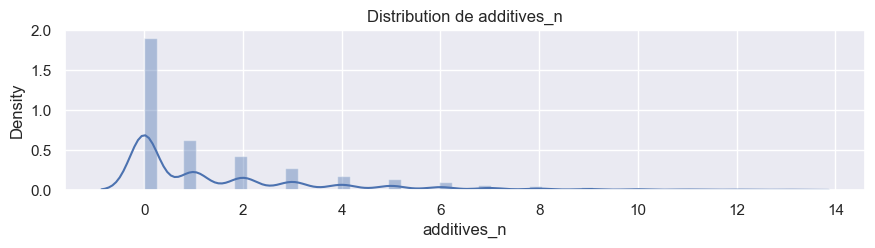

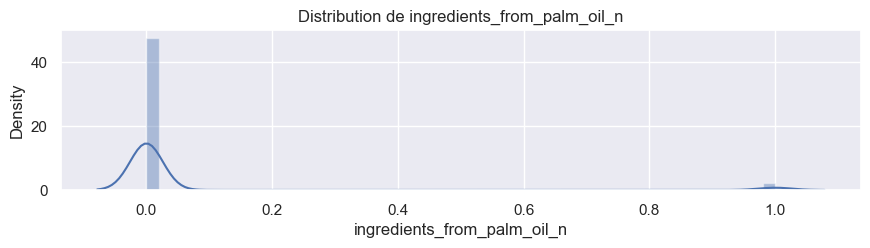

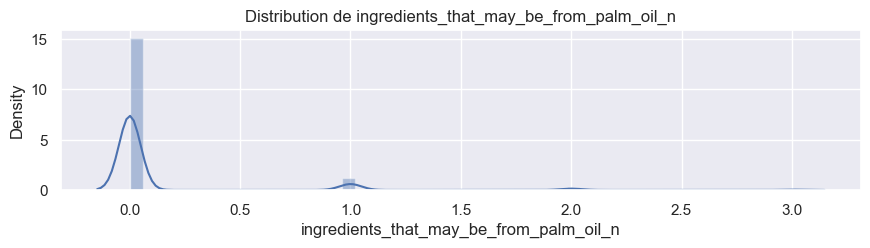

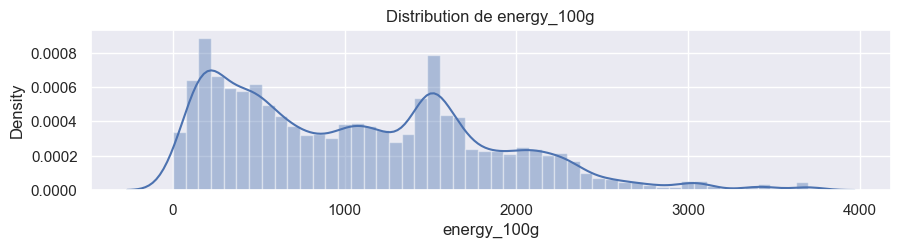

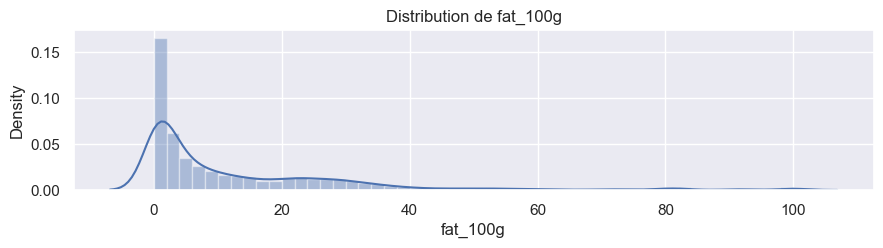

...

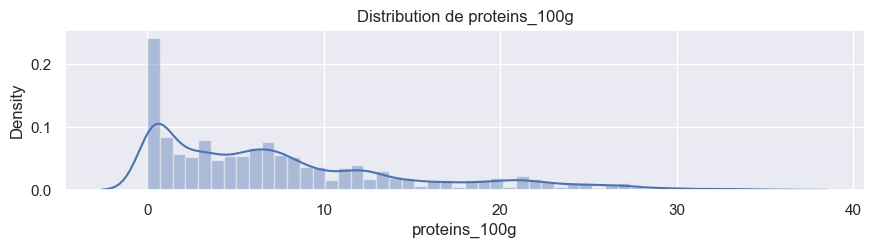

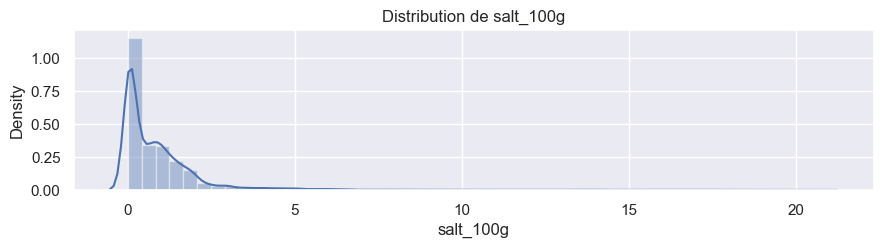

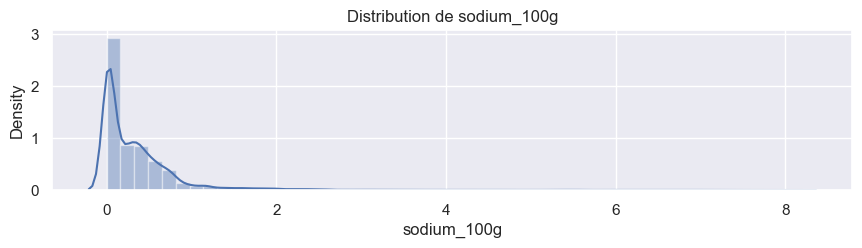

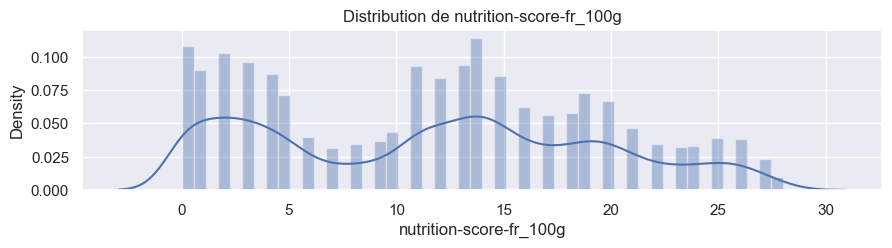

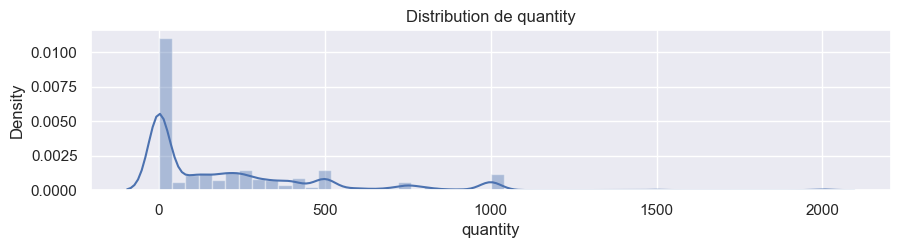

In [28]:
# numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns
# for column in numeric_columns:
#     plt.figure(figsize = (10,2))
#     sns.set(font_scale=1)
#     sns.distplot(data[column], bins=50)
#     chaine = 'Distribution de ' + column
#     plt.title(chaine)
#     plt.xlabel(column)
# #    plt.show()
#     save_figure_opt(chaine,"Aanalyse_univariée_Distribution_par_variable", library='matplotlib')
numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns

for column in numeric_columns:
    plt.figure(figsize = (10,2))
    sns.set(font_scale=1)
    sns.distplot(data[column], bins=50)
    chaine = 'Distribution de ' + column
    plt.title(chaine)
    plt.xlabel(column)
#     x_max = min(100, data[column].max() * 1.1)
#     plt.xlim(0, x_max)
#     plt.ylim(0, 100)
#    plt.show()
    save_figure_opt(chaine,"Aanalyse_univariée_Distribution_par_variable_libre", library='matplotlib')


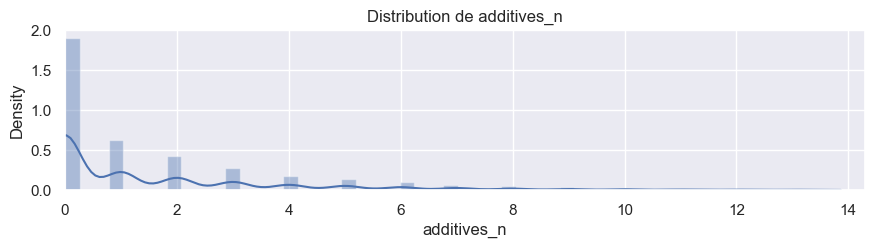

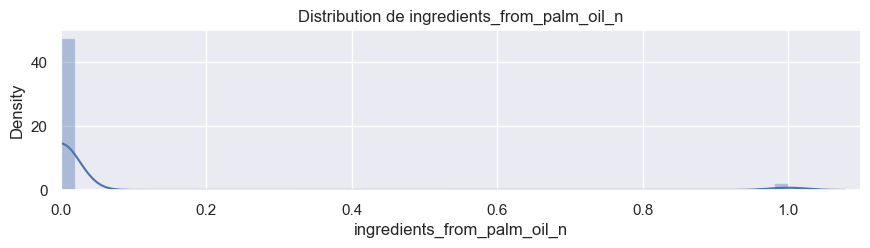

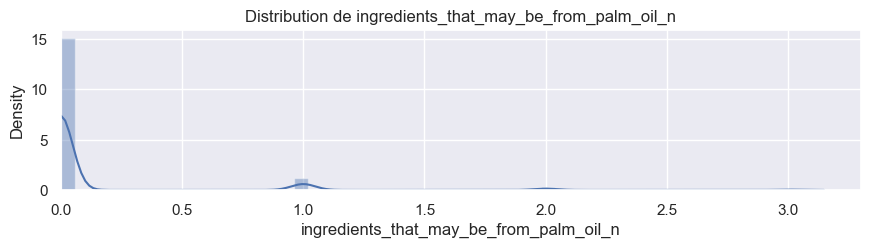

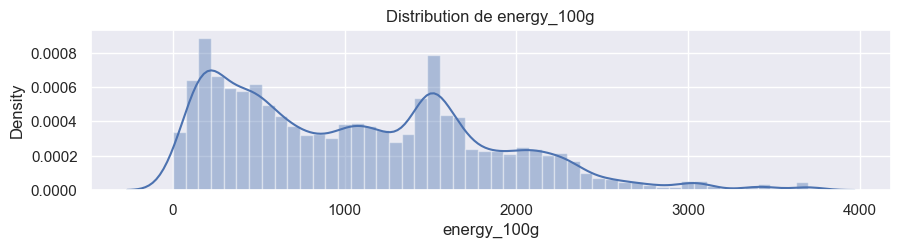

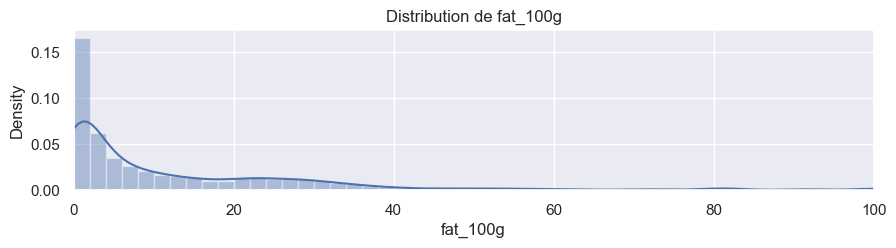

...

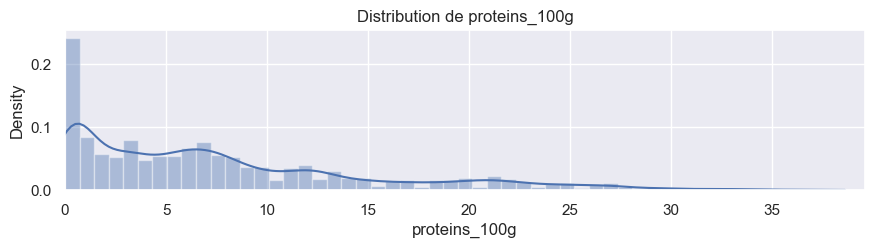

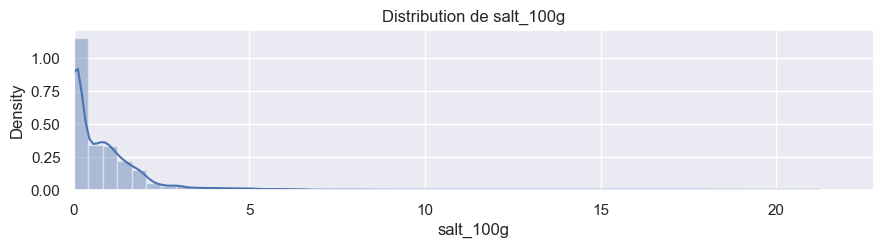

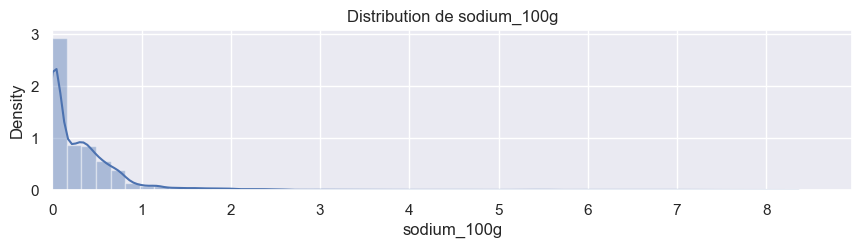

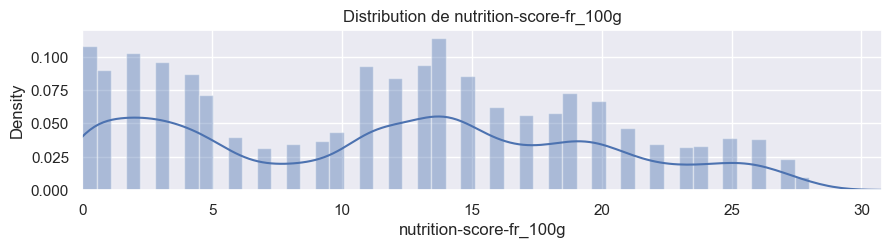

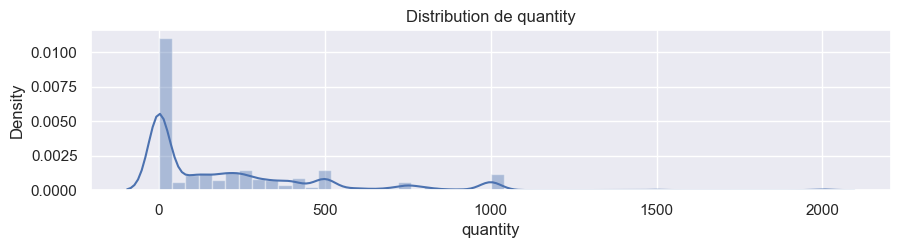

In [29]:
numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns

for column in numeric_columns:
    plt.figure(figsize = (10,2))
    sns.set(font_scale=1)
    if column in ['energy_100g', 'quantity']:
        sns.distplot(data[column].dropna(), bins=50)
    else:
        sns.distplot(data[column], bins=50)
    chaine = 'Distribution de ' + column
    plt.title(chaine)
    plt.xlabel(column)
    if column not in ['energy_100g', 'quantity']:
        x_max = min(100, data[column].max() * 1.1)
        plt.xlim(0, x_max)
    save_figure_opt(chaine,"Aanalyse_univariée_Distribution_par_variable_100g", library='matplotlib')



In [30]:
numeric_columns

Index(['additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity'],
      dtype='object')

**Observations :**
* Certaines distributions ont une allure très semblable:
    * fat_100g
    * saturated-fat_100g
    * carbohydrates_100g (à l’exception de la partie entre 40 et 80g)
    * sugars_100g
    * fiber_100g
    * sodium_100g
    * salt_100g
    * proteins_100g
    
    
* Certaines variables sont discrètes:
    * nutrition-score-fr_100g
    * additives_n

### Boîtes à moustaches

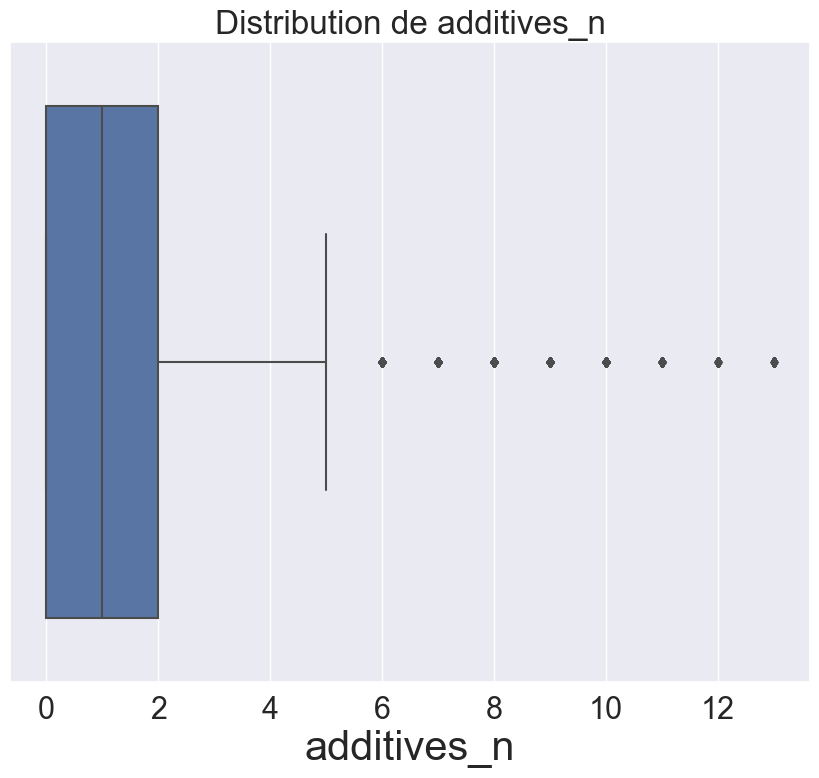

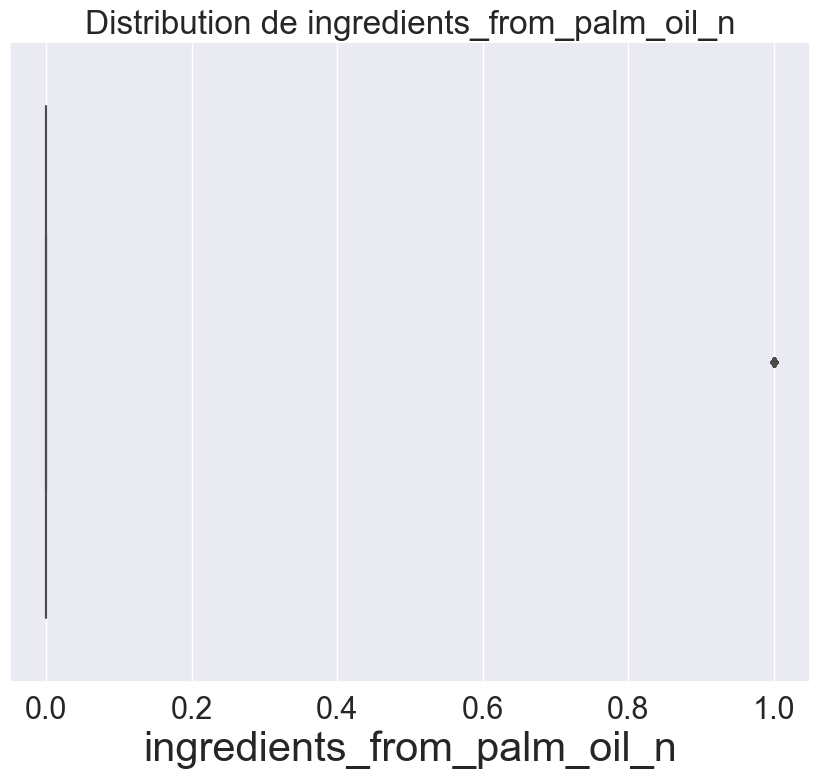

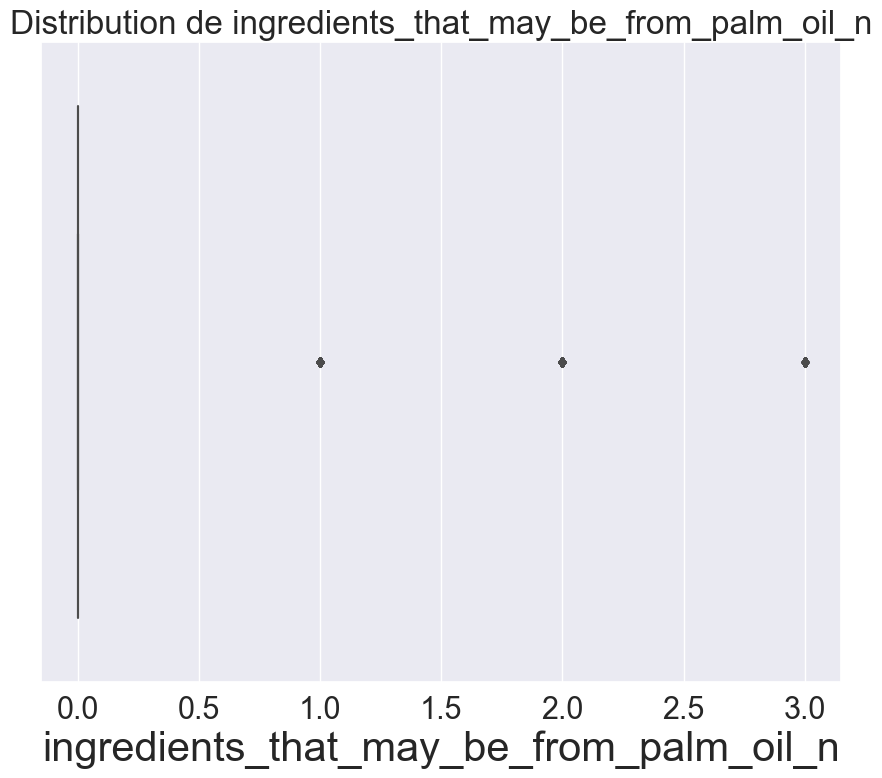

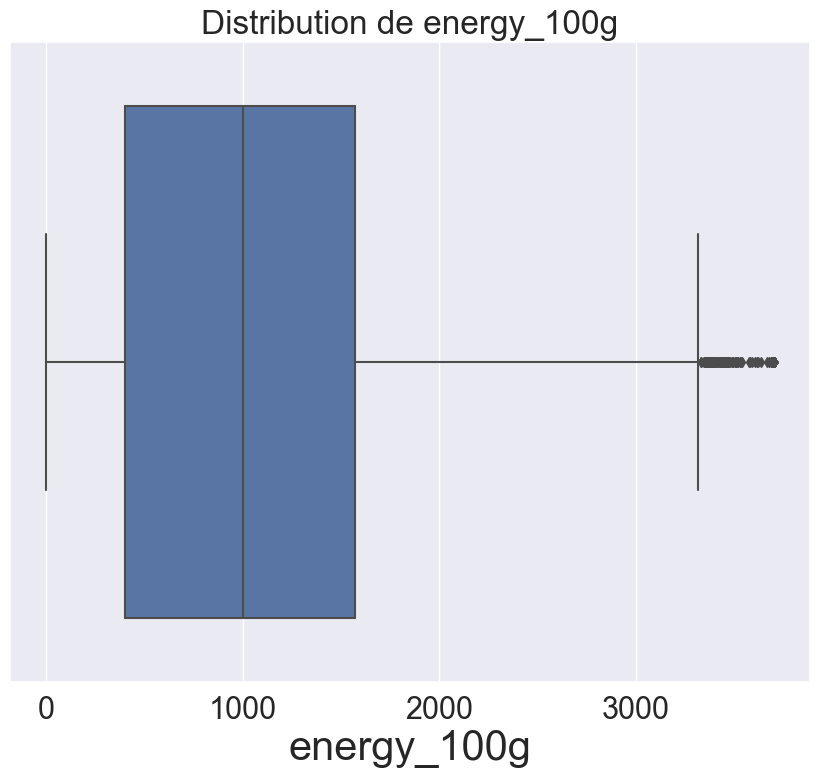

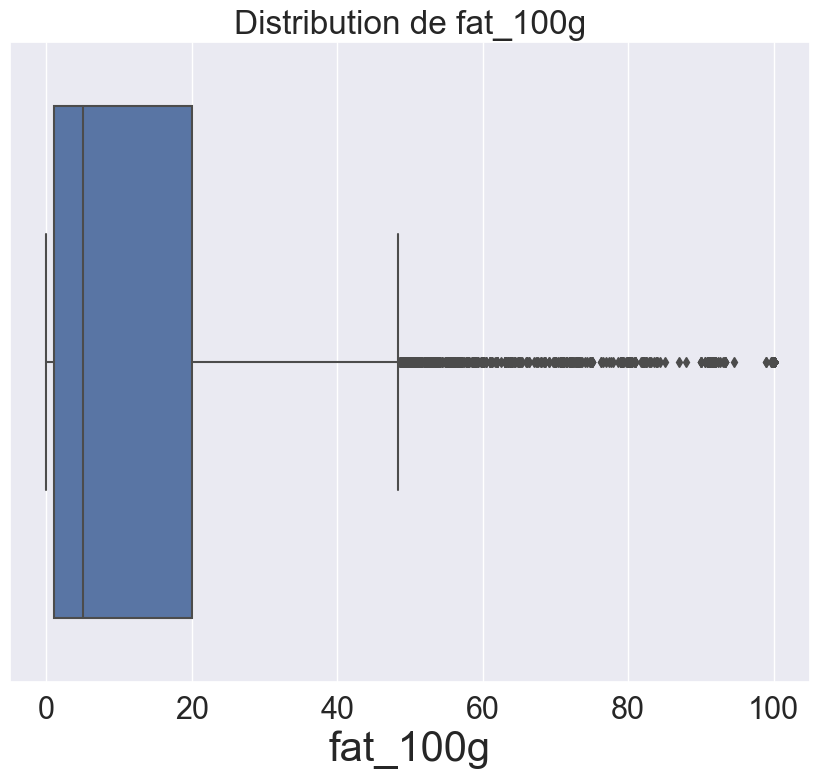

...

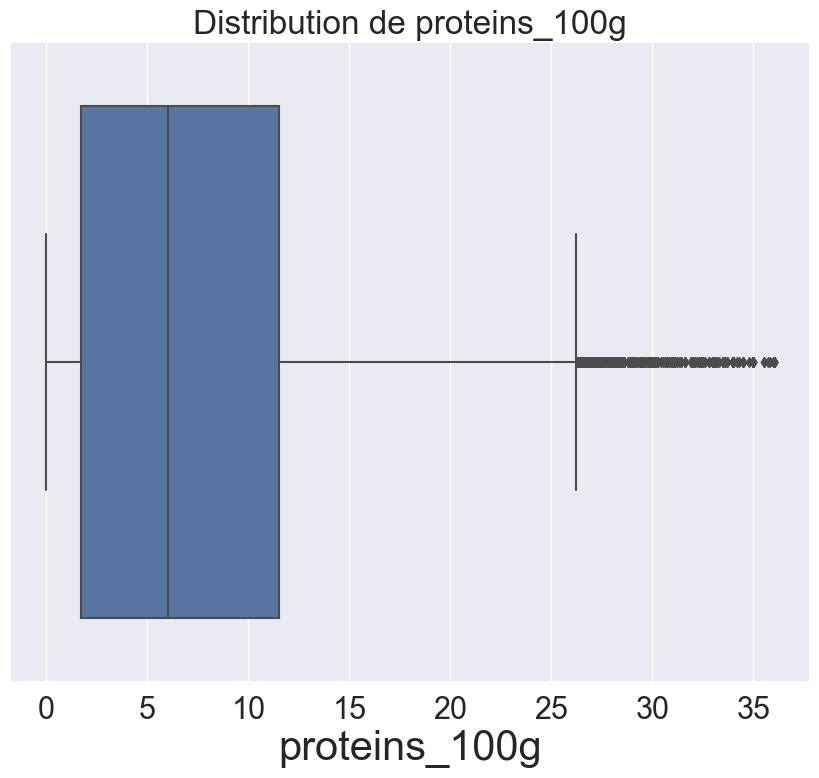

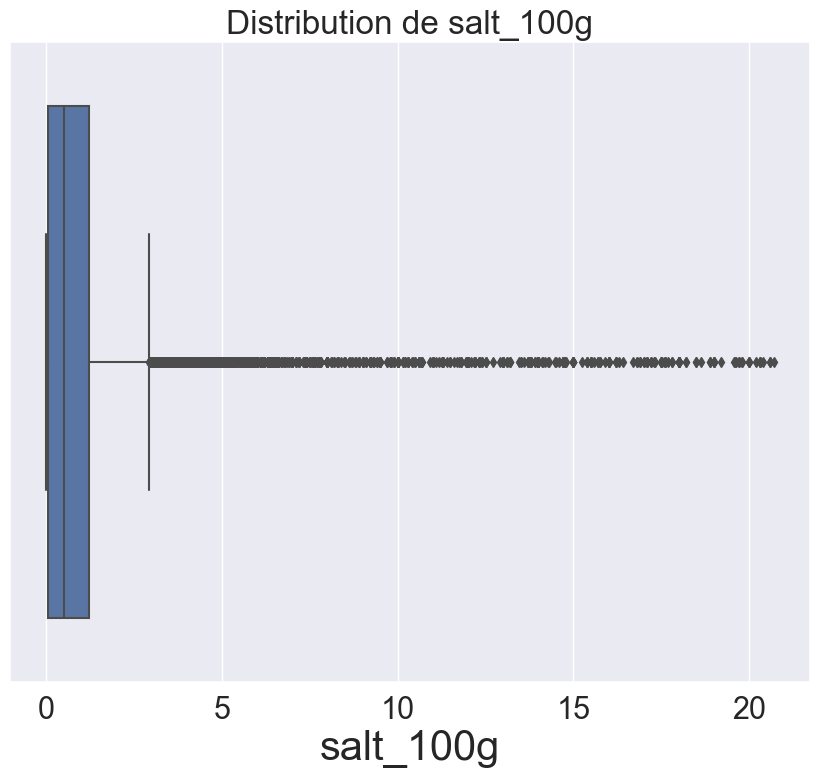

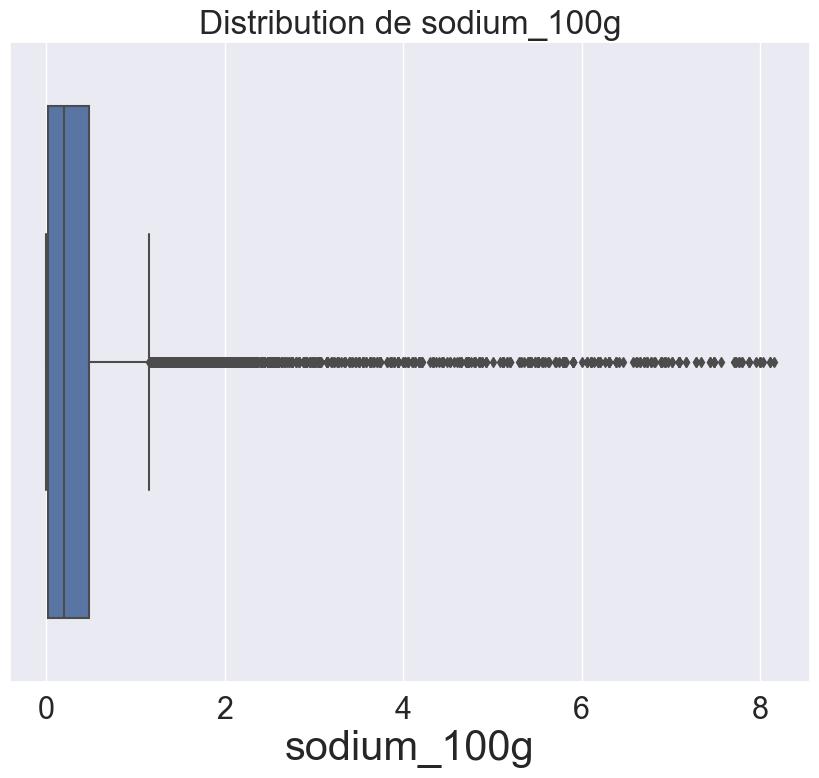

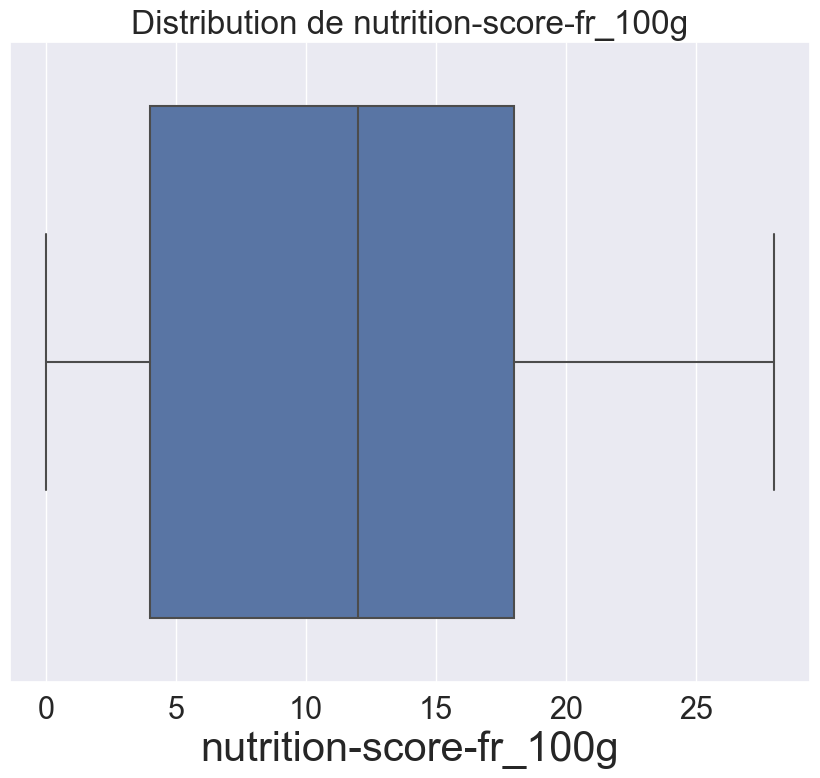

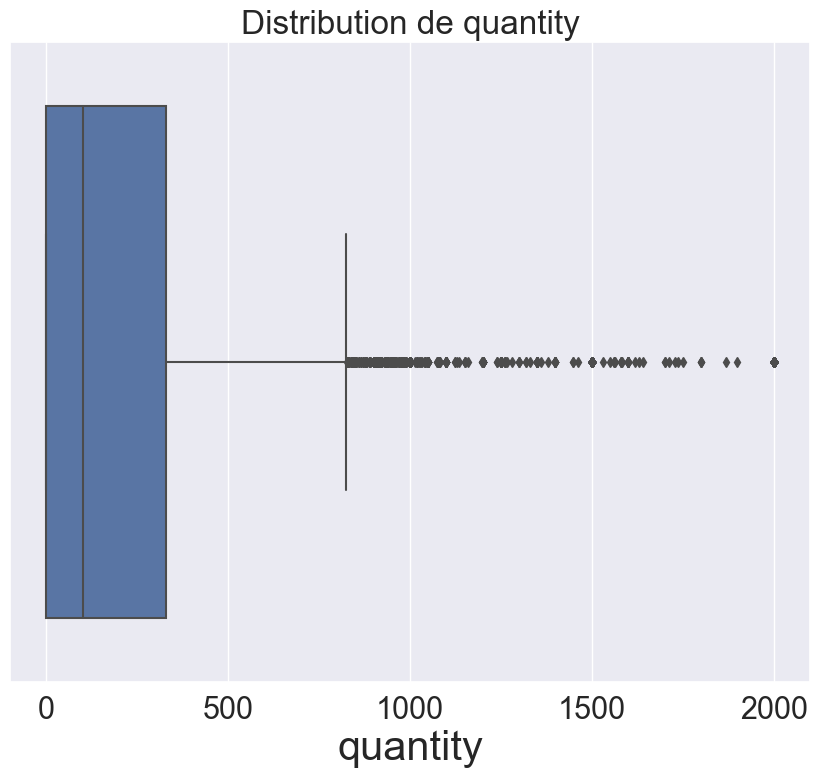

In [31]:
numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns
sns.set(font_scale=2)
for column in numeric_columns:
    plt.figure(figsize = (10,8))
    
    sns.boxplot(data[column])
    chaine = 'Distribution de ' + column
    plt.title(chaine)
    plt.xlabel(column, fontsize=30)
    save_figure_opt(chaine,"Boite_moustache_Distribution_par_variable", library='matplotlib')
#     plt.show()
sns.set(font_scale=1)


En observant les boxplot, on constate que les différentes variables ne semblent pas suivre une loi normale.

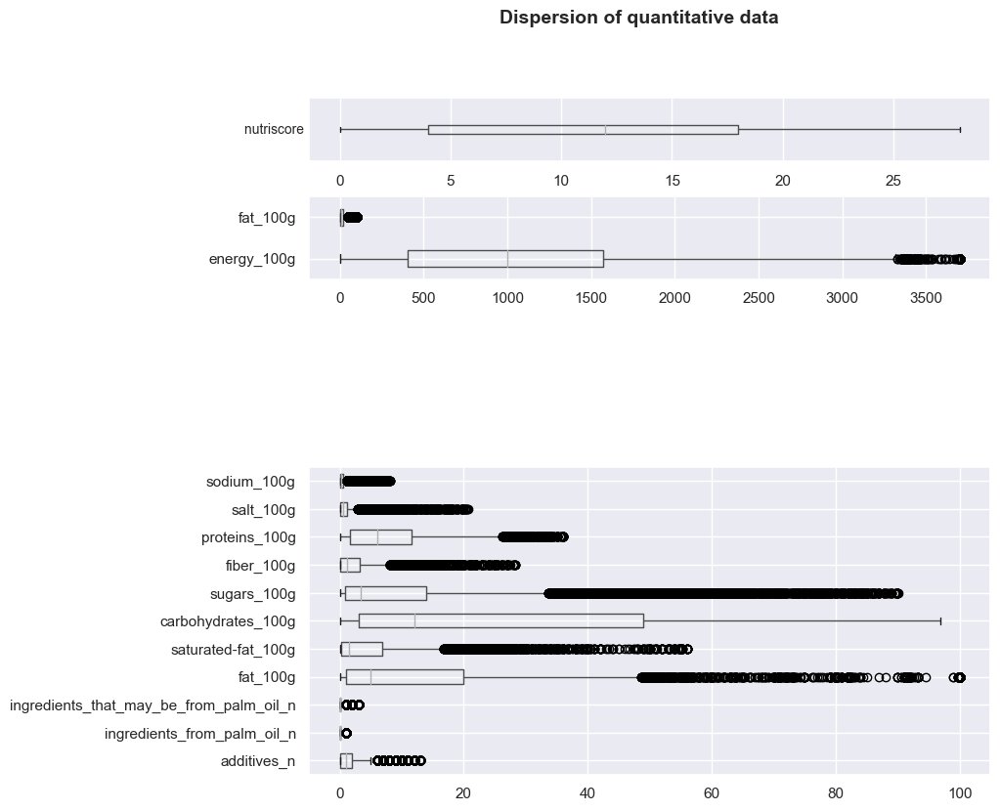

In [32]:
# Plotting boxplot of quantitative features for each nutrigrade

fig = plt.figure(figsize=(9,9))

ax1 = fig.add_subplot(9,1,1)
sel_cols = [ 'nutrition-score-fr_100g']
df[sel_cols].boxplot(vert=False, patch_artist= False, ax=ax1)
# ax1.boxplot(df['nutrition-score-fr_100g'], widths=[0.25], vert=False, patch_artist= False)
ax1.set_ylabel('nutriscore    ', rotation=0, va = 'center', fontsize=10, labelpad = 20)
ax1.set_yticks([])
# ax1.set_yticklabels(['']*10)

ax2 = fig.add_subplot(7,1,2)
# sel_cols = ['energy_100g', 'energy_from_fat_kj_100g']
sel_cols = ['energy_100g', 'fat_100g']
df[sel_cols].boxplot(vert=False, widths=[0.4,0.4], patch_artist= False, ax=ax2)

ax3 = fig.add_subplot(2,1,2)
# sel_cols = ['fat_100g', 'carbohydrates_100g', 'proteins_100g','saturated-fat_100g', 'sugars_100g', 'fiber_100g', 'salt_100g', 'sodium_100g']

sel_cols = ['additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
   'proteins_100g', 'salt_100g', 'sodium_100g']

df[sel_cols].boxplot(vert=False, patch_artist= False, ax=ax3)

plt.suptitle('Dispersion of quantitative data', fontsize=14,
             fontweight='bold')

plt.show()


### Barplots

In [33]:
categories_columns = data.select_dtypes(include = ['category']).columns

In [34]:
categories_columns

Index(['creator', 'quantity_original', 'packaging', 'packaging_tags', 'brands',
       'categories_fr', 'labels_fr', 'countries_fr', 'allergens',
       'additives_tags', 'additives_fr', 'nutrition_grade_fr', 'pnns_groups_1',
       'pnns_groups_2', 'states_fr', 'main_category_fr', 'image_url',
       'image_small_url', 'quantity_origine', 'quantity_unit'],
      dtype='object')

In [35]:
data = affectation_types_object(data)

La colonne cities n'existe pas dans le dataframe
La colonne generic_name n'existe pas dans le dataframe
La colonne brands_tags n'existe pas dans le dataframe
La colonne categories n'existe pas dans le dataframe
La colonne categories_tags n'existe pas dans le dataframe
La colonne categories_en n'existe pas dans le dataframe
La colonne origins n'existe pas dans le dataframe
La colonne origins_tags n'existe pas dans le dataframe
La colonne manufacturing_places n'existe pas dans le dataframe
La colonne manufacturing_places_tags n'existe pas dans le dataframe
La colonne labels n'existe pas dans le dataframe
La colonne labels_tags n'existe pas dans le dataframe
La colonne labels_en n'existe pas dans le dataframe
La colonne emb_codes n'existe pas dans le dataframe
La colonne emb_codes_tags n'existe pas dans le dataframe
La colonne first_packaging_code_geo n'existe pas dans le dataframe
La colonne cities_tags n'existe pas dans le dataframe
La colonne purchase_places n'existe pas dans le datafr

In [36]:
# for column in categories_columns:
#     sns.countplot(x = data[column], data = data)
#     plt.title(column)
#     plt.show()
#     print('')

In [37]:
#for column in data.select_dtypes(include = ['object']).columns:
#    sns.countplot(x = data[column], data = data)
#    plt.show()
#    print('')

In [38]:
# for column in categories_columns:
#     data[column].hist()
#     plt.title(column)
#     plt.show()
#     print('')

### Occurences des mots

In [39]:
object_columns = data.select_dtypes(include = ['object']).columns
object_columns

Index(['code', 'url', 'creator', 'last_modified_t', 'product_name',
       'packaging', 'packaging_tags', 'brands', 'ingredients_text',
       'allergens', 'additives', 'additives_tags', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'image_url', 'image_small_url',
       'quantity'],
      dtype='object')

In [40]:
data.head(1)

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [41]:
df.head(1)

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [42]:
object_columns = ['code',
                  'product_name',
                  'packaging',
                  'brands',
                  'categories',
                  'stores',
                  'ingredients_text',
                  'nutrition_grade_fr',
                  'pnns_groups_1',
                  'pnns_groups_2',
                  'main_category_en', 
                  'manufacturing_places',
                  'labels_fr',
                  'allergens',
                  'additives',
                  'main_category_fr',
                  'image_nutrition_small_url']

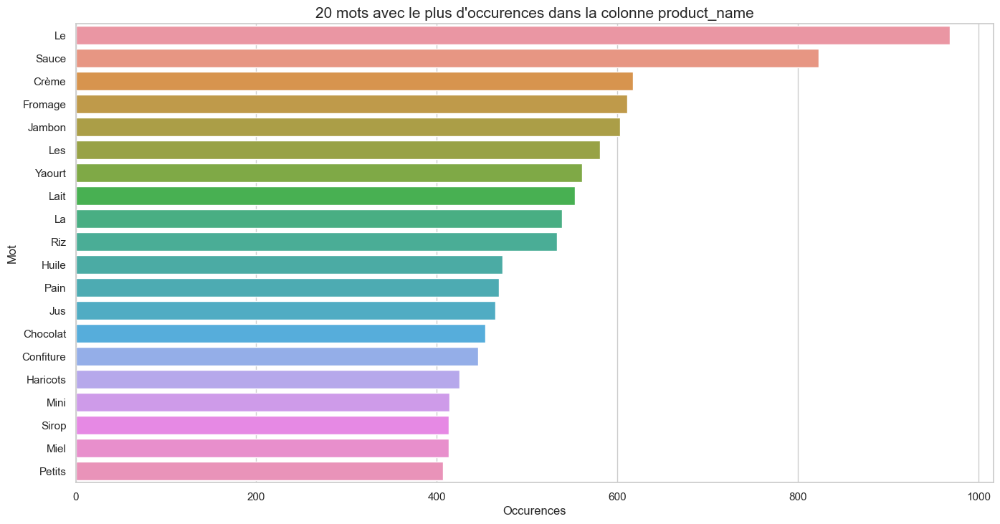

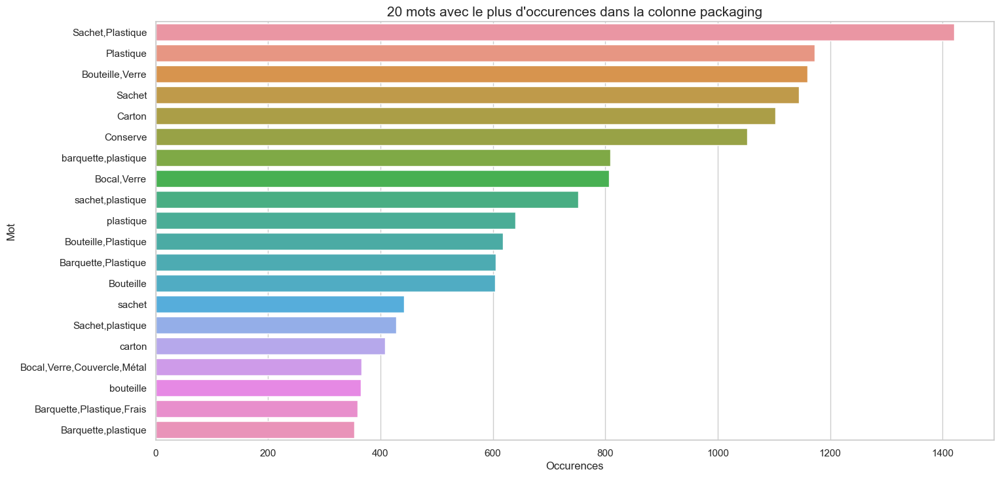

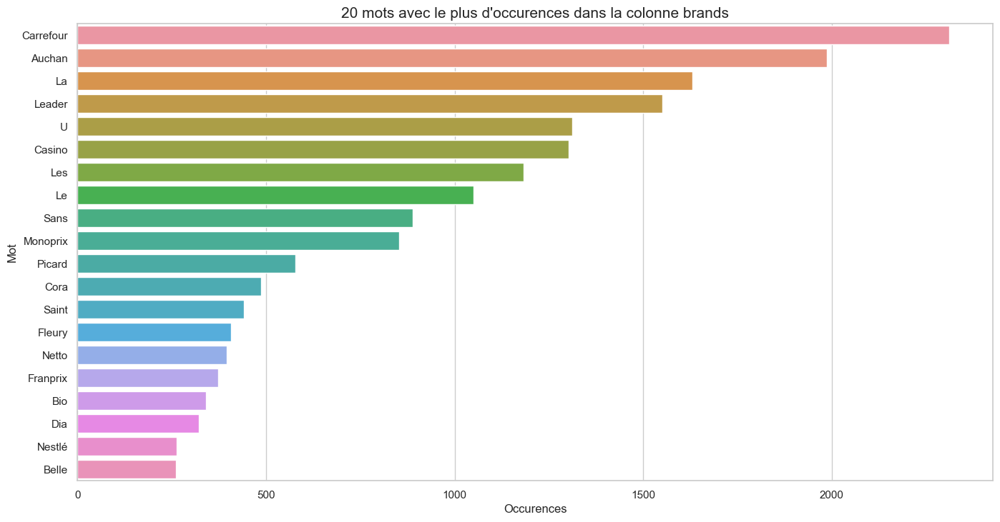

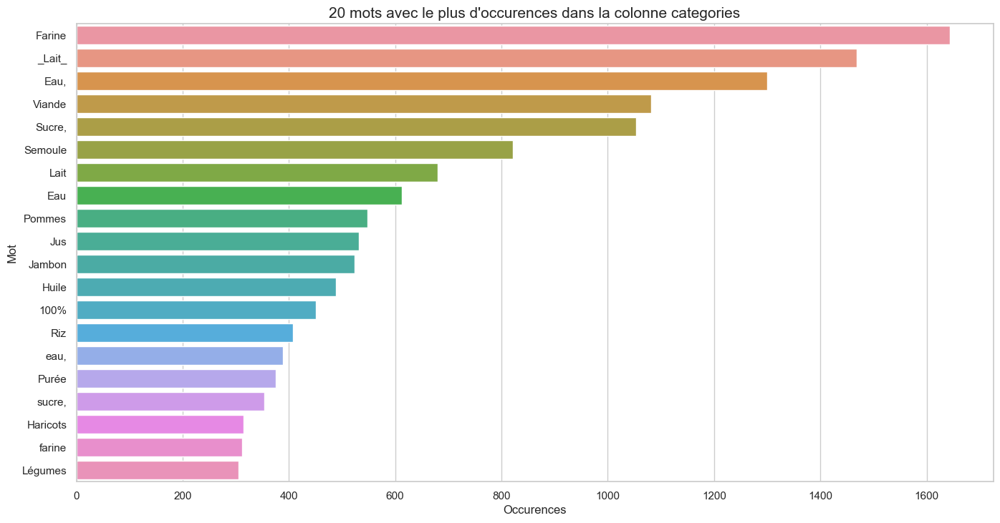

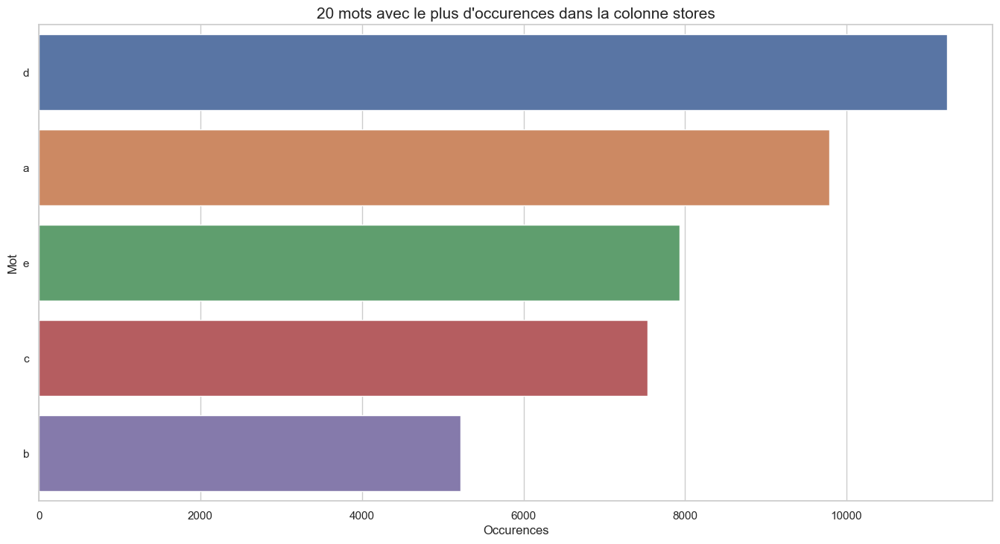

...

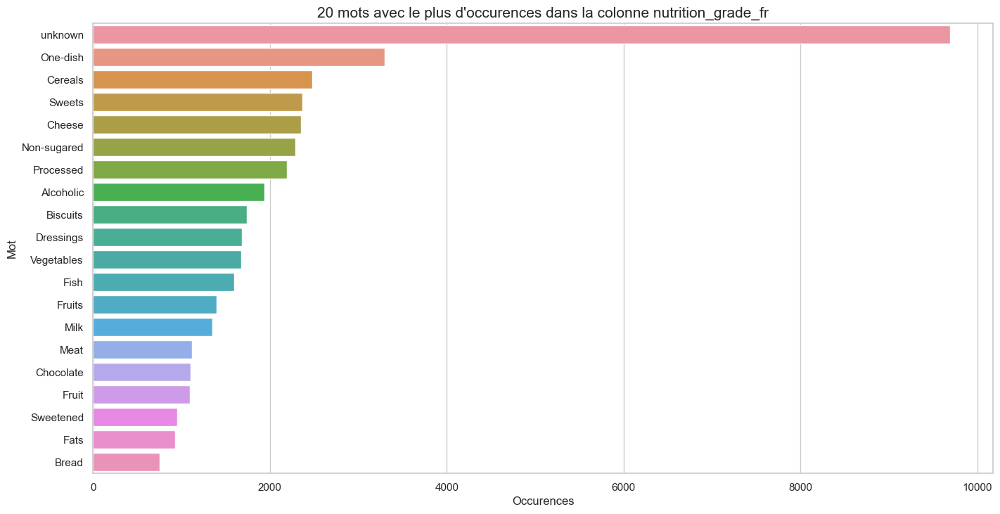

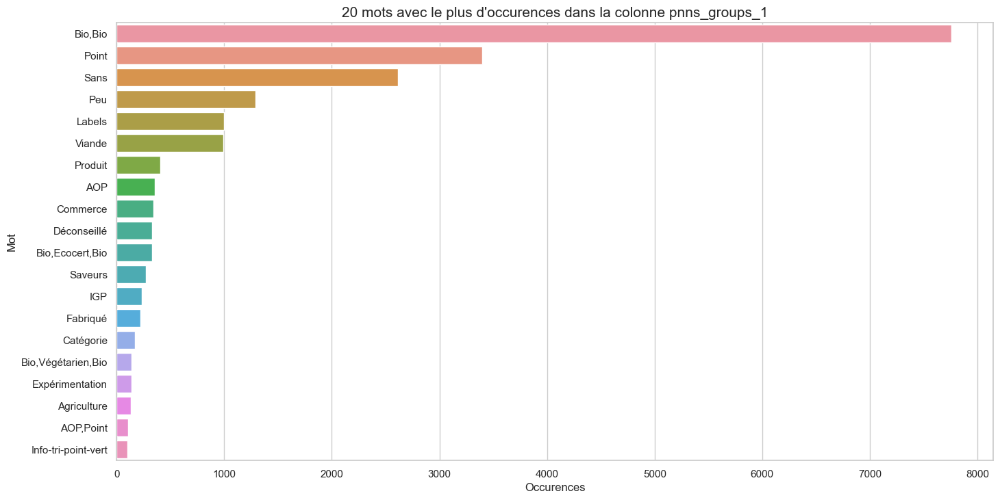

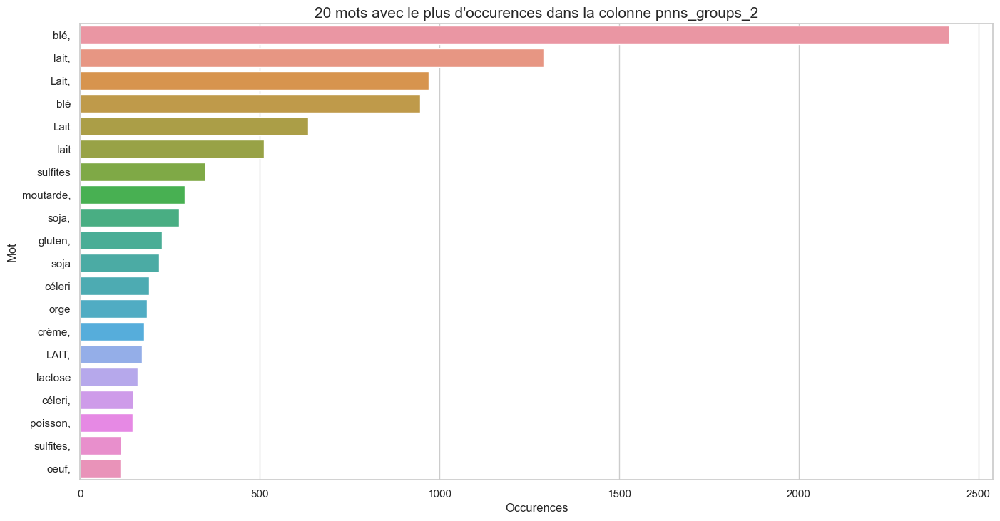

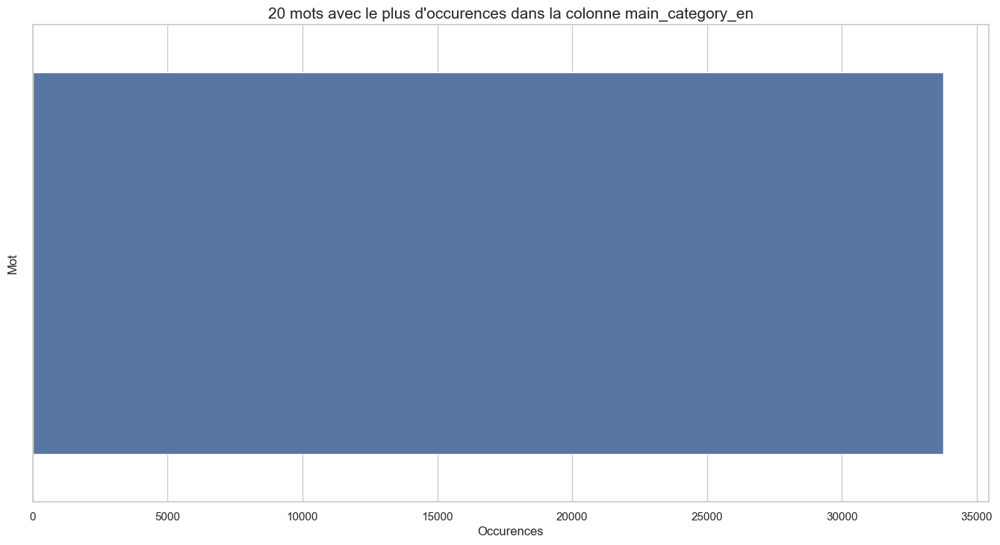

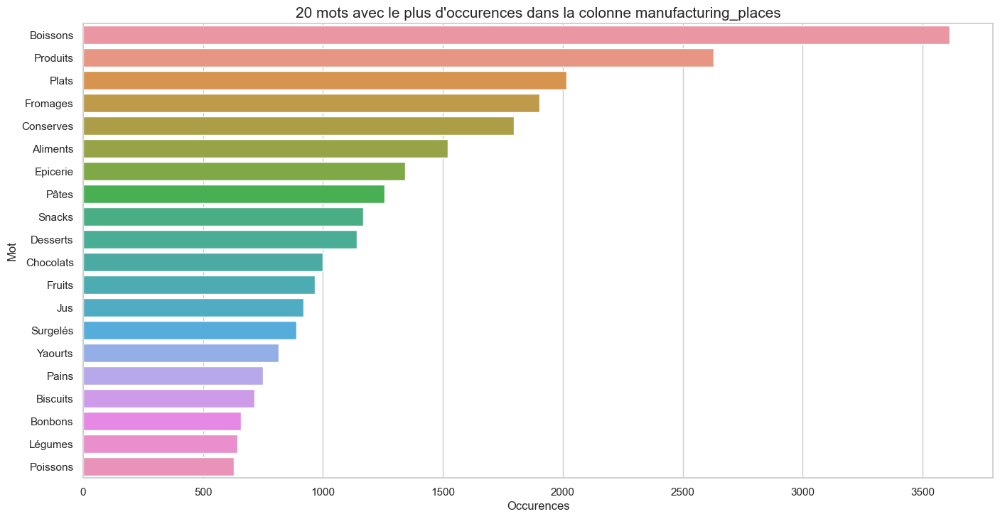

In [43]:
import collections

# Initialisation d'une liste pour stocker les mots populaires de chaque colonne
mots_populaires = []

# Pour chaque colonne de la liste object_columns, vérifier si elle existe dans le dataframe data
for colonne in object_columns :
    if colonne in data.columns:
        # Création d'une liste contenant le premier mot de chaque valeur non nulle de la colonne
        liste_mots = [str(i).split(' ', 1)[0] for i in data[colonne].dropna().tolist()]
        # Ajout des 20 mots les plus fréquents de la colonne dans la liste mots_populaires
        mots_populaires.append(collections.Counter(liste_mots).most_common(20))

# Réglage de la taille de police pour le graphique
sns.set(font_scale=2.5)

# Pour chaque colonne et sa liste de mots populaires, tracer un graphique
for nom_colonne, liste_mots in zip(object_columns[1:], mots_populaires[1:]):
    # Vérification que la liste de mots n'est pas vide
    if liste_mots:
        # Réglages du style et de la taille de la figure
        sns.set(style="whitegrid")
        plt.figure(figsize=(16, 8))

        # Création d'un dataframe contenant les 20 mots les plus fréquents de la colonne
        df_mots_utilises = pd.DataFrame(liste_mots, columns = ['Mot', 'Occurences']).sort_values(by='Occurences', ascending=False)
        df_mots_utilises.head()

        # Tracé d'un graphique en barres horizontales des mots et de leur fréquence
        sns.barplot(y = 'Mot', x='Occurences', data = df_mots_utilises)
        chaine = 'occurences_de_la_colonne_' + nom_colonne
        # Ajout d'un titre au graphique
        plt.title('20 mots avec le plus d\'occurences dans la colonne ' + nom_colonne, size=15)
        
        # Affichage du graphique
        #plt.show()
        save_figure_opt(chaine,"Occurence_par_variable_", library='matplotlib')

# Réinitialisation de la taille de police à la valeur par défaut
sns.set(font_scale=1)



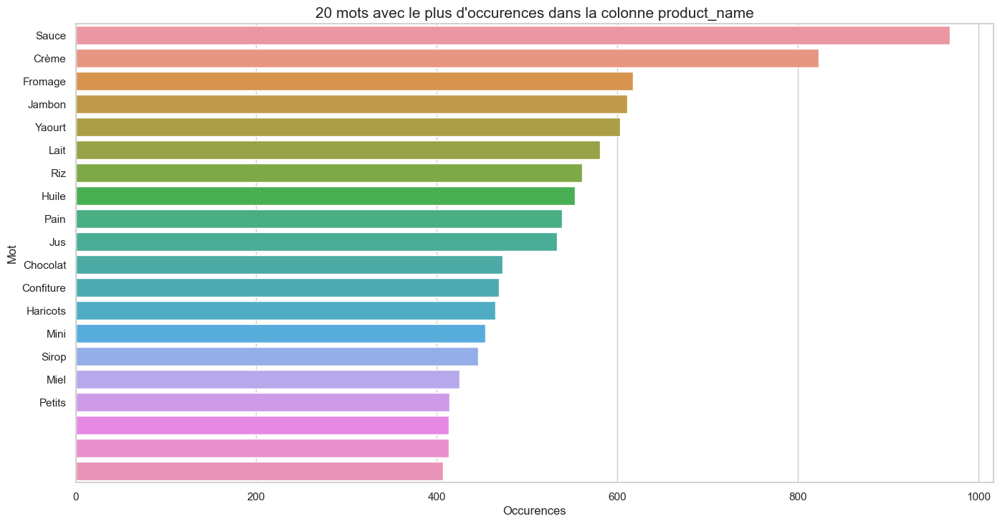

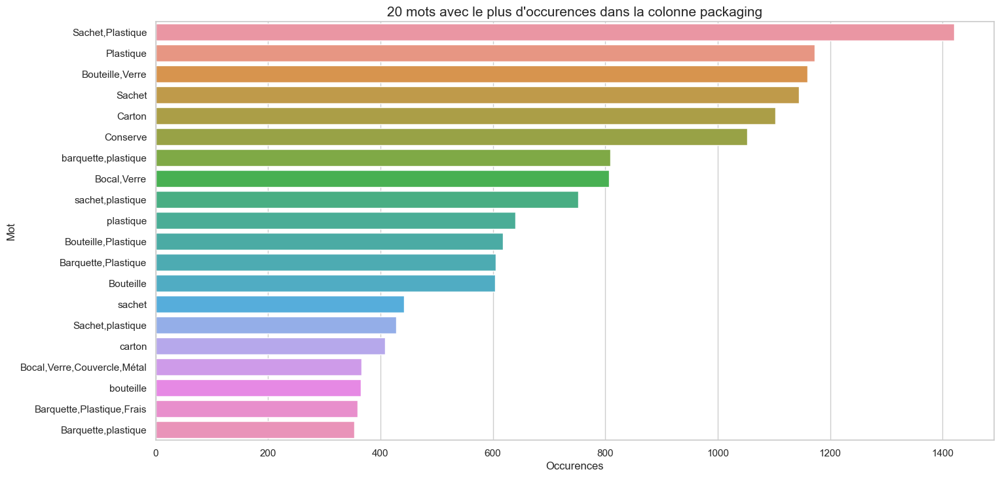

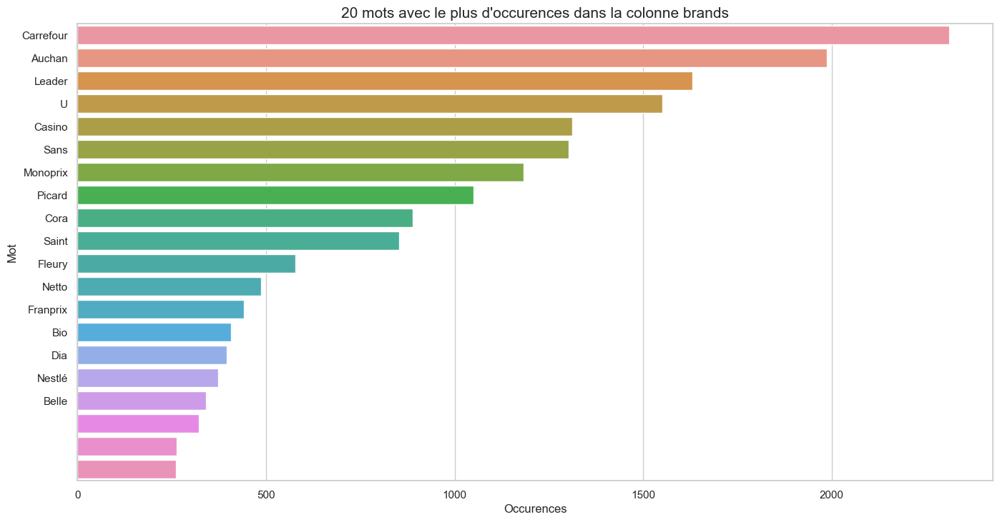

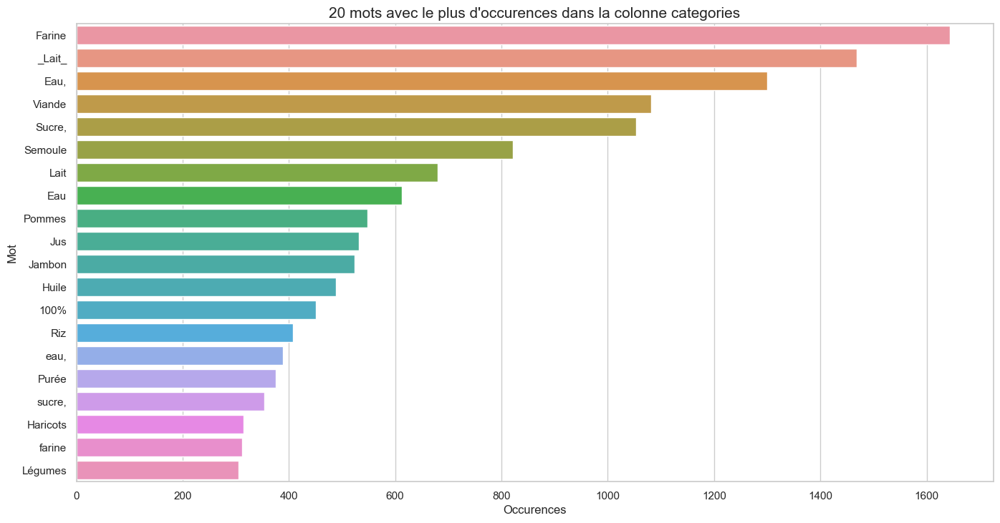

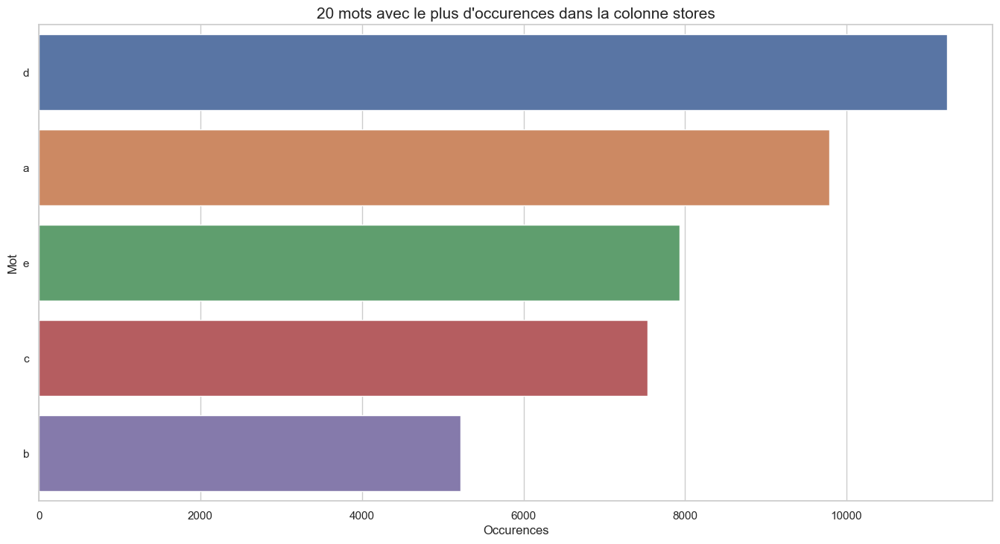

...

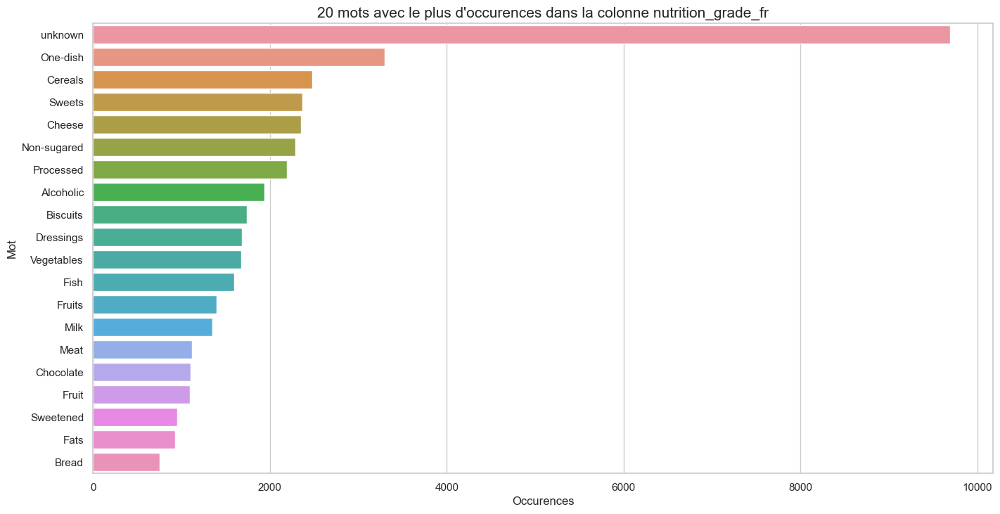

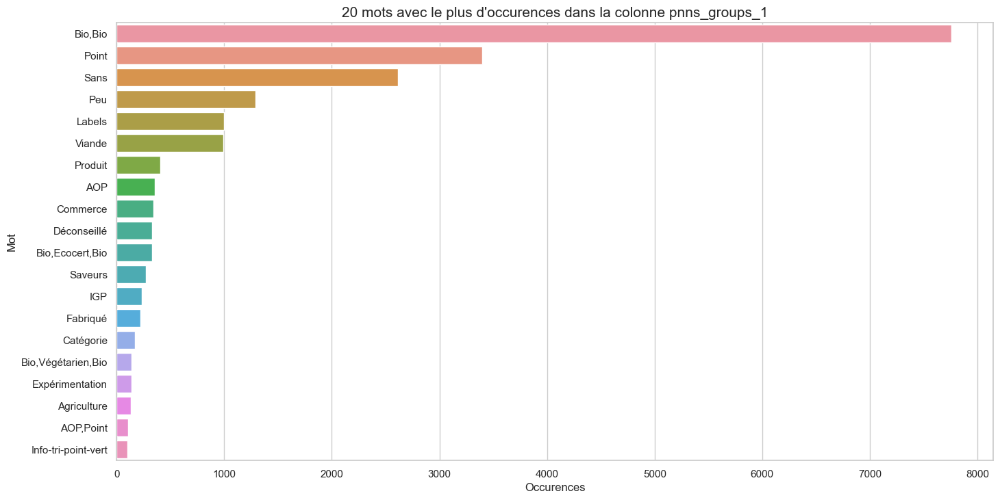

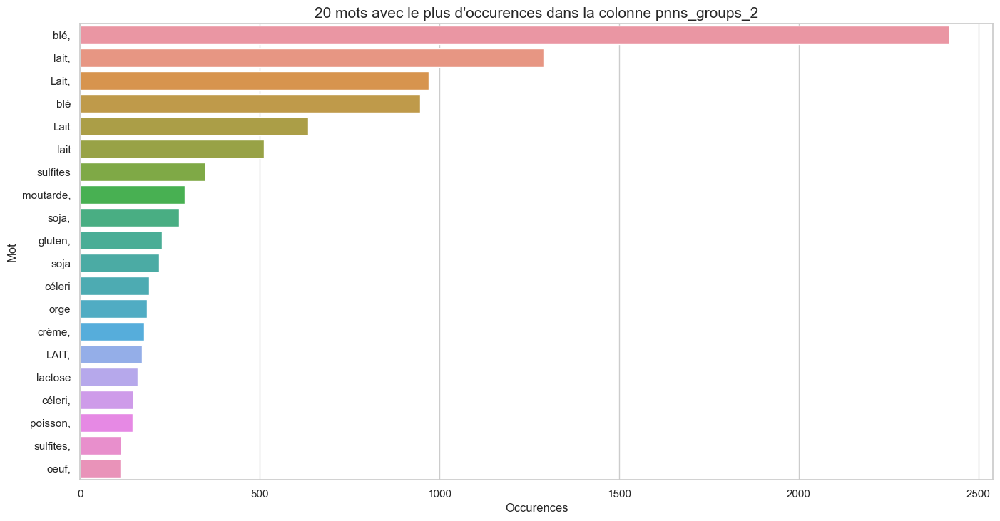

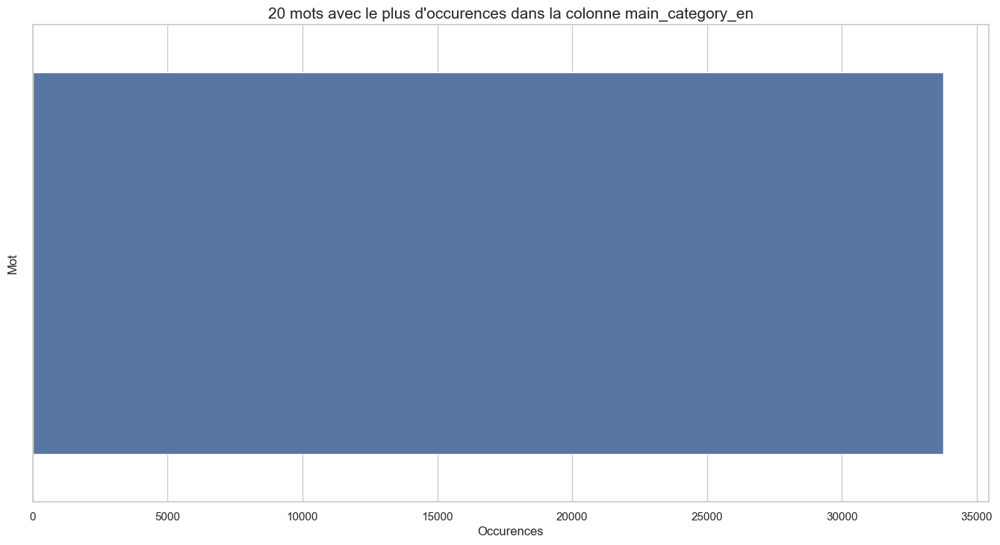

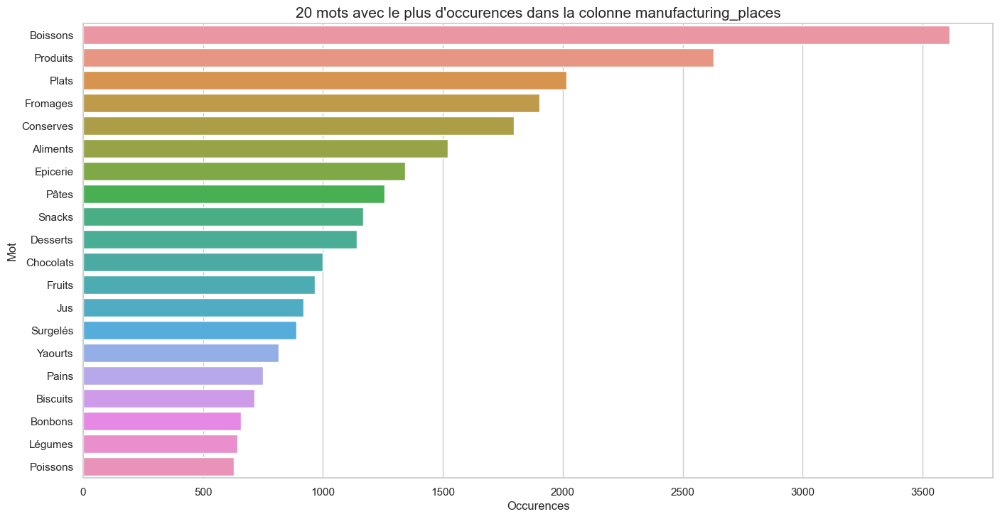

In [44]:
import collections

# Initialisation d'une liste pour stocker les mots populaires de chaque colonne
mots_populaires = []

# Pour chaque colonne de la liste object_columns, vérifier si elle existe dans le dataframe data
for colonne in object_columns :
    if colonne in data.columns:
        # Création d'une liste contenant le premier mot de chaque valeur non nulle de la colonne
        liste_mots = [str(i).split(' ', 1)[0] for i in data[colonne].dropna().tolist()]
        # Ajout des 20 mots les plus fréquents de la colonne dans la liste mots_populaires
        mots_populaires.append(collections.Counter(liste_mots).most_common(20))

# Réglage de la taille de police pour le graphique
sns.set(font_scale=2.5)

# Pour chaque colonne et sa liste de mots populaires, tracer un graphique
for nom_colonne, liste_mots in zip(object_columns[1:], mots_populaires[1:]):
    # Vérification que la liste de mots n'est pas vide
    if liste_mots:
        # Réglages du style et de la taille de la figure
        sns.set(style="whitegrid")
        plt.figure(figsize=(16, 8))

        # Création d'un dataframe contenant les 20 mots les plus fréquents de la colonne
        df_mots_utilises = pd.DataFrame(liste_mots, columns = ['Mot', 'Occurences']).sort_values(by='Occurences', ascending=False)
        df_mots_utilises.head()

        # Tracé d'un graphique en barres horizontales des mots et de leur fréquence
        sns.barplot(y = 'Mot', x='Occurences', data = df_mots_utilises)
        chaine = 'occurences_de_la_colonne_' + nom_colonne
        # Ajout d'un titre au graphique
        plt.title('20 mots avec le plus d\'occurences dans la colonne ' + nom_colonne, size=15)
        
        # Suppression des articles définis et indéfinis dans les labels de l'axe y
        labels = [label.get_text() for label in plt.gca().get_yticklabels()]
        labels = [label for label in labels if label not in ['le', 'la', 'les', 'un', 'une', 'des','Le', 'La', 'Les', 'Un', 'Une', 'Des']]
        plt.yticks(range(len(labels)), labels)
        
        # Réduction de l'espace blanc autour du graphique
        plt.tight_layout()
        
        # Affichage du graphique
        #plt.show()
        save_figure_opt(chaine,"Occurence_par_variable_", library='matplotlib')

# Réinitialisation de la taille de police à la valeur par défaut
sns.set(font_scale=1)


### Informations sur les données

In [45]:
df.head(1)

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [46]:
qual_cols = ['nutrition_grade_fr', 'pnns_groups_1', 'pnns_groups_2','brands',
 'countries_fr', 'categories_fr', 'main_category_fr',
 'additives', 'labels_fr', 'allergens', 'packaging',
 'packaging']

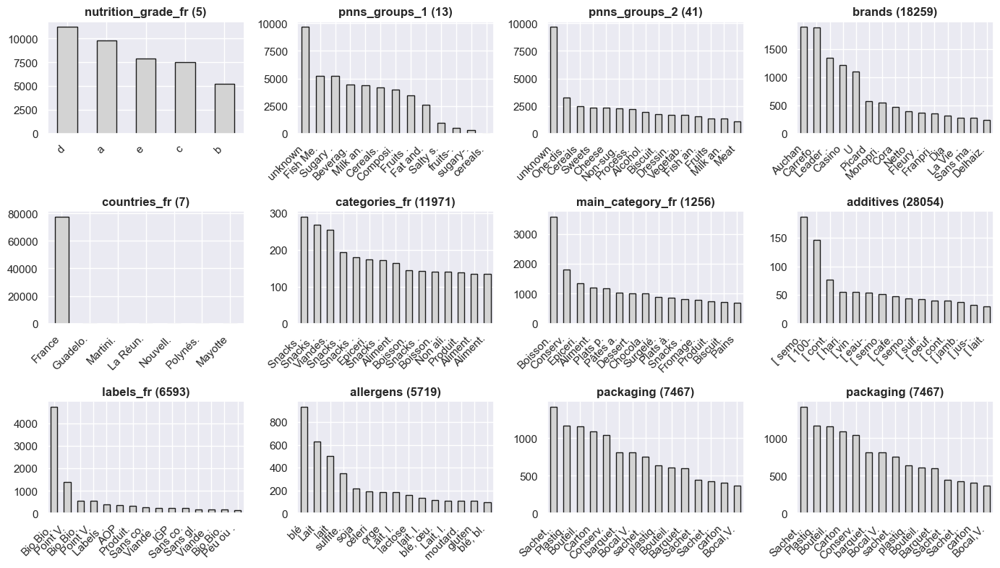

In [47]:
# Plotting bar plots of the main categorical columns

fig = plt.figure(figsize=(14,10))
for i, c in enumerate(qual_cols,1):
    ax = fig.add_subplot(4,4,i)
    ser = df[c].value_counts()
    n_cat = ser.shape[0]
    if n_cat>15:
        ser[0:15].plot.bar(color='lightgrey',ec='k', ax=ax)
    else:
        ser.plot.bar(color='lightgrey',ec='k',ax=ax)
    ax.set_title(c+f' ({n_cat})', fontweight='bold')
    labels = [item.get_text() for item in ax.get_xticklabels()]
    short_labels = [s[0:7]+'.' if len(s)>7 else s for s in labels]
    ax.axes.set_xticklabels(short_labels)
    plt.xticks(rotation=45, ha='right')
plt.tight_layout()

plt.show()

Certaines caractéristiques ont beaucoup de catégories ('main category_fr', 'brands', 'packaging', tandis que d'autres ('nutrition_grade_fr', 'pnns_groups_1' 'pnns_groups_2' en ont moins.

## 2 Analyse temporelle 
Nous allons définir des fonctions utiles pour l'analyse temporelle des données présentées ci-dessous.

## 2.1 Evolution au fil du temps 
Traçons le nombre de nouvelles entrées par périodes de temps.

In [48]:
data 

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434535914,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238638,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1473538082,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1442570752,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations nutritionnelles à compléter,Ingrédients complétés,Date limite à compléter,Caractéristiques complétées,Catégories complétées,Marques complétées,Emballage complété,Quantité complétée,Nom d

In [49]:
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned6.csv')

In [50]:
df

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434535914,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238638,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1473538082,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1442570752,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations nutritionnelles à compléter,Ingrédients complétés,Date limite à compléter,Caractéristiques complétées,Catégories complétées,Marques complétées,Emballage complété,Quantité complétée,Nom d

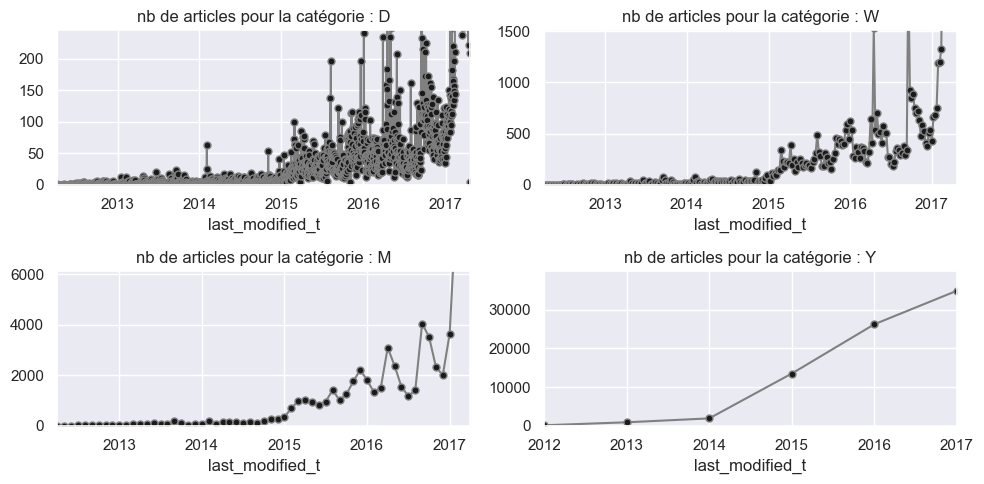

In [51]:
# # Convertir "last_modified_t" en index de date et heure
# df['last_modified_t'] = pd.to_datetime(df['last_modified_t'], unit='s')
# df.set_index('last_modified_t', inplace=True)
# Vérifier si "last_modified_t" existe dans le dataframe
df_f1 = df.copy()
# if 'last_modified_t' in df.columns:
#     # Vérifier si "last_modified_t" a besoin d'être converti en datetime index
#     if not pd.api.types.is_datetime64_any_dtype(df['last_modified_t']):
#         df_f1['last_modified_t'] = pd.to_datetime(df['last_modified_t'], unit='s')

#     # Vérifier si la colonne "last_modified_t" est l'index du dataframe
#     if 'last_modified_t' not in df.index.names:
#         df_f1.set_index('last_modified_t', inplace=True)
# else:
df_f1['last_modified_t'] = pd.to_datetime(df['last_modified_t'], unit='s')
df_f1.set_index('last_modified_t', inplace=True)
# print(df_f1['last_modified_t'])
# Tracer le nombre de nouveaux éléments au fil du temps
fig = plt.figure(figsize=(10,5))  # Créer une figure
for i,per in enumerate(['D', 'W', 'M', 'Y'],1):  # Itérer sur les fréquences de temps (Jour, Semaine, Mois, Année)
    ax = fig.add_subplot(2,2,i)  # Ajouter un sous-plot à la figure
    t_ser = df_f1.groupby(pd.Grouper(freq=per)).size()  # Grouper les données par période de temps (fréquence) et calculer la taille de chaque groupe
    t_ser.plot(ax=ax, ms=5, marker='o', mfc='k', color='grey', ls='-')  # Tracer les données sur le sous-plot
    ax.set(ylim=(0,np.mean(t_ser)+2*np.std(t_ser)))  # Définir la limite verticale des données
    ax.set_title("nb de articles pour la catégorie : "+per)  # Définir le titre du sous-plot
fig.tight_layout()  # Ajuster la disposition des sous-plots
plt.show()  # Afficher la figure



In [52]:
df_f1

,code,url,creator,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
last_modified_t,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-09-17 09:18:13,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
2015-06-17 10:11:54,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2016-03-17 18:17:18,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
2016-09-10 20:08:02,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
2015-09-18 10:05:52,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations nutritionnelles à compléter,Ingrédients complétés,Date limite à compléter,Caractéristiques complétées,Catégories

In [53]:
df

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434535914,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238638,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1473538082,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1442570752,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations nutritionnelles à compléter,Ingrédients complétés,Date limite à compléter,Caractéristiques complétées,Catégories complétées,Marques complétées,Emballage complété,Quantité complétée,Nom d

la colonne existe dans le dataframe
les colonnes df 
Index(['code', 'url', 'creator', 'last_modified_t', 'product_name',
       'quantity_original', 'packaging', 'packaging_tags', 'brands',
       'categories_fr', 'labels_fr', 'countries_fr', 'ingredients_text',
       'allergens', 'additives_n', 'additives', 'additives_tags',
       'additives_fr', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')
0       2016-09-17 09:18:13
1       2015-06-17 10:11:54
2       2016-03-17 18:17:18
3       2016-09-10 20:08:02
4       2015-09-18 10:05:52
                ...        

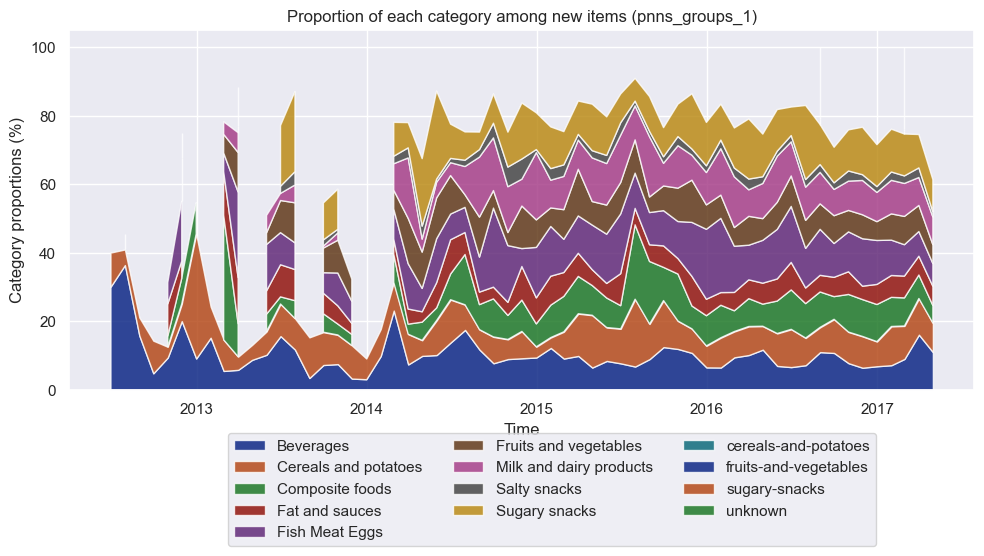

In [151]:
# Plotting proportion of pnns1 among newly entered items
# # Charger les données
# df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned6.csv')
# df
pnns1_n_item_prop = plot_cat_prop_thr_time(df, 'pnns_groups_1')

plt.show()



In [152]:
df

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,2016-09-17 09:18:13,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,2015-06-17 10:11:54,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,2016-03-17 18:17:18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,2016-09-10 20:08:02,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,2015-09-18 10:05:52,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations nutritionnelles à compléter,Ingrédients complétés,Date limite à compléter,Caractéristiques complétées,Catégories complétées,Marques complétée

In [153]:
# calculating regression for the proportion on new items
# for each pnns1 category through time

reg_pnns1_prop = mult_reg_thr_time(pnns1_n_item_prop)
reg_pnns1_prop

,Beverages,Cereals and potatoes,Composite foods,Fat and sauces,Fish Meat Eggs,Fruits and vegetables,Milk and dairy products,Salty snacks,Sugary snacks,cereals-and-potatoes,fruits-and-vegetables,sugary-snacks,unknown
coef,-0.010993,0.013235,-0.011801,0.008326,-0.023587,0.004548,0.002391,-0.000410,0.003048,-0.000387,-0.003408,0.000091,0.018948
intercept,10.950413,7.231405,10.330579,4.855372,13.429752,7.438017,9.194215,2.272727,11.673554,0.103306,1.549587,0.516529,20.454545
mean,9.955553,8.429160,9.262558,5.608898,11.295156,7.849588,9.410565,2.235631,11.949368,0.068308,1.241149,0.524753,22.169311


In [154]:
df

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,2016-09-17 09:18:13,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,2015-06-17 10:11:54,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,2016-03-17 18:17:18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,2016-09-10 20:08:02,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,2015-09-18 10:05:52,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations nutritionnelles à compléter,Ingrédients complétés,Date limite à compléter,Caractéristiques complétées,Catégories complétées,Marques complétée

In [160]:
pnns1_n_item_prop

In [156]:
pnns1_n_item_prop = pnns1_n_item_prop.fillna(0).round(2)
pnns1_n_item_prop = pnns1_n_item_prop.drop('unknown', axis=1, inplace=True)



In [159]:
pnns1_n_item_prop 


In [242]:
reg_pnns1_prop = mult_test(data_df = pnns1_n_item_prop, test_func = 'stat',
                           res_df=reg_pnns1_prop, print_opt=True)

           Beverages  Cereals and potatoes  Composite foods  Fat and sauces  \
coef      -0.010993   0.013235             -0.011801         0.008326         
intercept  10.950413  7.231405              10.330579        4.855372         
mean       9.955553   8.429160              9.262558         5.608898         

           Fish Meat Eggs  Fruits and vegetables  Milk and dairy products  \
coef      -0.023587        0.004548               0.002391                  
intercept  13.429752       7.438017               9.194215                  
mean       11.295156       7.849588               9.410565                  

           Salty snacks  Sugary snacks  cereals-and-potatoes  \
coef      -0.000410      0.003048      -0.000387               
intercept  2.272727      11.673554      0.103306               
mean       2.235631      11.949368      0.068308               

           fruits-and-vegetables  sugary-snacks    unknown  
coef      -0.003408               0.000091       0.01894

la colonne existe dans le dataframe
les colonnes df 
Index(['code', 'url', 'creator', 'last_modified_t', 'product_name',
       'quantity_original', 'packaging', 'packaging_tags', 'brands',
       'categories_fr', 'labels_fr', 'countries_fr', 'ingredients_text',
       'allergens', 'additives_n', 'additives', 'additives_tags',
       'additives_fr', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')
0       2016-09-17 09:18:13
1       2015-06-17 10:11:54
2       2016-03-17 18:17:18
3       2016-09-10 20:08:02
4       2015-09-18 10:05:52
                ...        

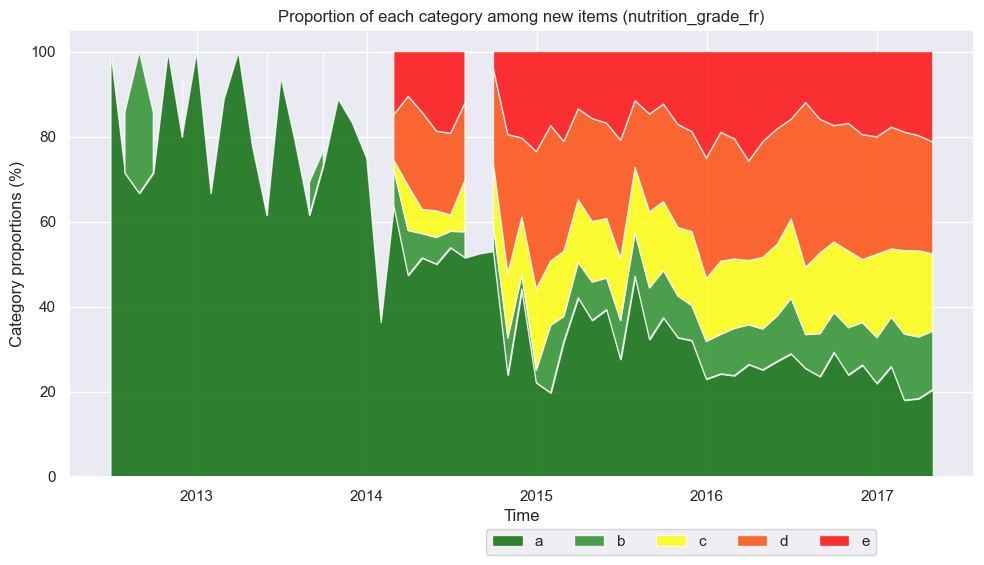

,a,b,c,d,e
coef,-0.04,-0.00,0.01,0.02,0.01
intercept,83.46,10.58,1.73,2.05,2.18
mean,47.98,9.29,11.41,18.56,12.76


In [177]:
# plotting graph, calculating regression and testing for stationarity

nutri_pal = ['darkgreen', 'forestgreen', 'yellow', 'orangered', 'red']

nutrig_n_item_prop = plot_cat_prop_thr_time(df,'nutrition_grade_fr', palette=nutri_pal,
                                            ncol=5)
# nutrig_n_item_prop = nutrig_n_item_prop.fillna(0).round(2)
# print ("*****************      nutrig_n_item_prop                     : ")
# print(nutrig_n_item_prop)
# reg_nutrig_prop = mult_reg_thr_time(nutrig_n_item_prop)
# reg_nutrig_prop = reg_nutrig_prop.fillna(0).round(2)
# print("**************         reg_nutrig_prop                     : ")
# print(reg_nutrig_prop)
# reg_nutrig_prop = reg_nutrig_prop.fillna(0).round(2)
# reg_nutrig_prop = mult_test(data_df=nutrig_n_item_prop, res_df=reg_nutrig_prop,
#                             test_func='stat', print_opt=False)
print(" apres mult_test,       ************         reg_nutrig_prop                     : ")
print(reg_nutrig_prop)
plt.show()
reg_nutrig_prop




**Nutriscore**

In [499]:
unique_quantities = data['quantity'].unique()
print(unique_quantities)

[1000.0 nan 0.0 75.0 19.0 330.0 900.0 792.0 500.0 100.0 200.0 130.0 180.0
 90.0 80.0 65.0 400.0 350.0 250.0 320.0 950.0 254.0 148.0 60.0 175.0 56.0
 230.0 473.0 300.0 244.0 115.0 125.0 150.0 275.0 240.0 496.0 750.0 530.0
 560.0 165.0 475.0 120.0 600.0 700.0 365.0 22.0 439.0 50.0 220.0 245.0
 37.0 355.0 454.0 141.0 42.0 680.0 170.0 1130.0 425.0 380.0 227.0 111.0
 198.0 521.0 360.0 10.0 113.0 397.0 340.0 226.0 408.0 265.0 255.0 135.0
 270.0 908.0 260.0 282.0 1750.0 450.0 850.0 213.0 276.0 189.0 38.0 796.0
 375.0 26.0 640.0 52.0 206.0 890.0 2000.0 283.0 316.0 40.0 30.0 36.0 160.0
 368.0 45.0 35.0 54.0 480.0 114.0 370.0 15.0 32.0 592.0 800.0 438.0 510.0
 207.0 47.0 585.0 650.0 280.0 565.0 187.0 540.0 225.0 453.0 7.0 410.0 72.0
 303.0 765.0 1360.0 354.0 110.0 140.0 169.0 290.0 522.0 192.0 642.0 289.0
 308.0 613.0 167.0 118.0 1.0 358.0 766.0 620.0 718.0 580.0 830.0 876.0
 875.0 584.0 514.0 763.0 819.0 132.0 136.0 126.0 298.0 335.0 305.0 94.0
 96.0 246.0 271.0 816.0 190.0 202.0 970.0 646.0 66

In [500]:
#counts = data['nutrition_grade_fr'].value_counts()
counts = data['nutrition_grade_fr'].value_counts(dropna=False)

print(counts)


NaN    35957
d      11248
a      9791 
e      7935 
c      7538 
b      5220 
Name: nutrition_grade_fr, dtype: int64


In [501]:
# Regrouper les données par nutriscore et calculer la somme et le pourcentage
nutriscore_sum = data.groupby('nutrition_grade_fr').sum()
nutriscore_percent = (nutriscore_sum / nutriscore_sum.sum()) * 100

# Afficher les résultats
print("Somme de chaque nutriscore:")
print(nutriscore_sum)
print("Pourcentage de chaque nutriscore:")
print(nutriscore_percent)


Somme de chaque nutriscore:
                    additives_n  ingredients_from_palm_oil_n  \
nutrition_grade_fr                                             
a                   5830.0       35.0                          
b                   3662.0       17.0                          
c                   6988.0       113.0                         
d                   12667.0      328.0                         
e                   9422.0       622.0                         

                    ingredients_that_may_be_from_palm_oil_n  energy_100g  \
nutrition_grade_fr                                                         
a                   459.0                                    7052098.5     
b                   161.0                                    2629362.0     
c                   424.0                                    6001731.5     
d                   1050.0                                   15029698.0    
e                   690.0                                    138550

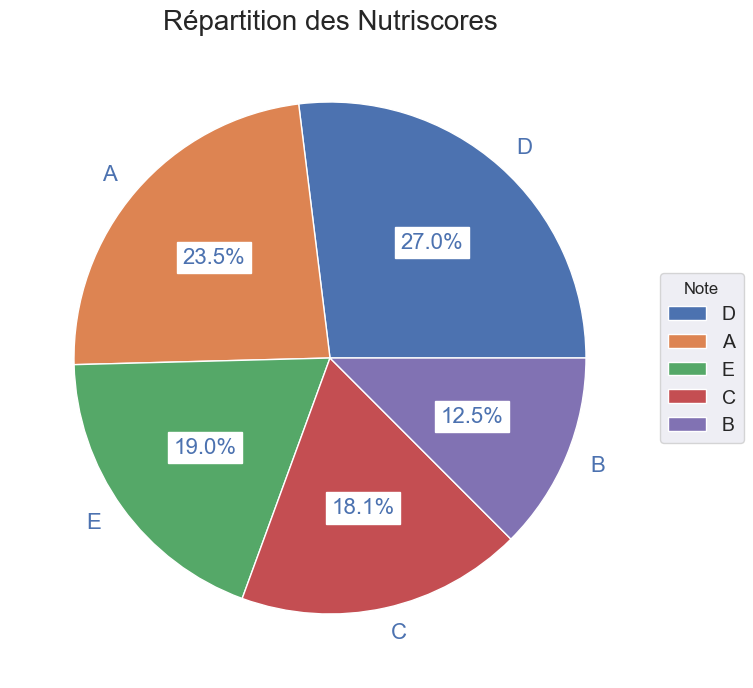

In [165]:
# Création d'une figure avec une taille de 8x8 pouces
plt.figure(figsize=(8,8))

chaine = 'Répartition des Nutriscores'
# Ajout d'un titre à la figure
plt.title(chaine, size=20)

# Création d'un graphique en camembert en utilisant les valeurs de la colonne "nutrition_grade_fr"
# Les étiquettes de chaque part sont en majuscules
# Le pourcentage de chaque part est affiché avec une décimale
# Les propriétés du texte sont définies pour une taille de police de 16, une couleur de police bleue et un fond blanc
wedges, texts, autotexts = plt.pie(data.nutrition_grade_fr.value_counts().values, 
        labels = data.nutrition_grade_fr.value_counts().index.str.upper(),
       autopct='%1.1f%%', textprops={'fontsize': 16, 
                                     'color' : 'b', 
                                     'backgroundcolor' : 'w',}
       )

# Récupération des axes de la figure
ax = plt.gca()

# Ajout d'une légende aux graphiques en camembert
# Les étiquettes des parts sont en majuscules et ont un titre "Note"
# La légende est centrée à gauche
# La taille de police est définie à 14
# La boîte qui entoure la légende est ajustée pour ne pas chevaucher les graphiques en camembert
ax.legend(wedges, data.nutrition_grade_fr.value_counts().index.str.upper(),
          title="Note",
          loc="center left",
          fontsize=14,
          bbox_to_anchor=(1, 0, 0.5, 1))
save_figure_opt(chaine,"Repartition_Distribution_par_variable", library='matplotlib')

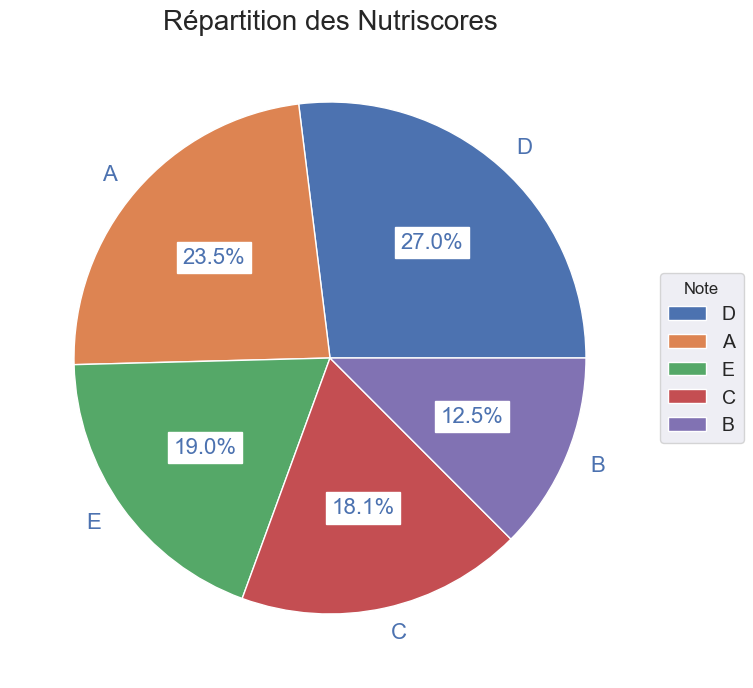

In [503]:
# Création d'une figure avec une taille de 8x8 pouces
plt.figure(figsize=(8,8))

chaine = 'Répartition des Nutriscores'
# Ajout d'un titre à la figure
plt.title(chaine, size=20)

# Création d'un graphique en camembert en utilisant les valeurs de la colonne "nutrition_grade_fr"
# Les étiquettes de chaque part sont en majuscules
# Le pourcentage de chaque part est affiché avec une décimale
# Les propriétés du texte sont définies pour une taille de police de 16, une couleur de police bleue et un fond blanc
wedges, texts, autotexts = plt.pie(data.nutrition_grade_fr.value_counts().values, 
        labels = data.nutrition_grade_fr.value_counts().index.str.upper(),
       autopct='%1.1f%%', textprops={'fontsize': 16, 
                                     'color' : 'b', 
                                     'backgroundcolor' : 'w',}
       )

# Récupération des axes de la figure
ax = plt.gca()

# Ajout d'une légende aux graphiques en camembert
# Les étiquettes des parts sont en majuscules et ont un titre "Note"
# La légende est centrée à gauche
# La taille de police est définie à 14
# La boîte qui entoure la légende est ajustée pour ne pas chevaucher les graphiques en camembert
ax.legend(wedges, data.nutrition_grade_fr.value_counts().index.str.upper(),
          title="Note",
          loc="center left",
          fontsize=14,
          bbox_to_anchor=(1, 0, 0.5, 1))

# Appel de la fonction save_figure_opt pour sauvegarder la figure
save_figure_opt(chaine,chaine)


In [504]:
#provenance des url

In [505]:
# Récupération de l'ensemble des noms de domaine à partir de l'url de chaque entrée
data.url.dropna().apply(lambda x: str(x).split('/')[2]).unique()

array(['world-fr.openfoodfacts.org'], dtype=object)

Ce code permet de récupérer les noms de domaine uniques à partir de la colonne "url" du dataframe "data".

- data.url : sélectionne la colonne "url" du dataframe "data".
- .dropna() : supprime les valeurs manquantes de la colonne "url".
- .apply(lambda x: str(x).split('/')[2]) : applique une fonction lambda à chaque élément de la colonne "url", qui extrait le nom de domaine en séparant la chaîne de caractères selon le caractère "/". Le 3ème élément correspond au nom de domaine.
- .unique() : renvoie un tableau numpy des noms de domaine uniques.

In [506]:
# Extraction de noms de domaines uniques à partir d'une colonne 'image_url' non vide
# en appliquant la fonction split pour obtenir la troisième partie de chaque URL qui est le nom de domaine.
# Ensuite, on applique la méthode unique pour obtenir la liste des noms de domaines uniques.

data.image_url.dropna().apply(lambda x: str(x).split('/')[2]).unique()


array(['fr.openfoodfacts.org'], dtype=object)

Ce code permet de récupérer les noms de domaine uniques à partir de la colonne "image_url" du dataframe "data".

- data.image_url : Sélectionne la colonne "image_url" du dataframe "data".

- .dropna() : Exclut toutes les valeurs manquantes (NaN) dans la colonne "image_url".

- .apply(lambda x: str(x).split('/')[2]) : Applique une fonction lambda à chaque valeur de la colonne "image_url" pour extraire le nom de domaine. La fonction lambda divise chaque URL par les "/", puis sélectionne le troisième élément (qui est le nom de domaine) et renvoie une chaîne de caractères.

- .unique() : Retourne une liste de tous les noms de domaine uniques extraits des URLs des images, sans doublons.

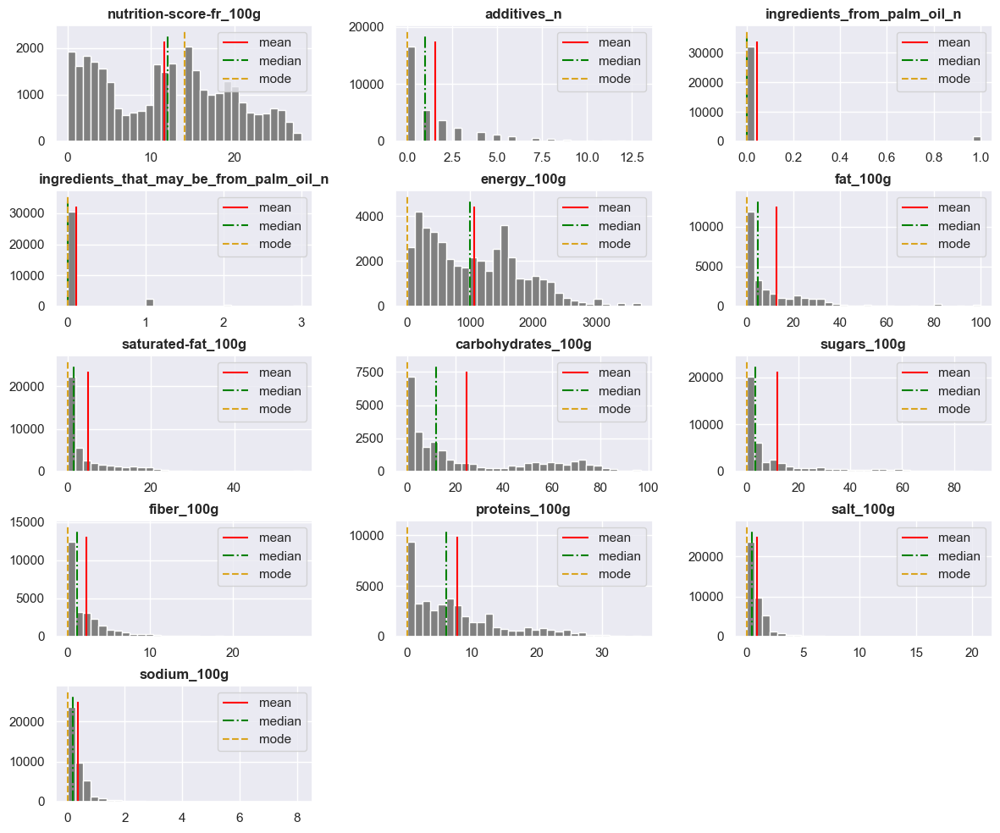

In [507]:
# Plotting histograms of the main quantitative continuous columns

# -- reordering columns
quant_cols = ['nutrition-score-fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g']

fig = plt.figure(figsize=(12,10))

# for i, ax, c in enumerate(zip(fig.ravel(), sorted(quant_cols))):
for i, c in enumerate(quant_cols,1):
    ax = fig.add_subplot(5,3,i)
    ax.hist(df[c],  bins=30, color='grey')
    ax.set_title(c)
    ax.vlines(df[c].mean(), *ax.get_ylim(),  color='red', ls='-', lw=1.5)
    ax.vlines(df[c].median(), *ax.get_ylim(), color='green', ls='-.', lw=1.5)
    ax.vlines(df[c].mode()[0], *ax.get_ylim(), color='goldenrod', ls='--', lw=1.5)
    ax.legend(['mean', 'median', 'mode'])
    ax.title.set_fontweight('bold')
    
# plt.tight_layout(w_pad=4.5, h_pad=-1)
plt.tight_layout(w_pad=2, h_pad=0.65)
# plt.gcf().set_size_inches(16,7)

plt.show()

## 2.3 Évolution des caractéristiques quantitatives 
Voyons maintenant si nous pouvons mettre en évidence des changements dans certaines des principales caractéristiques quantitatives. Nous tracerons une moyenne mobile des caractéristiques dans le temps.

In [508]:
df

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,2016-09-17 09:18:13,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,2015-06-17 10:11:54,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,2016-03-17 18:17:18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,2016-09-10 20:08:02,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,2015-09-18 10:05:52,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations nutritionnelles à compléter,Ingrédients complétés,Date limite à compléter,Caractéristiques complétées,Catégories complétées,Marques complétée

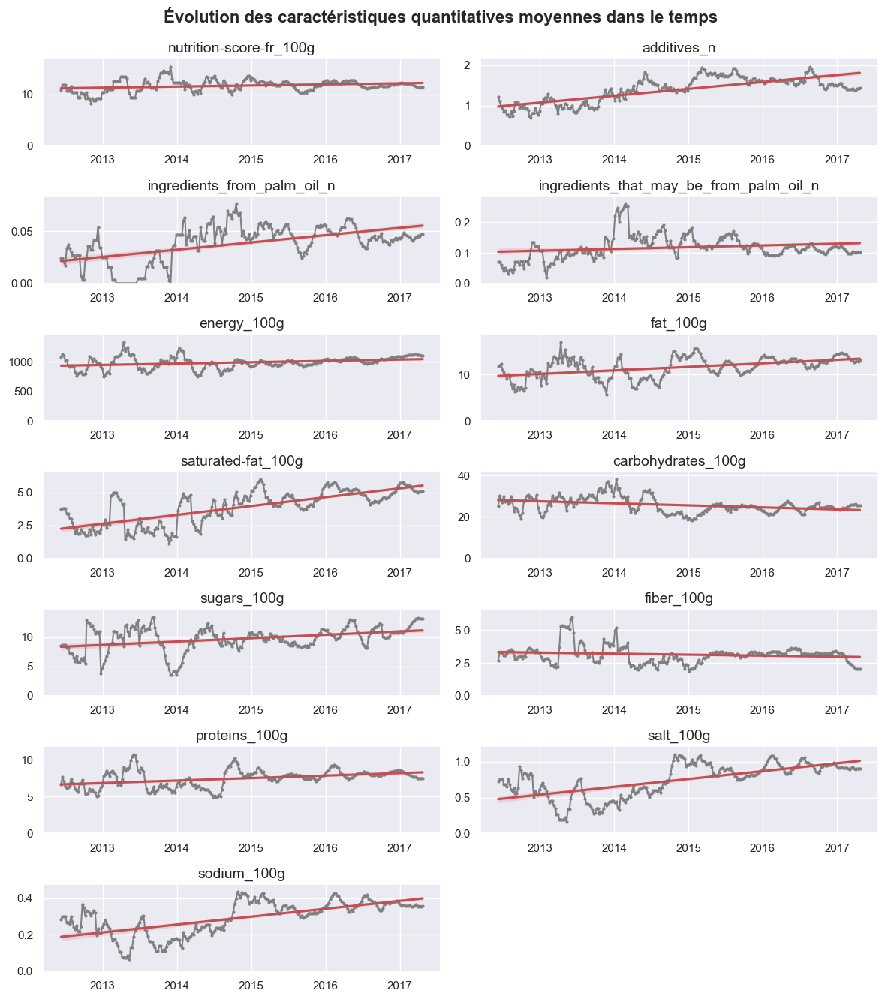

In [164]:
# Plotting evolution of the mean of main quantitative features
# in newly entered items through time (aggregated on weeks )
import matplotlib.dates as mdates
col_100g =  ['nutrition-score-fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
             'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
             'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
             'proteins_100g', 'salt_100g', 'sodium_100g']

df_100g_thr_time = df.set_index('last_modified_t').sort_index()[col_100g]
df_100g_thr_time.index = pd.to_datetime(df_100g_thr_time.index, unit='s')
df_100g_thr_time = df_100g_thr_time.resample('W').mean()
dates = mdates.date2num(df_100g_thr_time.index)

fig = plt.figure(figsize=(12,14))

for i, c in enumerate(col_100g,1):
    ax = fig.add_subplot(7,2,i)
    y_roll = df_100g_thr_time[c].fillna(df_100g_thr_time[c].median()).rolling(10).mean().values
    plt.plot_date(dates, y_roll, ls='-', markersize=2, lw=1.5, color='grey')
    sns.regplot(dates, y_roll, marker='None', color='r', ax= ax)
    ax.set(ylim=(0,np.nanmax(y_roll)*1.1))
    ax.set_title(c, fontsize=14)
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
fig.suptitle("Évolution des caractéristiques quantitatives moyennes dans le temps",
             fontweight='bold', fontsize=16)
plt.show()



A partir de ces graphiques, nous pouvons émettre l'hypothèse que le nombre moyen d'additifs et d'ingrédients issus de l'huile de palme est en baisse, surtout depuis 2017.

Testons ces hypothèses.

In [205]:
# Regression coefficients and result of stationary tests on values per 100g
df_100g_thr_time = df.set_index('last_modified_t').sort_index()[col_100g]
df_100g_thr_time.index = pd.to_datetime(df_100g_thr_time.index, unit='s')
df_100g_thr_time = df_100g_thr_time.resample('W').mean()
df_100g_thr_time = df_100g_thr_time.fillna(0).round(2)
dates = mdates.date2num(df_100g_thr_time.index)
print (df_100g_thr_time)
df_100g_thr_time = df_100g_thr_time.fillna(0).round(2)
reg_df_100g_thr_time = mult_reg_thr_time(df_100g_thr_time)
reg_df_100g_thr_time = reg_df_100g_thr_time.fillna(0).round(2)
reg_df_100g_thr_time = mult_test(data_df=df_100g_thr_time, res_df=reg_df_100g_thr_time,
                                 test_func='stat', print_opt=False)
display(reg_df_100g_thr_time)
# display(reg_df_100g_thr_time[['energy_kj_100g','ing_from_palm_oil_n', 'additives_n', 'quantity_num']])

                 nutrition-score-fr_100g  additives_n  \
last_modified_t                                         
2012-04-08       2.00                     1.00          
2012-04-15       0.00                     0.00          
2012-04-22       0.00                     0.00          
2012-04-29       0.00                     0.00          
2012-05-06       0.00                     1.00          
2012-05-13       0.00                     0.00          
2012-05-20       0.00                     0.00          
2012-05-27       0.00                     0.00          
2012-06-03       0.00                     0.00          
2012-06-10       0.00                     0.00          
2012-06-17       0.00                     0.00          
2012-06-24       0.00                     0.00          
2012-07-01       0.00                     1.14          
2012-07-08       1.00                     0.50          
2012-07-15       0.00                     0.00          
2012-07-22       0.00          

ValueError: Proportion too big.

In [184]:
df_100g_thr_time = df_100g_thr_time.fillna(0).round(2)
reg_df_100g_thr_time = reg_df_100g_thr_time.fillna(0).round(2)

mult_test(data_df=df_100g_thr_time, res_df=reg_df_100g_thr_time,
                                 test_func='stat', print_opt=True)

           nutrition-score-fr_100g  additives_n  ingredients_from_palm_oil_n  \
coef       0.01                     0.00         0.00                          
intercept  2.59                     0.78         0.02                          
mean       8.87                     1.33         0.04                          

           ingredients_that_may_be_from_palm_oil_n  energy_100g  fat_100g  \
coef       0.00                                     0.20         0.00       
intercept  0.09                                     757.96       7.68       
mean       0.11                                     939.36       10.99      

           saturated-fat_100g  carbohydrates_100g  sugars_100g  fiber_100g  \
coef       0.00                0.00                0.00         0.00         
intercept  0.95                22.96               5.00         2.24         
mean       3.50                24.28               8.84         2.79         

           proteins_100g  salt_100g  sodium_100g  
coef  

ValueError: Proportion too big.

En effet, selon les tests 'Kwiatkowski' et 'Augmented Dickey-Fuller' indiquent que les ingrédients de l'huile de palme et le nombre d'additifs ne sont pas stationnaires. La diminution que nous observons est en effet statistiquement significative.

Les graisses, le sel et les protéines semblent augmenter lentement dans les nouveaux

In [105]:
df

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,2016-09-17 09:18:13,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,2015-06-17 10:11:54,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,2016-03-17 18:17:18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,2016-09-10 20:08:02,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,2015-09-18 10:05:52,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations nutritionnelles à compléter,Ingrédients complétés,Date limite à compléter,Caractéristiques complétées,Catégories complétées,Marques complétée

last_modified_t
2012-04-08    2.000000 
2012-04-15   NaN       
2012-04-22   NaN       
2012-04-29   NaN       
2012-05-06   NaN       
2012-05-13   NaN       
2012-05-20   NaN       
2012-05-27   NaN       
2012-06-03   NaN       
2012-06-10   NaN       
2012-06-17   NaN       
2012-06-24   NaN       
2012-07-01   NaN       
2012-07-08    1.000000 
2012-07-15   NaN       
2012-07-22   NaN       
2012-07-29    20.000000
2012-08-05    0.000000 
2012-08-12   NaN       
2012-08-19   NaN       
2012-08-26   NaN       
2012-09-02    2.000000 
2012-09-09   NaN       
2012-09-16   NaN       
2012-09-23    7.500000 
2012-09-30   NaN       
2012-10-07   NaN       
2012-10-14   NaN       
2012-10-21    0.000000 
2012-10-28   NaN       
2012-11-04    2.000000 
2012-11-11   NaN       
2012-11-18    7.500000 
2012-11-25   NaN       
2012-12-02   NaN       
2012-12-09   NaN       
2012-12-16   NaN       
2012-12-23   NaN       
2012-12-30   NaN       
2013-01-06   NaN       
2013-01-13   NaN       


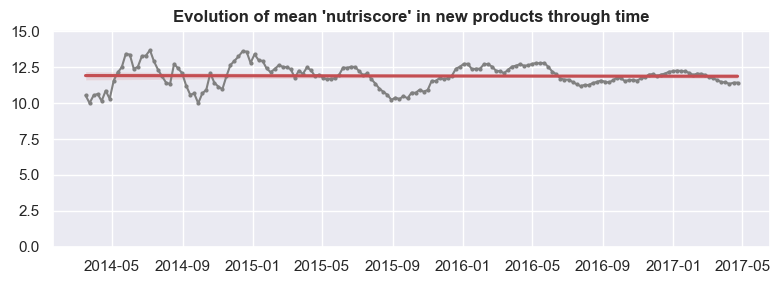

In [187]:
# Plotting evolution of main quantitative features through time

ser_nut = df.set_index('last_modified_t').sort_index()['nutrition-score-fr_100g']
ser_nut.index = pd.to_datetime(ser_nut.index)  # Conversion en DatetimeIndex
ser_nut = ser_nut.resample('W').mean()
print(ser_nut)
dates = mdates.date2num(df_100g_thr_time.index)
print(dates)

fig = plt.figure(figsize=(8,3))
y_roll = ser_nut.rolling(10).mean().values
print(y_roll.shape)
y_roll = np.squeeze(y_roll)
print(y_roll.shape)
plt.plot_date(dates, y_roll, ls='-', markersize=2, lw=1.5, color='grey')
ax = plt.gca()
sns.regplot(dates, y_roll, marker='None', color='r', ax= ax)
ax.set(ylim=(0,np.nanmax(y_roll)*1.1))
ax.set_title("Evolution of mean 'nutriscore' in new products through time",
             fontweight='bold')
fig.tight_layout()

plt.show()

# Regression coefficients and result of stationary tests on 'nutriscore'

# stationary_tests(y_roll, print_opt=True);

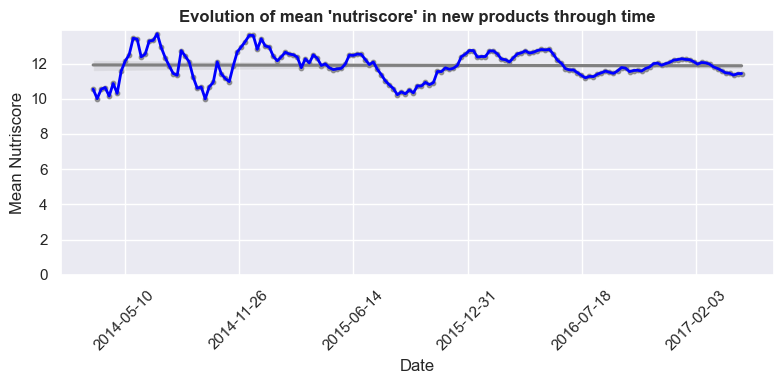

In [107]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.dates as mdates
from statsmodels.tsa.stattools import adfuller, kpss

# # créer un DataFrame fictif avec la variable 'nutrition-score-fr_100g' et 'last_modified_t'
# df = pd.DataFrame({'nutrition-score-fr_100g': np.random.randn(1000)*10 + 50,
#                    'last_modified_t': pd.date_range(start='2022-01-01', periods=1000)})

# regrouper les données par semaine et calculer la moyenne
df_weekly = df.set_index('last_modified_t').resample('W').mean()

# définir les dates en format numérique
dates = mdates.date2num(df_weekly.index)

# calculer la moyenne mobile sur une fenêtre de 10 semaines
y_roll = df_weekly['nutrition-score-fr_100g'].rolling(window=10).mean().values

# créer la figure et l'axe
fig, ax = plt.subplots(figsize=(8, 4))

# tracer la courbe et la droite de régression
sns.regplot(x=dates, y=y_roll, color='grey', ax=ax, scatter_kws={'s': 10})
sns.lineplot(x=dates, y=y_roll, color='blue', ax=ax, lw=2)

# définir les titres et les limites des axes
ax.set_title("Evolution of mean 'nutriscore' in new products through time", fontweight='bold')
ax.set_xlabel('Date')
ax.set_ylabel('Mean Nutriscore')
ax.set_ylim(bottom=0)

# formater les dates en axe des x
date_format = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_format)
plt.xticks(rotation=45)

# afficher la figure
plt.tight_layout()
plt.show()


La valeur moyenne du nutriscore a tendance à baisser (vers des aliments plus sains) avec le temps.

In [189]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Calculer la moyenne de nutrition_grade_fr par date (last_modified_t)
df_mean = df.groupby('last_modified_t')['nutrition_grade_fr'].mean()

# Tracer la courbe de l'évolution de la moyenne de nutrition_grade_fr dans le temps
plt.figure(figsize=(10, 6))
ax = sns.lineplot(x=df_mean.index, y=df_mean.values, color='grey')

# Ajouter une droite de régression linéaire
x = np.array([i.toordinal() for i in df_mean.index])
y = df_mean.values
reg = LinearRegression().fit(x.reshape(-1, 1), y)
ax.plot(df_mean.index, reg.predict(x.reshape(-1, 1)), color='red')

# Définir le titre du graphique
ax.set_title("Evolution de la moyenne du nutrition_grade_fr dans le temps", fontweight='bold')

# Définir les étiquettes des axes
ax.set_xlabel("last_modified_t")
ax.set_ylabel("Moyenne de nutrition_grade_fr")

# Afficher le graphique
plt.show()


TypeError: Could not convert b to numeric

In [109]:
data.head(1)

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


**Additifs**

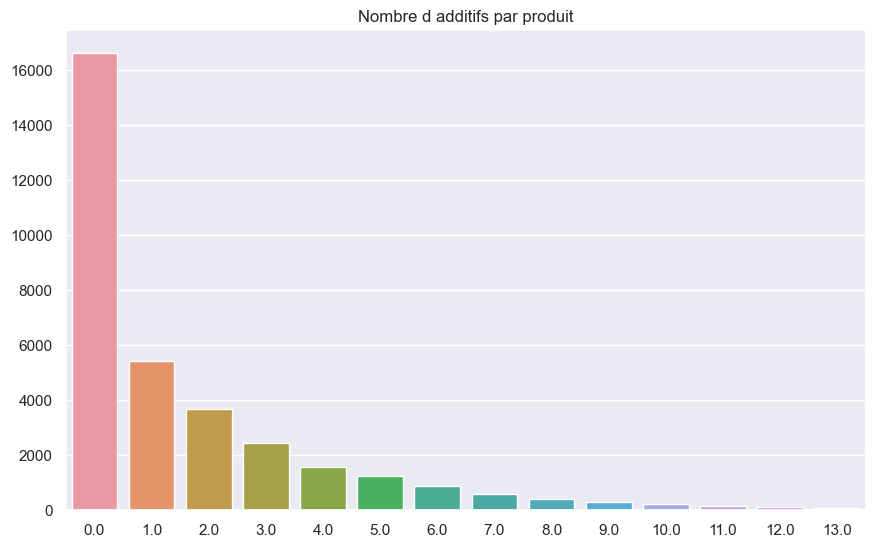

In [190]:
# Crée une figure de taille 10x6
plt.figure(figsize=(10,6))

# Donne un titre à la figure
chaine = 'Nombre d additifs par produit'
plt.title(chaine)
 
# Trace un diagramme en barres avec les nombres d'additifs sur l'axe x et leur fréquence sur l'axe y
sns.barplot(x = data.additives_n.value_counts().index,
           y = data.additives_n.value_counts().values )

# Affiche la figure
save_figure_opt(chaine,chaine, library='matplotlib')
#plt.show()


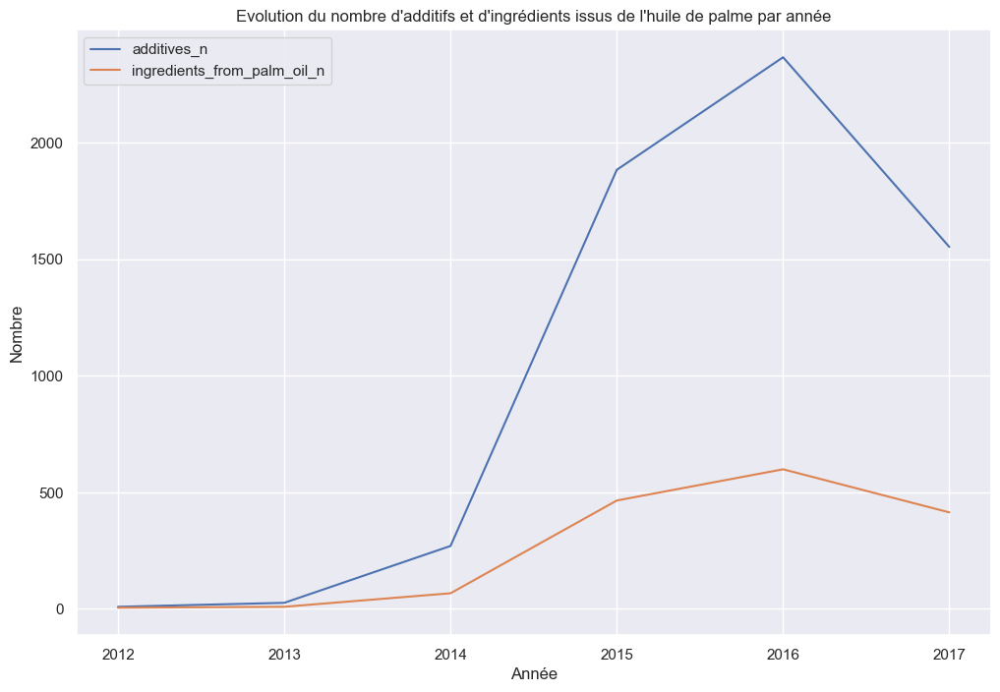

In [118]:
# Charger les données
df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned6.csv')

# Nettoyer la colonne 'product_name'
df_g['product_name'] = df_g['product_name'].astype(str).apply(lambda x: re.sub('[^A-Za-z0-9]+', '', x))

# Filtrer les lignes avec des valeurs non numériques dans la colonne 'last_modified_t'
df_g = df_g[pd.to_numeric(df_g['last_modified_t'], errors='coerce').notnull()]

# Convertir la colonne 'last_modified_t' en année
df_g['annee'] = pd.to_datetime(df_g['last_modified_t'], unit='s').dt.year

# Filtrer les produits avec des noms incohérents
df_g = df_g[df_g['product_name'].str.len() > 0]

# Sélectionner les colonnes d'intérêt
cols = ['product_name', 'additives_n', 'ingredients_from_palm_oil_n']

# Grouper les données par produit et par année, et compter le nombre d'additifs et d'ingrédients issus de l'huile de palme pour chaque groupe
additifs_palme_par_produit_par_annee = df_g.groupby(['product_name', 'annee'])[cols].sum()

# Sélectionner les données pour les produits contenant de l'huile de palme
additifs_palme_par_produit_par_annee = additifs_palme_par_produit_par_annee[additifs_palme_par_produit_par_annee['ingredients_from_palm_oil_n'] > 0]

# Afficher l'évolution du nombre d'additifs et d'ingrédients issus de l'huile de palme par année
additifs_palme_par_produit_par_annee.groupby('annee')[['additives_n', 'ingredients_from_palm_oil_n']].sum().plot(kind='line', figsize=(12, 8), title='Evolution du nombre d\'additifs et d\'ingrédients issus de l\'huile de palme par année')
plt.xlabel('Année')
plt.ylabel('Nombre')
plt.show()


product_name
nan                       43
Haricotsvertsextrafins    35
Huiledoliveviergeextra    34
Haricotsrouges            34
Framboises                31
Mayonnaise                30
Poischiches               29
Macdoinedelgumes          26
Eauminralenaturelle       25
Spaghetti                 25
Name: additives_n, dtype: int64


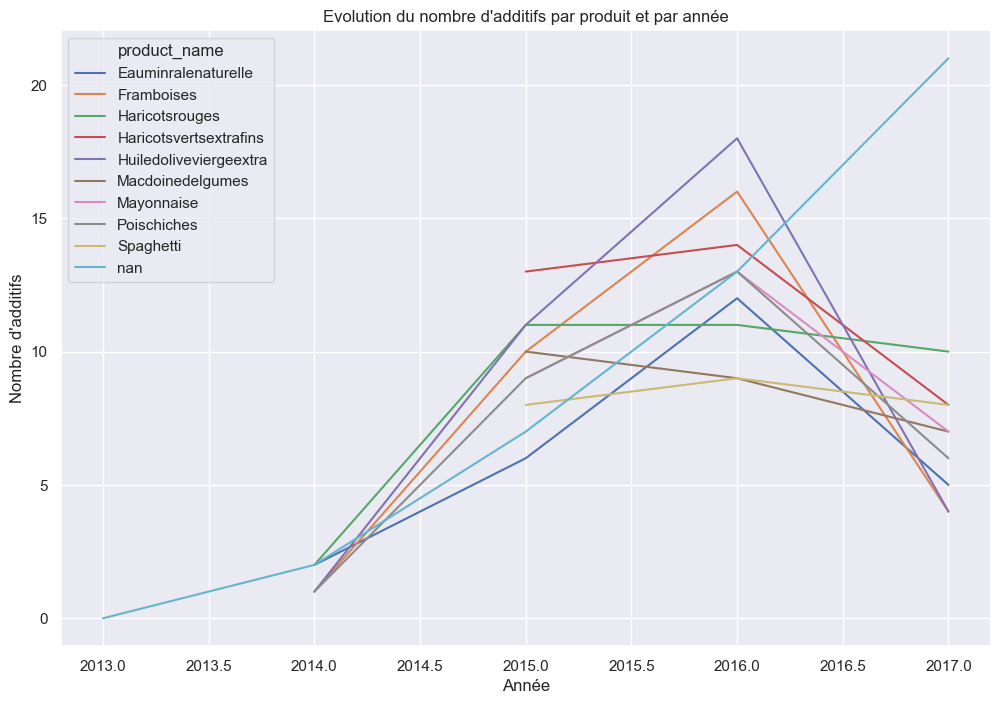

In [119]:
# Charger les données
df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned6.csv')

# df_g = pd.DataFrame(df_g).dropna()
# Convertir la colonne 'last_modified_t' en année
df_g['annee'] = pd.to_datetime(df_g['last_modified_t'], unit='s').dt.year
df_g['product_name'] = df_g['product_name'].astype(str).apply(lambda x: re.sub('[^A-Za-z0-9]+', '', x))

# Grouper les données par produit et compter le nombre d'additifs pour chaque groupe
additifs_par_produit = df_g.groupby(['product_name'])['additives_n'].count()

# Trier les produits par nombre d'additifs décroissant et afficher les 10 premiers
top_10_produits_additifs = additifs_par_produit.sort_values(ascending=False)[:10]
print(top_10_produits_additifs)

# Filtrer les données pour ne garder que les 10 produits avec le plus d'additifs
df_top_produits_additifs = df_g[df_g['product_name'].isin(top_10_produits_additifs.index)]

# Grouper les données par produit et par année, et compter le nombre d'additifs pour chaque groupe
additifs_par_produit_par_annee = df_top_produits_additifs.groupby(['product_name', 'annee'])['additives_n'].count()

# Afficher l'évolution du nombre d'additifs par produit et par année
additifs_par_produit_par_annee.unstack(level=0).plot(kind='line', figsize=(12, 8), title='Evolution du nombre d\'additifs par produit et par année')
plt.xlabel('Année')
plt.ylabel('Nombre d\'additifs')
plt.show()


In [176]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import re

# # Charger les données
# df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned6.csv')

# # Enlever les lignes avec des valeurs manquantes (NaN)
# df_g = df_g.dropna(subset=['product_name', 'additives_n'])

# # Convertir la colonne 'last_modified_t' en année
# df_g['annee'] = pd.to_datetime(df_g['last_modified_t'], unit='s').dt.year

# # Remplacer les valeurs vides ou incohérentes par NaN
# df_g['product_name'] = df_g['product_name'].replace('', np.nan)
# df_g['product_name'] = df_g['product_name'].replace('nan', np.nan)

# # Enlever les lignes avec des valeurs manquantes (NaN)
# df_g = df_g.dropna(subset=['product_name'])

# # Nettoyer les noms de produits
# df_g['product_name'] = df_g['product_name'].astype(str).apply(lambda x: re.sub('[^A-Za-z0-9]+', '', x))

# # Grouper les données par produit et par année, et compter le nombre d'additifs pour chaque groupe
# additifs_par_produit_par_annee = df_g.groupby(['product_name', 'annee'])['additives_n'].count()

# # Afficher les 10 produits avec le plus grand nombre d'additifs
# top_10_additifs_produits = additifs_par_produit_par_annee.groupby('product_name').sum().sort_values(ascending=False)[:10]
# print(top_10_additifs_produits)

# # Afficher l'évolution du nombre d'additifs par produit et par année
# additifs_par_produit_par_annee.unstack(level=0).plot(kind='line', figsize=(12, 8), title='Evolution du nombre d\'additifs par produit et par année')
# plt.xlabel('Année')
# plt.ylabel('Nombre d\'additifs')
# plt.show()


product_name
Haricotsvertsextrafins    35
Huiledoliveviergeextra    34
Haricotsrouges            34
Framboises                31
Mayonnaise                30
Poischiches               29
Macdoinedelgumes          26
Orange                    25
Spaghetti                 25
Eauminralenaturelle       25
Name: additives_n, dtype: int64


KeyboardInterrupt: 

In [533]:

# Lister les valeurs uniques de la colonne "additives"
additives_uniques = df['additives_n'].unique()

# Afficher les valeurs uniques de la colonne "additives"
print(additives_uniques)


[nan  0.  3.  4.  5.  6.  2.  1. 13.  8.  7. 10.  9. 12. 11.]


In [248]:
data.columns.tolist

<bound method IndexOpsMixin.tolist of Index(['code', 'url', 'creator', 'last_modified_t', 'product_name',
       'quantity_original', 'packaging', 'packaging_tags', 'brands',
       'categories_fr', 'labels_fr', 'countries_fr', 'ingredients_text',
       'allergens', 'additives_n', 'additives', 'additives_tags',
       'additives_fr', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')>

In [249]:
#description des grandeurs

In [250]:
data[['energy_100g',
      'fat_100g',
      'saturated-fat_100g',
      'carbohydrates_100g',
      'sugars_100g',
       'fiber_100g',
      'proteins_100g',
      'salt_100g',
      'sodium_100g',
      'nutrition-score-fr_100g']
    ].describe()
# data[['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']].describe().round(2)



,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
count,44419.000000,27828.000000,42346.000000,27194.000000,42420.000000,26651.000000,44133.000000,42480.000000,42477.000000,31705.000000
mean,1069.142334,12.769018,4.958138,24.691948,11.945448,2.324704,7.767637,0.904206,0.355997,11.641413
std,756.260132,17.742680,7.492442,26.742132,17.988079,3.440184,7.364684,1.508758,0.594019,7.785559
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,402.000000,1.000000,0.200000,3.000000,0.900000,0.000000,1.700000,0.050800,0.020000,4.000000
50%,1000.000000,5.000000,1.500000,12.000000,3.400000,1.200000,6.000000,0.500000,0.196850,12.000000
75%,1572.000000,20.000000,6.800000,49.000000,14.000000,3.200000,11.500000,1.200000,0.472441,18.000000
max,3700.000000,100.000000,56.000000,96.900002,90.099998,28.299999,36.000000,20.700001,8.149607,28.000000


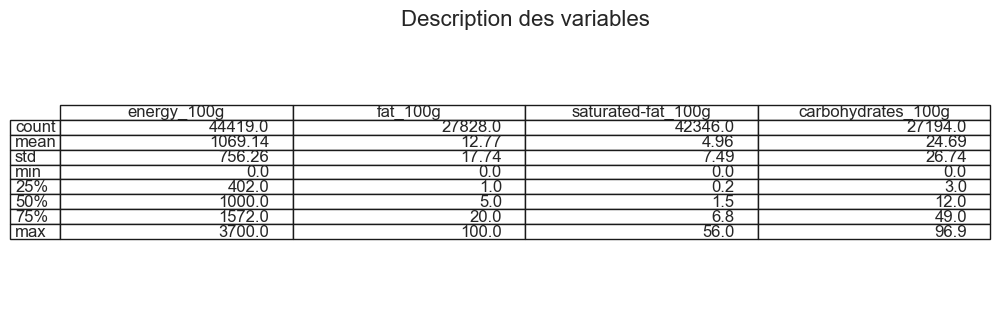

In [251]:
save_table_opt(data[['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g']].describe().round(2), "Description des variables", "description_variables.png")


# Question 3 

## Analyse Bivariée et multivarié

In [252]:
# Charger les données
# data = pd.read_csv('data/fr.openfoodfacts.org.products_cleaned5.csv')
df = df.fillna(0) # Remplacez les NaN par la valeur 0

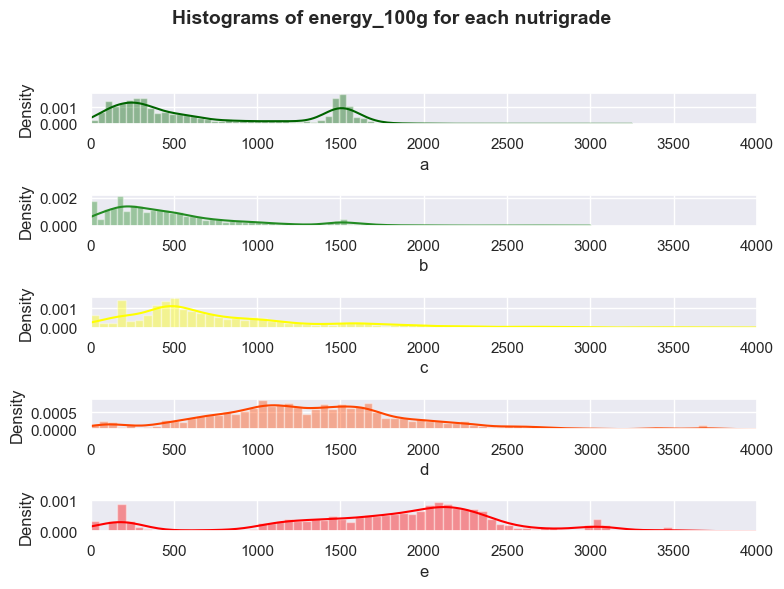

In [253]:
# Selecting the nutriscore series of pnns2 categories to compare
nutri_pal = ['darkgreen', 'forestgreen', 'yellow', 'orangered', 'red']
gb = df.groupby('nutrition_grade_fr')['energy_100g']
nutrigr_df = pd.DataFrame([gb.get_group(n).values for n in list('abcde')],
                            index = list('abcde')).T

# Plotting histogram for each category

fig = plt.figure(figsize=(8,6))

i=0
for n, c in zip(list('abcde'), nutri_pal):
    i+=1
    ax = fig.add_subplot(5,1,i)
    sns.distplot(nutrigr_df[n], color=c, bins=70)
    ax.set(xlim=(0,4000))
fig.suptitle('Histograms of energy_100g for each nutrigrade',
             fontweight='bold', fontsize=14)
plt.tight_layout(rect=[0,0.0,1,0.93])
plt.show()

### Matrice de corrélation

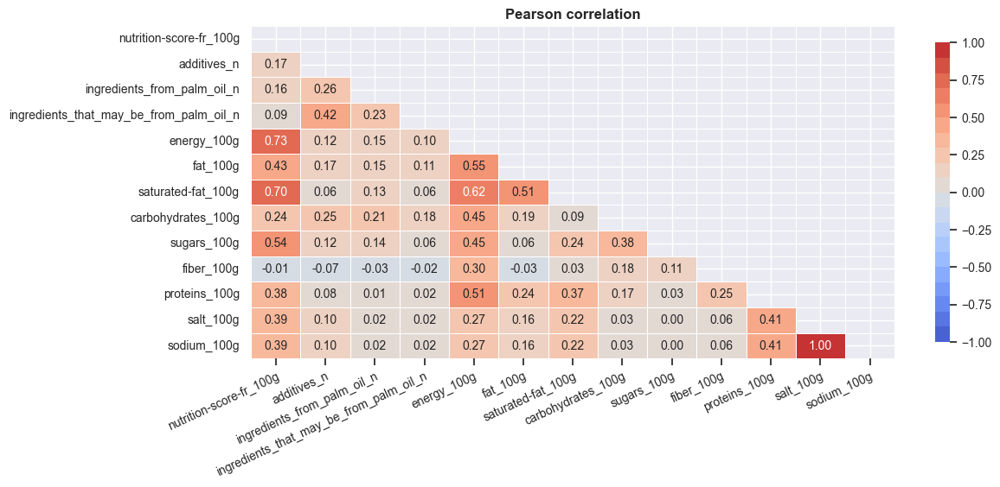

In [254]:
# Importer les bibliothèques nécessaires
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Sélectionner les colonnes quantitatives
cols = quant_cols

# Calculer la corrélation de Pearson entre les colonnes quantitatives
pears_corr = df[cols].corr()

# Créer un heatmap de la corrélation de Pearson en utilisant la fonction plot_heatmap de seaborn
# La forme de la matrice de corrélation sera triangulaire, 
# pour éviter la redondance puisque la matrice de corrélation est symétrique
# Le titre du graphique est "Pearson correlation"
# La taille de la figure est de 12 pouces de largeur et 5 pouces de hauteur
plot_heatmap(pears_corr, shape='tri',
             title="Pearson correlation", figsize=(12,5))

# Afficher le graphique
plt.show()


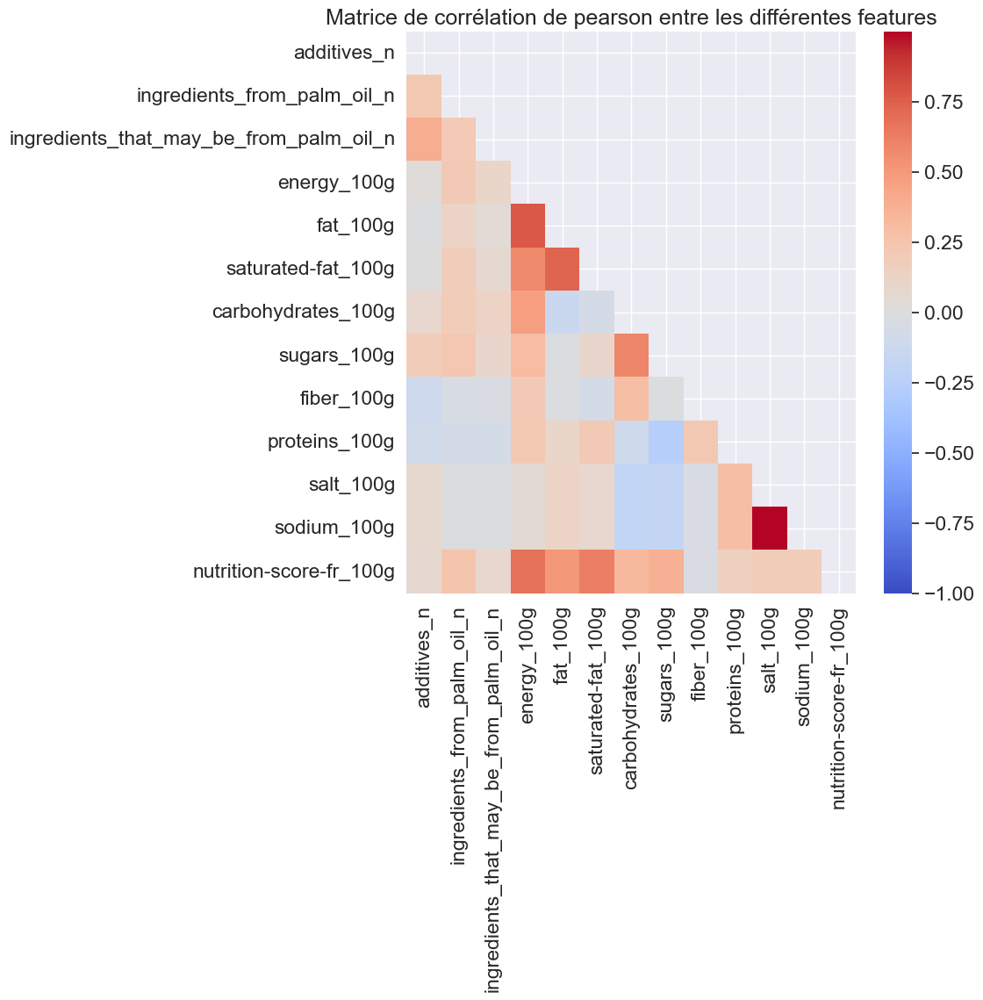

In [255]:
# Crée une nouvelle figure avec une taille de 8 pouces de large et 8 pouces de hauteur
plt.figure(figsize=(8,8))

# Définit la taille de police pour les titres et les labels des graphiques
sns.set(font_scale=1.5)
chaine = 'Matrice de corrélation de pearson entre les différentes features'
# Définit le titre du graphique
plt.title(chaine )

# Calcule la matrice de corrélation de Pearson entre les colonnes numériques du dataframe
corr = data[numeric_columns].corr()

# Crée un masque pour masquer la partie supérieure de la matrice de corrélation
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True 

# Trace le heatmap de la matrice de corrélation avec une couleur allant du bleu foncé (valeurs négatives) au rouge foncé (valeurs positives) et avec le masque défini précédemment
ax = sns.heatmap(corr, mask=mask, vmin=-1, cmap='coolwarm')

# Affiche le graphique
save_figure_opt(chaine, chaine, library='matplotlib')
# plt.show()

# Réinitialise la taille de police pour les titres et les labels des graphiques
sns.set(font_scale=1)


### Suppression 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n' du graphique

In [256]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_corr_heatmap(data):
    # Crée une nouvelle figure avec une taille de 8 pouces de large et 8 pouces de hauteur
    plt.figure(figsize=(8,8))

    # Définit la taille de police pour les titres et les labels des graphiques
    sns.set(font_scale=1.5)
    chaine = 'Matrice de corrélation de pearson entre les différentes features'
    # Définit le titre du graphique
    plt.title(chaine )

    # Calcule la matrice de corrélation de Pearson entre les colonnes numériques du dataframe
    numeric_columns = data.select_dtypes(include=np.number).columns.tolist()
    numeric_columns.remove('ingredients_from_palm_oil_n')
    numeric_columns.remove('ingredients_that_may_be_from_palm_oil_n')
    corr = data[numeric_columns].corr()

    # Crée un masque pour masquer la partie supérieure de la matrice de corrélation
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True 

    # Trace le heatmap de la matrice de corrélation avec une couleur allant du bleu foncé (valeurs négatives) au rouge foncé (valeurs positives) et avec le masque défini précédemment
    ax = sns.heatmap(corr, mask=mask, vmin=-1, cmap='coolwarm')

    # Affiche le graphique
    save_figure_opt(chaine, chaine, library='matplotlib')
    # plt.show()

    # Réinitialise la taille de police pour les titres et les labels des graphiques
    sns.set(font_scale=1)


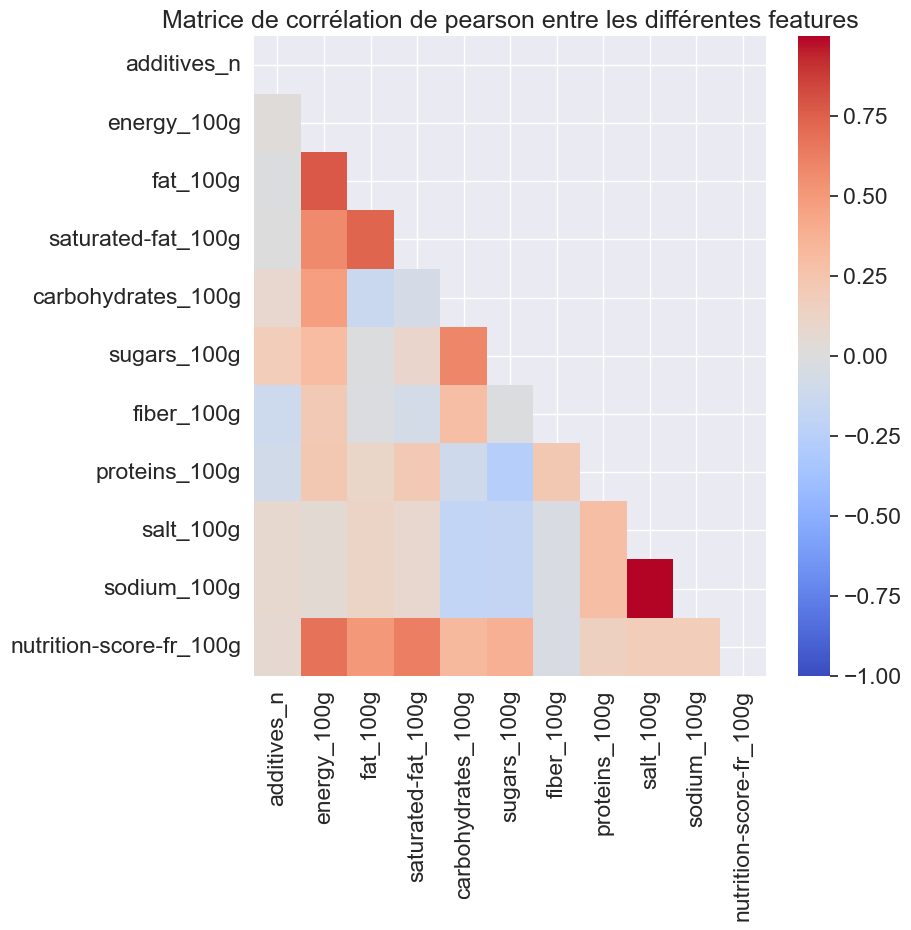

In [257]:
plot_corr_heatmap(data)

Analyse du tableau : 

* additives_n : pas de correlation remarquable
* energy_100g : forte corrélation avec:
    * fat_100g
    * saturated-fat_100g
    * carbohydrates_100g
    * nutrition-score-fr_100g
* fat_100g et saturated-fat_100g fortement corrélés
* nutrition-score-fr_100g : forte corrélation avec:
    * saturated_fat_100g
    * energy_100g
    * fat_100g

* sugars_100g : forte correlation avec carbohydrates_100g

* sodium_100g correlation très forte avec salt_100g 

In [258]:
object_columns = data.select_dtypes(include = ['object']).columns

In [259]:
object_columns

Index(['code', 'url', 'creator', 'last_modified_t', 'product_name',
       'packaging', 'packaging_tags', 'brands', 'ingredients_text',
       'allergens', 'additives', 'additives_tags', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'image_url', 'image_small_url',
       'quantity'],
      dtype='object')

### Test du Chi 2 - Indépendance des variables

In [90]:
# from scipy.stats import chi2_contingency
# from scipy.stats import chi2
# def test_chi2(serie1, serie2):
    
#     alpha = 0.03    
    
#     #H0 : les variables sont indépendantes
    
#     #print('tableau de contingence :\n', pd.crosstab(serie1.array, serie2.array))
#     tab_contingence = pd.crosstab(serie1.array, serie2.array)
#     stat_chi2, p, dof, expected_table = chi2_contingency(tab_contingence.values)
#     print('chi2 : {0:.5f},\np : {0:.5f},\ndof : {0:.5f}\n'.format(stat_chi2, p, dof))
#     #print('tableau de contingence : \n', tab_contingence)
    
#     critical = chi2.ppf(1-alpha, dof) #
#     #print('critital : ', critical)

#     if p <= alpha:
#         print('Variables non indépendantes (H0 rejetée) car p = {} <= alpha = {}'.format(p, alpha))
#         return False
    
#     else:
#         print('H0 non rejetée car p = {} >= alpha = {}'.format(p, alpha))
#         return True

In [192]:
# Importer les bibliothèques nécessaires pour réaliser un test de chi2
from scipy.stats import chi2_contingency
from scipy.stats import chi2

# Créer une fonction pour le test de chi2 entre deux séries
def test_chi2(serie1, serie2):
    
    # Définir le niveau de significativité
    alpha = 0.03    
    
    # Formuler l'hypothèse nulle : les variables sont indépendantes
    
    # Calculer le tableau de contingence à partir des deux séries
    tab_contingence = pd.crosstab(serie1.array, serie2.array)
    
    # Calculer les statistiques du test de chi2 à partir du tableau de contingence
    stat_chi2, p, dof, expected_table = chi2_contingency(tab_contingence.values)
    
    # Afficher les résultats du test
    print('chi2 : {0:.5f},\np : {0:.5f},\ndof : {0:.5f}\n'.format(stat_chi2, p, dof))
    
    # Calculer la valeur critique à partir du niveau de significativité et des degrés de liberté
    critical = chi2.ppf(1-alpha, dof)
    
    # Evaluer l'hypothèse nulle en comparant la valeur critique et la valeur p
    if p <= alpha:
        print('Variables non indépendantes (H0 rejetée) car p = {} <= alpha = {}'.format(p, alpha))
        return False
    
    else:
        print('H0 non rejetée car p = {} >= alpha = {}'.format(p, alpha))
        return True


In [92]:
data.head(1)

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [93]:
#data.nunique().sort_values()

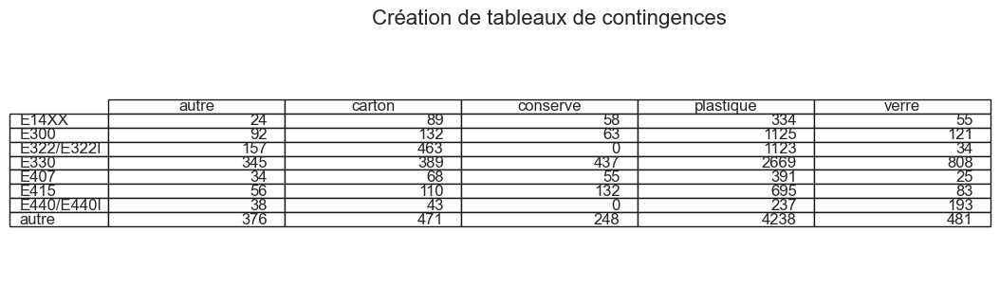

In [94]:
pd.crosstab(data['additives_tags'], data['packaging_tags'])
save_table_opt(pd.crosstab(data['additives_tags'], data['packaging_tags']), "Création de tableaux de contingences", "crosstab.png")


In [95]:
tags = data.columns[data.columns.str.contains('_tag')].tolist()

In [96]:
tags

['packaging_tags', 'additives_tags']

In [97]:
data[tags].sample(5)

,packaging_tags,additives_tags
46113,carton,NaN
3197,NaN,NaN
45783,NaN,NaN
66580,carton,autre
16023,plastique,NaN


In [98]:
data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns

Index(['additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g'],
      dtype='object')

In [193]:
import seaborn as sns
x = pd.cut(data['nutrition-score-fr_100g'], 20)
for column in data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns:
    print('test d\'indépendance {} / {}'.format('nutriscore',column))
    if data[column].nunique() > 20 :
        y = pd.cut(data[column], 20).astype('category')
    else:
        y = data[column].astype('category')
    test_chi2(x, y)
    
    #table = pd.DataFrame({'nutriscore' : x, column : y})
    #print(table.sample(10))
    print('________________________________________________________________________________________________\n')

test d'indépendance nutriscore / additives_n
chi2 : 1343.98983,
p : 1343.98983,
dof : 1343.98983

Variables non indépendantes (H0 rejetée) car p = 3.604347521611205e-150 <= alpha = 0.03
________________________________________________________________________________________________

test d'indépendance nutriscore / ingredients_from_palm_oil_n
chi2 : 1450.03577,
p : 1450.03577,
dof : 1450.03577

Variables non indépendantes (H0 rejetée) car p = 2.3453014766054527e-296 <= alpha = 0.03
________________________________________________________________________________________________

test d'indépendance nutriscore / ingredients_that_may_be_from_palm_oil_n
chi2 : 323.81074,
p : 323.81074,
dof : 323.81074

Variables non indépendantes (H0 rejetée) car p = 5.7762674228385307e-39 <= alpha = 0.03
________________________________________________________________________________________________

test d'indépendance nutriscore / energy_100g
chi2 : 31888.78205,
p : 31888.78205,
dof : 31888.78205

Varia

Le test du CHI2 conclut au rejet de l'hypothèse d'indépendance pour toutes nos variables: on peut donc conclure qu'il y a un lien entre la valeur du nutriscore et la valeur des variables

### Test ANOVA (Analyse de la variance) -  Indépendance des variables

**Test de Normalité**

Les variables quantitatives sont-elles de distribution normale?  (hypothèse à valider pour pouvoir appliquer le test d'indépendance par l'analyse de la variance ADOMA)

**A : test de normalité d'Agostino & Pearson**

In [100]:
?stats.normaltest

Object `stats.normaltest` not found.


In [101]:
data[numeric_columns].head()

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1000.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
4,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1000.0


In [102]:
# Importation du module stats depuis la librairie scipy
from scipy import stats

# Sélection des colonnes numériques
numeric_columns = data.select_dtypes(include=['int8', 'float32', 'int32', 'float64']).columns
# On exclut la première colonne qui n'est pas numérique
numeric_columns = numeric_columns[1:]

# Pour chaque colonne numérique
for column in numeric_columns:
    # Affichage du nom de la colonne
    print('________\n{}'.format(column))
    
    # Calcul du test normalité de la colonne
    k2, p = stats.normaltest(data[column], axis=0, nan_policy='omit')
    
    # Définition du niveau de significativité
    alpha = 5e-2
    
    # Affichage de la valeur de p
    print("p = {:g}".format(p))
    
    # Test d'hypothèse sur la normalité de la colonne
    if p < alpha: # hypothèse nulle : x a une distribution normale
        print("H0 est rejetée : {} n'est pas de distribution normale".format(column))
    else:
        print("H0 ne peut être rejetée : {}, on considère l'hypothèse de normalité".format(column))


________
ingredients_from_palm_oil_n
p = 0
H0 est rejetée : ingredients_from_palm_oil_n n'est pas de distribution normale
________
ingredients_that_may_be_from_palm_oil_n
p = 0
H0 est rejetée : ingredients_that_may_be_from_palm_oil_n n'est pas de distribution normale
________
energy_100g
p = 0
H0 est rejetée : energy_100g n'est pas de distribution normale
________
fat_100g
p = 0
H0 est rejetée : fat_100g n'est pas de distribution normale
________
saturated-fat_100g
p = 0
H0 est rejetée : saturated-fat_100g n'est pas de distribution normale
________
carbohydrates_100g
p = 0
H0 est rejetée : carbohydrates_100g n'est pas de distribution normale
________
sugars_100g
p = 0
H0 est rejetée : sugars_100g n'est pas de distribution normale
________
fiber_100g
p = 0
H0 est rejetée : fiber_100g n'est pas de distribution normale
________
proteins_100g
p = 0
H0 est rejetée : proteins_100g n'est pas de distribution normale
________
salt_100g
p = 0
H0 est rejetée : salt_100g n'est pas de distribution 

On ne peut pas appliquer le test Anova car les variables ne sont pas de distribution normale

**B. Test de normalité Kolmogorov Smirnov**

In [103]:
from scipy import stats
numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns
numeric_columns = numeric_columns[1:]

for column in numeric_columns:
    print('________\n{}'.format(column))
    D, p = stats.kstest(data[column].dropna(), 
                     'norm', 
                     args=(data[column].mean(), data[column].std()))
    alpha = 5e-2
    print("p = {}".format(p))
    if p < alpha:  # null hypothesis: x comes from a normal distribution
        print("The null hypothesis can be rejected : {} is not from a normal distribution".format(column))
    else:
        print("The null hypothesis cannot be rejected")

________
ingredients_from_palm_oil_n
p = 0.0
The null hypothesis can be rejected : ingredients_from_palm_oil_n is not from a normal distribution
________
ingredients_that_may_be_from_palm_oil_n
p = 0.0
The null hypothesis can be rejected : ingredients_that_may_be_from_palm_oil_n is not from a normal distribution
________
energy_100g
p = 0.0
The null hypothesis can be rejected : energy_100g is not from a normal distribution
________
fat_100g
p = 0.0
The null hypothesis can be rejected : fat_100g is not from a normal distribution
________
saturated-fat_100g
p = 0.0
The null hypothesis can be rejected : saturated-fat_100g is not from a normal distribution
________
carbohydrates_100g
p = 0.0
The null hypothesis can be rejected : carbohydrates_100g is not from a normal distribution
________
sugars_100g
p = 0.0
The null hypothesis can be rejected : sugars_100g is not from a normal distribution
________
fiber_100g
p = 0.0
The null hypothesis can be rejected : fiber_100g is not from a normal d

Le test de Kolmogorov Smirnov confirme la non normalité des distributions de données : on ne peut appliquer l'analyse de la variance

**C. ANOVA : analyse de la variance**

Même si les données ne suivent pas une distribution normale, préparons les opérations pour appliquer le test si c'était le cas, à but d'apprentissage

Il faut fournir en entrée au test les données pour chaque groupe, regardons un exemple d'application pour le nutrition grade et la feature salt_100g 

In [104]:
data['nutrition_grade_fr'].dropna().unique().tolist()

['d', 'e', 'c', 'b', 'a']

In [105]:
from scipy import stats

data_a = data[data['nutrition_grade_fr'] == 'a'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)
data_b = data[data['nutrition_grade_fr'] == 'b'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)
data_c = data[data['nutrition_grade_fr'] == 'c'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)
data_d = data[data['nutrition_grade_fr'] == 'd'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)
data_e = data[data['nutrition_grade_fr'] == 'e'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)

f_statistic, p = stats.f_oneway(
                                    data_b,
                                    data_c,
                                    data_d,
                                    data_e)

In [106]:
pd.DataFrame({'features': data_b.columns.tolist(),
              'p' : p,
              'bool_test' : p<alpha}) #si p<alpha : on rejette l'hypothèse d'indépendance H0 : les variables ne sont pas indépendantes

,features,p,bool_test
0,additives_n,2.607205e-01,False
1,ingredients_from_palm_oil_n,1.936955e-01,False
2,ingredients_that_may_be_from_palm_oil_n,6.011266e-01,False
3,energy_100g,6.694589e-12,True
4,fat_100g,4.161325e-04,True
5,saturated-fat_100g,9.511465e-11,True
6,carbohydrates_100g,1.168888e-03,True
7,sugars_100g,7.999463e-07,True
8,fiber_100g,8.894148e-03,True
9,proteins_100g,6.706698e-01,False


En l'absence de validation de l'hypothèse de normalité, ce test n'est pas applicable mais si c'était le cas, on pourrait interpréter les résultats comme suit : Les variables suivantes ont une distribution qui change en fonction des valeurs de nutrition_grade_fr (groupes de nutrition) :
* energy_100g
* saturated-fat_100g
* fiber_100g
* salt_100g
* sodium_100g
* nutrition-score-fr_100g (la valeur de la p-value est remarquable pour cette feature)

### Test de student d'indépendance

Hypothèses : 
* distributions normales => comme vu précédemment cette hypothèse n'est pas acceptable
* variance homogène => on va ramener la variance à 1 pour pouvoir appliquer le test de student

H0 : la moyenne de 2 échantillons de "salt_100g" est la même quel que soit le "nutrition grade" 


**de même que précédemment, le test n'est pas applicable faute d'hypothèse de normalité.**

In [107]:
from sklearn.preprocessing import StandardScaler

In [108]:
data['salt_100g'].dropna()

10       0.010 
11       0.003 
17       0.800 
18       0.100 
20       0.650 
         ...   
77655    1.000 
77673    0.290 
77674    10.000
77680    0.680 
77682    0.100 
Name: salt_100g, Length: 42480, dtype: float32

In [109]:
scaler = StandardScaler(copy=True, with_mean=False, with_std=True)
a = data[['nutrition-score-fr_100g','salt_100g']].copy().dropna()
b = scaler.fit_transform(a['salt_100g'].values.reshape(-1,1))
a = a['nutrition-score-fr_100g']
a = scaler.fit_transform(a.values.reshape(-1,1))
alpha = 0.05

In [110]:
t_stats, p = stats.ttest_ind(a, b)

In [111]:
p < alpha

array([ True])

In [274]:
data.columns
# for colonne in data.columns:
#     print('\n',colonne)
#     print('Qté Nan : ', round(data[colonne].isna().sum()/data[colonne].shape[0]*100), '%')
#     print('Uniques : ', data[colonne].nunique())

Index(['code', 'url', 'creator', 'last_modified_t', 'product_name',
       'quantity_original', 'packaging', 'packaging_tags', 'brands',
       'categories_fr', 'labels_fr', 'countries_fr', 'ingredients_text',
       'allergens', 'additives_n', 'additives', 'additives_tags',
       'additives_fr', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')

In [208]:
df.columns

Index(['code', 'url', 'creator', 'last_modified_t', 'product_name',
       'quantity_original', 'packaging', 'packaging_tags', 'brands',
       'categories_fr', 'labels_fr', 'countries_fr', 'ingredients_text',
       'allergens', 'additives_n', 'additives', 'additives_tags',
       'additives_fr', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')

In [248]:
# -- reordering columns
quant_cols =  ['nutrition-score-fr_100g','additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g']

In [249]:
import pandas as pd
import scipy.stats as stats
from sklearn.linear_model import LinearRegression

def compare_analyses(column, quant_cols, df):
    # Créer un DataFrame de résultats vide
    results = []
    
    # Parcourir chaque colonne quantitative et comparer avec la colonne de référence
    for col in quant_cols:
        # Calculer la p-value de l'ANOVA
        anova = stats.f_oneway(*[df[column][df[col].notnull()] for col in quant_cols])
        pval_anova = anova.pvalue
        
        # Calculer la corrélation entre la colonne de référence et la colonne quantitative
        corr = df[[column, col]].corr().iloc[0,1]
        
        # Calculer la p-value du t-test pour les moyennes égales
        ttest = stats.ttest_ind(df[column][df[col].notnull()], df[col][df[col].notnull()], equal_var=True)
        pval_ttest = ttest.pvalue
        
        # Calculer la p-value du test Kruskal-Wallis pour les médianes égales
        kruskal = stats.kruskal(*[df[column][df[col].notnull()] for col in quant_cols])
        pval_kruskal = kruskal.pvalue
        
        # Calculer la pente de la régression linéaire et l'ordonnée à l'origine
        lm = LinearRegression()
        lm.fit(df[[col]][df[col].notnull()], df[[column]][df[col].notnull()])
        slope = lm.coef_[0][0]
        intercept = lm.intercept_[0]
        
        # Ajouter les résultats de la comparaison à la liste de résultats
        results.append([col, pval_anova, corr, pval_ttest, pval_kruskal, slope, intercept])
    
    # Créer un DataFrame à partir de la liste de résultats
    columns = ['colonne de référence', 'p-value ANOVA', 'corr', 'p-value t-Test', 'p-value Kruskal-Wallis', 'pente de la régression', 'ordonnée à l\'origine']
    df_results = pd.DataFrame(results, columns=columns)
    
    # Retourner le DataFrame de résultats
    return df_results


In [250]:
compare_analyses('nutrition-score-fr_100g',quant_cols,df)

,colonne de référence,p-value ANOVA,corr,p-value t-Test,p-value Kruskal-Wallis,pente de la régression,ordonnée à l'origine
0,nutrition-score-fr_100g,NaN,1.000000,1.000000e+00,1.0,1.000000,-2.806644e-13
1,additives_n,NaN,0.166353,0.000000e+00,1.0,0.737665,4.252148e+00
2,ingredients_from_palm_oil_n,NaN,0.159333,0.000000e+00,1.0,8.613765,4.578024e+00
3,ingredients_that_may_be_from_palm_oil_n,NaN,0.090027,0.000000e+00,1.0,2.557482,4.622986e+00
4,energy_100g,NaN,0.727794,0.000000e+00,1.0,0.007082,4.214488e-01
5,fat_100g,NaN,0.431031,6.192779e-04,1.0,0.266588,3.531538e+00
6,saturated-fat_100g,NaN,0.702208,0.000000e+00,1.0,0.878815,2.375800e+00
7,carbohydrates_100g,NaN,0.236213,0.000000e+00,1.0,0.090791,3.966165e+00
8,sugars_100g,NaN,0.535510,3.405145e-198,1.0,0.278791,2.932452e+00
9,fiber_100g,NaN,-0.010869,0.000000e+00,1.0,-0.035868,4.779482e+00


 la variable "nutrition-score-fr_100g", qui correspond au score nutritionnel de chaque aliment. La p-value ANOVA est "NaN", ce qui signifie qu'il n'y a pas de différences significatives entre les différents groupes pour cette variable. La corrélation est élevée (1.0), ce qui montre que le score nutritionnel est fortement lié aux autres variables. Les p-values des tests t-Test et Kruskal-Wallis sont toutes deux de 1.0, ce qui signifie qu'il n'y a pas de différences significatives entre les groupes pour ces tests.

En résumé, cela indique que le score nutritionnel est très corrélé aux autres variables, mais il n'y a pas de différences significatives entre les groupes pour cette variable.






In [247]:
compare_analyses('energy_100g',quant_cols,df)

,colonne de référence,p-value ANOVA,corr,p-value t-Test,p-value Kruskal-Wallis,pente de la régression,ordonnée à l'origine
0,additives_n,1.0,0.119478,0.0,1.0,54.442502,5.744798e+02
1,ingredients_from_palm_oil_n,1.0,0.147549,0.0,1.0,819.680554,5.948393e+02
2,ingredients_that_may_be_from_palm_oil_n,1.0,0.103612,0.0,1.0,302.461814,5.961627e+02
3,energy_100g,1.0,1.000000,1.0,1.0,1.000000,-3.979039e-12
4,fat_100g,1.0,0.548434,0.0,1.0,34.856162,4.518601e+02
5,saturated-fat_100g,1.0,0.619652,0.0,1.0,79.689865,3.959188e+02
6,carbohydrates_100g,1.0,0.445417,0.0,1.0,17.592578,4.592342e+02
7,sugars_100g,1.0,0.452967,0.0,1.0,24.232659,4.532295e+02
8,fiber_100g,1.0,0.297736,0.0,1.0,100.963993,5.307712e+02
9,proteins_100g,1.0,0.512177,0.0,1.0,59.076250,3.506085e+02


In [241]:
id_distr_pnns1 = mult_test(df[quant_cols+['nutrition_grade_fr']], C_col='nutrition_grade_fr',
                           test_func='id_dist', print_opt=False)
id_distr_pnns1


# id_distr_pnns1 = mult_test(df[quant_cols+['pnns1']], C_col='pnns1',
#                            test_func='id_dist', print_opt=False)
# id_distr_pnns1

Empty DataFrame
Columns: []
Index: []


,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g
ANOVA,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"
Kruskal-Wallis,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"


L'ANOVA et le test de Kruskal-Wallis indiquent que les distributions de toutes les valeurs quantitatives sont différentes selon les catégories nutrition_grade_fr.

In [200]:
df.groupby(['pnns_groups_1'])['nutrition-score-fr_100g'].agg([np.median, np.mean, np.std]).T

pnns_groups_1,Beverages,Cereals and potatoes,Composite foods,Fat and sauces,Fish Meat Eggs,Fruits and vegetables,Milk and dairy products,Salty snacks,Sugary snacks,cereals-and-potatoes,fruits-and-vegetables,sugary-snacks,unknown
median,8.000000,5.000000,4.000000,14.000000,12.000000,3.000000,12.000000,15.000000,19.000000,NaN,2.000000,17.000000,13.000000
mean,8.857012,6.817204,6.552463,14.205683,11.548484,4.264085,10.100465,15.313522,18.549766,NaN,1.464286,16.678756,12.093185
std,6.194368,6.138263,5.680752,5.933735,7.734050,3.849278,6.176435,5.236213,6.796657,NaN,1.137969,3.837916,7.806255


Les moyennes, ainsi que les écarts-types semblent différents, mais vérifions si ces écarts dans les valeurs moyennes sont statistiquement significatifs.

Nous savons que les données ne sont pas normalement distribuées, nous ne devons donc pas utiliser l'ANOVA, car cela nécessite des données normalement distribuées. Nous utiliserons le test Kruskal-Wallis H (non paramétrique) qui ne nécessite que des données iid et imprimerons le résultat de l'ANOVA à titre informatif uniquement.

In [206]:
# Printing results of ANOVA and Kruskal-Wallis tests for 'nutriscore' vs. 'pnns1'

id_cat_distrib_tests(df[quant_cols+['pnns_groups_1']], C_col='pnns_groups_1',
                     Q_col='nutrition-score-fr_100g', print_opt=True)

oooooooo- nutrition-score-fr_100g vs. pnns_groups_1 -oooooooo
---ANOVA---
stat=nan, p=nan
Prob. different distr
---Kruskal-Wallis---
stat=nan, p=nan
Prob. different distr


{'ANOVA': (nan, 'False'), 'Kruskal-Wallis': (nan, 'False')}

In [207]:
# Results (p-value, same distr or not) of ANOVA and Kruskal-Wallis tests
# for 'nutriscore' vs. 'pnns1' categories
df[quant_cols+['pnns_groups_1']] = df[quant_cols+['pnns_groups_1']].fillna(0).round(2)
# pnns1_n_item_prop = pnns1_n_item_prop.drop('unknown', axis=1, inplace=True)


id_distr_pnns1 = mult_test(df[quant_cols+['pnns_groups_1']], C_col='pnns_groups_1',
                           test_func='id_dist', print_opt=False)
id_distr_pnns1

Empty DataFrame
Columns: []
Index: []


,nutrition-score-fr_100g,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g
ANOVA,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"
Kruskal-Wallis,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"


Au moins une des distributions catégorielles (groupes pnns_groups_1) du nutrition-score-fr_100g est significativement différente des autres.

Voyons maintenant s'il existe une ou plusieurs caractéristiques quantitatives qui ont les distributions sem pour toutes les catégories pnns1 :

## Marques et nutriscore 
Est-ce possible d'identifier des marques généralistes qui proposeraient toujours des produits au meilleur classement nutriscore pour toutes les catégories ?

Nous ferons une sélection de marques et de catégories pnns2 suffisamment représentées pour tenter de répondre à cette question (30 produits par catégorie et combinaison de marques).

In [349]:
# Charger les données
df = pd.read_csv('data/fr.openfoodfacts.org.products_cleaned6.csv')

In [292]:
# Pour la colonne 'pnns_groups_2'
print(data['pnns_groups_2'].unique())

# Pour la colonne 'brands'
print(data['brands'].unique())


[nan 'unknown' 'Legumes' 'Biscuits and cakes' 'Sweets'
 'Non-sugared beverages' 'Sweetened beverages' 'Meat'
 'Alcoholic beverages' 'Sandwich' 'Appetizers' 'Dressings and sauces'
 'Chocolate products' 'Dried fruits' 'Nuts' 'One-dish meals' 'Cheese'
 'Fruits' 'Fats' 'Vegetables' 'Breakfast cereals' 'Cereals' 'Fruit juices'
 'Milk and yogurt' 'Ice cream' 'Fish and seafood' 'Bread' 'Tripe dishes'
 'pastries' 'Processed meat' 'Pizza pies and quiche' 'Dairy desserts'
 'Artificially sweetened beverages' 'Eggs' 'Potatoes' 'vegetables' 'Soups'
 'Fruit nectars' 'fruits' 'legumes' 'cereals' 'Salty and fatty products']
["Ferme t'y R'nao" nan 'Bertrand Lejeune' ... 'L. Boulaire'
 'Roussette du Bugey' 'Sans marque,D.Lambert']


In [299]:
data['brands'].dropna().unique()


array(["Ferme t'y R'nao", 'Bertrand Lejeune', 'A&W', ..., 'L. Boulaire',
       'Roussette du Bugey', 'Sans marque,D.Lambert'], dtype=object)

In [364]:
df['pnns_groups_2'].value_counts()

unknown                             9692
One-dish meals                      3295
Cereals                             2475
Sweets                              2365
Cheese                              2353
Non-sugared beverages               2289
Processed meat                      2196
Alcoholic beverages                 1935
Biscuits and cakes                  1738
Dressings and sauces                1680
Vegetables                          1672
Fish and seafood                    1594
Fruits                              1398
Milk and yogurt                     1351
Meat                                1120
Chocolate products                  1100
Sweetened beverages                 949 
Fats                                932 
Fruit juices                        920 
Bread                               753 
Appetizers                          719 
Legumes                             487 
vegetables                          461 
Sandwich                            449 
Dairy desserts  

In [366]:
# -- Set of categories and brands to consider
set_cat = set(['Legumes', 'Biscuits and cakes', 'Sweets',
               'Non-sugared beverages' ,'Sweetened beverages', 'Meat',
               'Alcoholic beverages', 'Sandwich' ,'Appetizers', 'Dressings and sauces',
               'Chocolate products', 'Dried fruits', 'Nuts' ,'One-dish meals' ,'Cheese',
               'Fruits', 'Fats' ,'Vegetables', 'Breakfast cereals' ,'Cereals', 'Fruit juices',
               'Milk and yogurt', 'Ice cream' ,'Fish and seafood', 'Bread', 'Tripe dishes',
               'pastries', 'Processed meat' ,'Pizza pies and quiche' ,'Dairy desserts',
               'Artificially sweetened beverages' ,'Eggs', 'Potatoes' ,'vegetables', 'Soups',
               'Fruit nectars', 'fruits', 'legumes', 'cereals', 'Salty and fatty products'])

set_brands = set(['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 
                  'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora'])

# -- Filter and select relevant columns
df_ = df[['pnns_groups_2', 'brands']]
df_ = df_[df_['pnns_groups_2'].isin(set_cat)]
df_ = df_[df_['brands'].isin(set_brands)]

# -- Create a pivot table of counts
pivot = pd.pivot_table(df_, index='pnns_groups_2', columns='brands', aggfunc=len, fill_value=0)

# -- Get the top 10 brands for each category
top_brands = pd.DataFrame(columns=['Category', 'Brand', 'Count'])
for cat in pivot.index:
    top = pivot.loc[cat].sort_values(ascending=False)[:10]
    for i, count in top.items():
        top_brands = top_brands.append({'Category': cat, 'Brand': i, 'Count': count}, ignore_index=True)

# -- Display the results
for cat in set_cat:
    print('Category:', cat)
    display(top_brands[top_brands['Category'] == cat].sort_values(by='Count', ascending=False).head(100))
    print()


Category: Ice cream


,Category,Brand,Count
119,Ice cream,monoprix,1
120,Ice cream,auchan,0
121,Ice cream,belle france,0
122,Ice cream,carrefour,0
123,Ice cream,casino,0
124,Ice cream,cora,0
125,Ice cream,netto,0



Category: Fruits


,Category,Brand,Count
112,Fruits,auchan,2
113,Fruits,carrefour,2
114,Fruits,casino,1
115,Fruits,cora,1
116,Fruits,belle france,0
117,Fruits,monoprix,0
118,Fruits,netto,0



Category: Salty and fatty products


,Category,Brand,Count



Category: Cheese


,Category,Brand,Count
49,Cheese,auchan,4
50,Cheese,monoprix,3
51,Cheese,carrefour,2
52,Cheese,cora,2
53,Cheese,casino,1
54,Cheese,belle france,0
55,Cheese,netto,0



Category: Bread


,Category,Brand,Count
28,Bread,carrefour,3
29,Bread,casino,2
30,Bread,auchan,0
31,Bread,belle france,0
32,Bread,cora,0
33,Bread,monoprix,0
34,Bread,netto,0



Category: Dressings and sauces


,Category,Brand,Count
63,Dressings and sauces,auchan,2
64,Dressings and sauces,carrefour,2
65,Dressings and sauces,casino,2
66,Dressings and sauces,belle france,1
67,Dressings and sauces,cora,1
68,Dressings and sauces,monoprix,0
69,Dressings and sauces,netto,0



Category: Meat


,Category,Brand,Count
133,Meat,carrefour,3
134,Meat,auchan,0
135,Meat,belle france,0
136,Meat,casino,0
137,Meat,cora,0
138,Meat,monoprix,0
139,Meat,netto,0



Category: Sweets


,Category,Brand,Count
189,Sweets,carrefour,2
190,Sweets,auchan,1
191,Sweets,belle france,1
192,Sweets,casino,0
193,Sweets,cora,0
194,Sweets,monoprix,0
195,Sweets,netto,0



Category: Cereals


,Category,Brand,Count
42,Cereals,auchan,5
43,Cereals,casino,2
44,Cereals,carrefour,1
45,Cereals,monoprix,1
46,Cereals,belle france,0
47,Cereals,cora,0
48,Cereals,netto,0



Category: One-dish meals


,Category,Brand,Count
154,One-dish meals,auchan,3
155,One-dish meals,carrefour,1
156,One-dish meals,casino,1
157,One-dish meals,monoprix,1
158,One-dish meals,belle france,0
159,One-dish meals,cora,0
160,One-dish meals,netto,0



Category: Milk and yogurt


,Category,Brand,Count
140,Milk and yogurt,auchan,2
141,Milk and yogurt,casino,2
142,Milk and yogurt,monoprix,1
143,Milk and yogurt,netto,1
144,Milk and yogurt,belle france,0
145,Milk and yogurt,carrefour,0
146,Milk and yogurt,cora,0



Category: Vegetables


,Category,Brand,Count
196,Vegetables,casino,4
197,Vegetables,auchan,1
198,Vegetables,carrefour,1
199,Vegetables,cora,1
200,Vegetables,belle france,0
201,Vegetables,monoprix,0
202,Vegetables,netto,0



Category: cereals


,Category,Brand,Count



Category: Legumes


,Category,Brand,Count
126,Legumes,carrefour,1
127,Legumes,auchan,0
128,Legumes,belle france,0
129,Legumes,casino,0
130,Legumes,cora,0
131,Legumes,monoprix,0
132,Legumes,netto,0



Category: Fats


,Category,Brand,Count
84,Fats,casino,1
85,Fats,auchan,0
86,Fats,belle france,0
87,Fats,carrefour,0
88,Fats,cora,0
89,Fats,monoprix,0
90,Fats,netto,0



Category: Fish and seafood


,Category,Brand,Count
91,Fish and seafood,cora,2
92,Fish and seafood,netto,2
93,Fish and seafood,casino,1
94,Fish and seafood,auchan,0
95,Fish and seafood,belle france,0
96,Fish and seafood,carrefour,0
97,Fish and seafood,monoprix,0



Category: Alcoholic beverages


,Category,Brand,Count
0,Alcoholic beverages,casino,1
1,Alcoholic beverages,auchan,0
2,Alcoholic beverages,belle france,0
3,Alcoholic beverages,carrefour,0
4,Alcoholic beverages,cora,0
5,Alcoholic beverages,monoprix,0
6,Alcoholic beverages,netto,0



Category: Eggs


,Category,Brand,Count
77,Eggs,auchan,1
78,Eggs,casino,1
79,Eggs,monoprix,1
80,Eggs,belle france,0
81,Eggs,carrefour,0
82,Eggs,cora,0
83,Eggs,netto,0



Category: Pizza pies and quiche


,Category,Brand,Count
161,Pizza pies and quiche,casino,1
162,Pizza pies and quiche,auchan,0
163,Pizza pies and quiche,belle france,0
164,Pizza pies and quiche,carrefour,0
165,Pizza pies and quiche,cora,0
166,Pizza pies and quiche,monoprix,0
167,Pizza pies and quiche,netto,0



Category: Potatoes


,Category,Brand,Count



Category: Fruit nectars


,Category,Brand,Count
105,Fruit nectars,auchan,1
106,Fruit nectars,belle france,0
107,Fruit nectars,carrefour,0
108,Fruit nectars,casino,0
109,Fruit nectars,cora,0
110,Fruit nectars,monoprix,0
111,Fruit nectars,netto,0



Category: Appetizers


,Category,Brand,Count
7,Appetizers,belle france,2
8,Appetizers,casino,1
9,Appetizers,auchan,0
10,Appetizers,carrefour,0
11,Appetizers,cora,0
12,Appetizers,monoprix,0
13,Appetizers,netto,0



Category: Sandwich


,Category,Brand,Count



Category: Dairy desserts


,Category,Brand,Count
56,Dairy desserts,auchan,1
57,Dairy desserts,belle france,0
58,Dairy desserts,carrefour,0
59,Dairy desserts,casino,0
60,Dairy desserts,cora,0
61,Dairy desserts,monoprix,0
62,Dairy desserts,netto,0



Category: Biscuits and cakes


,Category,Brand,Count
21,Biscuits and cakes,cora,2
22,Biscuits and cakes,auchan,1
23,Biscuits and cakes,carrefour,1
24,Biscuits and cakes,monoprix,1
25,Biscuits and cakes,belle france,0
26,Biscuits and cakes,casino,0
27,Biscuits and cakes,netto,0



Category: Processed meat


,Category,Brand,Count
168,Processed meat,auchan,1
169,Processed meat,casino,1
170,Processed meat,netto,1
171,Processed meat,belle france,0
172,Processed meat,carrefour,0
173,Processed meat,cora,0
174,Processed meat,monoprix,0



Category: pastries


,Category,Brand,Count
210,pastries,auchan,2
211,pastries,carrefour,1
212,pastries,casino,1
213,pastries,belle france,0
214,pastries,cora,0
215,pastries,monoprix,0
216,pastries,netto,0



Category: Tripe dishes


,Category,Brand,Count



Category: vegetables


,Category,Brand,Count
217,vegetables,auchan,1
218,vegetables,belle france,0
219,vegetables,carrefour,0
220,vegetables,casino,0
221,vegetables,cora,0
222,vegetables,monoprix,0
223,vegetables,netto,0



Category: fruits


,Category,Brand,Count
203,fruits,carrefour,1
204,fruits,auchan,0
205,fruits,belle france,0
206,fruits,casino,0
207,fruits,cora,0
208,fruits,monoprix,0
209,fruits,netto,0



Category: Soups


,Category,Brand,Count
175,Soups,carrefour,1
176,Soups,auchan,0
177,Soups,belle france,0
178,Soups,casino,0
179,Soups,cora,0
180,Soups,monoprix,0
181,Soups,netto,0



Category: Chocolate products


,Category,Brand,Count



Category: legumes


,Category,Brand,Count



Category: Non-sugared beverages


,Category,Brand,Count
147,Non-sugared beverages,auchan,4
148,Non-sugared beverages,casino,3
149,Non-sugared beverages,carrefour,2
150,Non-sugared beverages,belle france,1
151,Non-sugared beverages,cora,1
152,Non-sugared beverages,monoprix,1
153,Non-sugared beverages,netto,0



Category: Nuts


,Category,Brand,Count



Category: Dried fruits


,Category,Brand,Count
70,Dried fruits,auchan,1
71,Dried fruits,belle france,0
72,Dried fruits,carrefour,0
73,Dried fruits,casino,0
74,Dried fruits,cora,0
75,Dried fruits,monoprix,0
76,Dried fruits,netto,0



Category: Breakfast cereals


,Category,Brand,Count
35,Breakfast cereals,carrefour,1
36,Breakfast cereals,cora,1
37,Breakfast cereals,auchan,0
38,Breakfast cereals,belle france,0
39,Breakfast cereals,casino,0
40,Breakfast cereals,monoprix,0
41,Breakfast cereals,netto,0



Category: Artificially sweetened beverages


,Category,Brand,Count
14,Artificially sweetened beverages,cora,1
15,Artificially sweetened beverages,auchan,0
16,Artificially sweetened beverages,belle france,0
17,Artificially sweetened beverages,carrefour,0
18,Artificially sweetened beverages,casino,0
19,Artificially sweetened beverages,monoprix,0
20,Artificially sweetened beverages,netto,0



Category: Fruit juices


,Category,Brand,Count
98,Fruit juices,carrefour,1
99,Fruit juices,auchan,0
100,Fruit juices,belle france,0
101,Fruit juices,casino,0
102,Fruit juices,cora,0
103,Fruit juices,monoprix,0
104,Fruit juices,netto,0



Category: Sweetened beverages


,Category,Brand,Count
182,Sweetened beverages,carrefour,1
183,Sweetened beverages,monoprix,1
184,Sweetened beverages,auchan,0
185,Sweetened beverages,belle france,0
186,Sweetened beverages,casino,0
187,Sweetened beverages,cora,0
188,Sweetened beverages,netto,0


In [313]:
def check_column_value(df, column_name, value_list):
    mask = df[column_name].isin(value_list)
    df_filtered = df[mask]
    if len(df_filtered) > 0:
        print(f"La valeur '{value_list}' existe dans la colonne '{column_name}'.")
    else:
        print(f"La valeur '{value_list}' n'existe pas dans la colonne '{column_name}'.")
    return df_filtered

brands_list = ['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora']
df_filtered = check_column_value(data, 'brands', brands_list)

# brands_list = ['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora']
# mask = df['brands'].isin(brands_list)
# df_filtered = df[mask]


La valeur '['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora']' existe dans la colonne 'brands'.


In [348]:
# Selecting the main pnns_groups_2 categories on which we want to compare brands
# -- reordering columns
quant_cols = ['nutrition-score-fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g']

set_cat = set(['Legumes', 'Biscuits and cakes', 'Sweets',
 'Non-sugared beverages' ,'Sweetened beverages', 'Meat',
 'Alcoholic beverages', 'Sandwich' ,'Appetizers', 'Dressings and sauces',
 'Chocolate products', 'Dried fruits', 'Nuts' ,'One-dish meals' ,'Cheese',
 'Fruits' 'Fats' ,'Vegetables', 'Breakfast cereals' ,'Cereals', 'Fruit juices',
 'Milk and yogurt', 'Ice cream' ,'Fish and seafood' 'Bread', 'Tripe dishes',
 'pastries', 'Processed meat' ,'Pizza pies and quiche' ,'Dairy desserts',
 'Artificially sweetened beverages' ,'Eggs', 'Potatoes' ,'vegetables', 'Soups',
 'Fruit nectars', 'fruits', 'legumes', 'cereals', 'Salty and fatty products'])

# -- Getting the brands that makes the 3 categories of food
set_brands = set(['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 
                  'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora'])
#set(df['brands'].dropna().unique())
for cat in set_cat:
    df_ = df[df['pnns_groups_2']==cat][quant_cols+['brands']]
    set_brands = set_brands & set(df_['brands'].dropna().unique()    )  
set_brands = {s for s in set_brands\
                 if s==s and s!='sans marque'}

# -- Creating the subset dataframe
cond1 = df['brands'].isin(set_brands)
cond2 = df['pnns_groups_2'].isin(set_cat)
df_ = df.loc[cond1&cond2]
print('*********************cond1**********************')
print(cond1)
print('*********************cond2**********************')
print(cond2)
print('*********************df_**********************')
print(df_)
print('*********************pnns_groups_2**********************')
print(df_['pnns_groups_2'])
print('*********************brands**********************')
print(df_['brands'])
data_crosstab = pd.crosstab(df_['pnns_groups_2'], df_['brands'], margins = True)

# -- Selecting brands and categ with more than 350 products
cond_brands = data_crosstab.loc['All',:]>1000
set_brands = set(data_crosstab.loc[:,cond_brands].columns)-set(['All'])
cond_cats = data_crosstab.loc[:,'All']>1000
set_cats = set(data_crosstab.loc[cond_cats].index)-set(['All'])
cond1 = df['brands'].isin(set_brands)
cond2 = df['pnns_groups_2'].isin(set_cats)
df_ = df.loc[cond1&cond2]

print('number of brands to be compared: ', len(set_brands))
for i, b in enumerate(set_brands):
    print('\n'+b if i % 7 == 0 else b, end=' | ')

print('\n\nnumber of pnns_groups_2 categories: ', len(set_cats))
for i, c in enumerate(set_cats):
    print('\n'+c if i % 5 == 0 else c, end=' | ')

*********************cond1**********************
0        False
1        False
2        False
3        False
4        False
         ...  
77684    False
77685    False
77686    False
77687    False
77688    False
Name: brands, Length: 77689, dtype: bool
*********************cond2**********************
0        False
1        False
2        False
3        False
4        True 
         ...  
77684    False
77685    True 
77686    False
77687    True 
77688    False
Name: pnns_groups_2, Length: 77689, dtype: bool
*********************df_**********************
Empty DataFrame
Columns: [code, url, creator, last_modified_t, product_name, quantity_original, packaging, packaging_tags, brands, categories_fr, labels_fr, countries_fr, ingredients_text, allergens, additives_n, additives, additives_tags, additives_fr, ingredients_from_palm_oil_n, ingredients_that_may_be_from_palm_oil_n, nutrition_grade_fr, pnns_groups_1, pnns_groups_2, states_fr, main_category_fr, image_url, image_small_url, energ

ValueError: No objects to concatenate

In [377]:
# # Grouper les données par magasin et par produit
# grouped_df = df.groupby(['brands', 'pnns_groups_2'])['product_name'].count()

# # Obtenir les 5 produits les plus vendus de chaque magasin
# top_products_by_brand = grouped_df.groupby(level=0, group_keys=False).nlargest(5)

# # Afficher les résultats
# print(top_products_by_brand)


In [378]:
# top_products = df['pnns_groups_2'].value_counts().head(20)
# print(top_products)


In [373]:
# Sélectionner les colonnes pnns_groups_2 et brands
df_sub = df[['pnns_groups_2', 'brands']]

# Filtrer les lignes qui correspondent aux catégories d'aliments souhaitées
set_cats = set(['One-dish meals', 'Cereals', 'Sweets', 'Cheese', 'Non-sugared beverages', 
                'Processed meat', 'Alcoholic beverages', 'Biscuits and cakes', 
                'Dressings and sauces', 'Vegetables', 'Fish and seafood', 'Fruits', 
                'Milk and yogurt', 'Meat', 'Chocolate products', 'Sweetened beverages', 
                'Fats', 'Fruit juices', 'Bread'])

df_sub = df_sub[df_sub['pnns_groups_2'].isin(set_cats)]

# Grouper les données par pnns_groups_2 et brands, puis faire une somme par magasin
df_grouped = df_sub.groupby(['pnns_groups_2', 'brands']).size().reset_index(name='count')
df_summed = df_grouped.groupby(['pnns_groups_2', 'brands'])['count'].agg(['sum', 'count']).reset_index()
df_summed.columns = ['pnns_groups_2', 'brands', 'total_count', 'num_products']

# Pour chaque catégorie, trier les magasins en ordre décroissant de vente et afficher le premier
for cat in set_cats:
    df_cat = df_summed[df_summed['pnns_groups_2'] == cat]
    if len(df_cat) > 0:
        df_sorted = df_cat.sort_values(by='total_count', ascending=False)
        print(f"{cat}: {df_sorted.iloc[0]['brands']}, {df_sorted.iloc[0]['total_count']} produits vendus")
    else:
        print(f"No data for {cat}")


Fruits: Materne, 77 produits vendus
Cheese: Carrefour, 98 produits vendus
Bread: Carrefour, 50 produits vendus
Dressings and sauces: Amora, 78 produits vendus
Meat: Carrefour, 57 produits vendus
Sweets: Haribo, 141 produits vendus
Cereals: Carrefour, 97 produits vendus
One-dish meals: Picard, 109 produits vendus
Milk and yogurt: Danone, 66 produits vendus
Vegetables: Carrefour, 100 produits vendus
Fats: Auchan, 34 produits vendus
Fish and seafood: Saupiquet, 62 produits vendus
Alcoholic beverages: Leffe, 22 produits vendus
Biscuits and cakes: Leader Price, 65 produits vendus
Processed meat: Fleury Michon, 146 produits vendus
Chocolate products: Lindt, 186 produits vendus
Non-sugared beverages: Carrefour, 80 produits vendus
Fruit juices: Joker, 39 produits vendus
Sweetened beverages: Schweppes, 25 produits vendus


<Axes: xlabel='brands', ylabel='pnns_groups_2'>

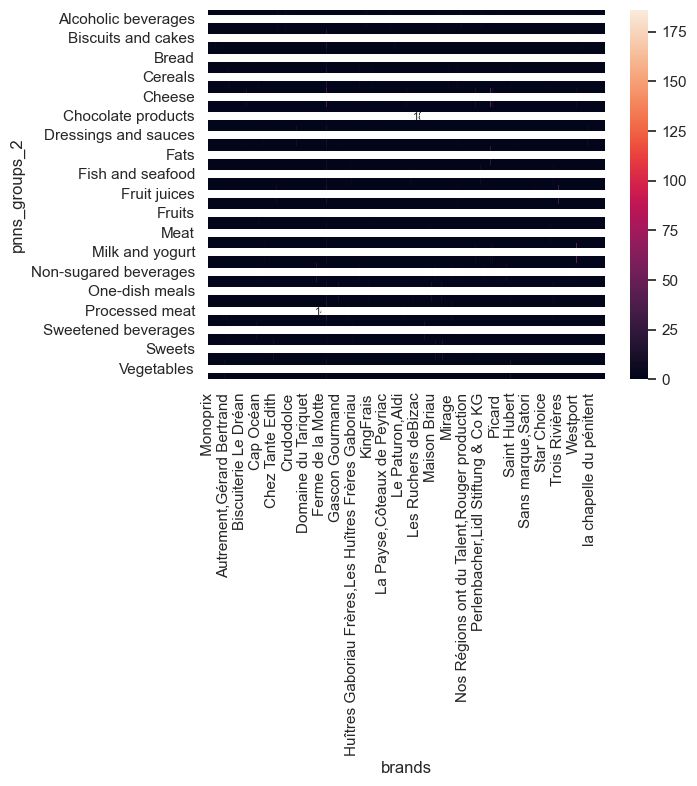

In [376]:
import pandas as pd
import seaborn as sns

# Sélectionner les colonnes pnns_groups_2 et brands
df_sub = df[['pnns_groups_2', 'brands']]

# Filtrer les lignes qui correspondent aux catégories d'aliments souhaitées
set_cats = set(['One-dish meals', 'Cereals', 'Sweets', 'Cheese', 'Non-sugared beverages', 
                'Processed meat', 'Alcoholic beverages', 'Biscuits and cakes', 
                'Dressings and sauces', 'Vegetables', 'Fish and seafood', 'Fruits', 
                'Milk and yogurt', 'Meat', 'Chocolate products', 'Sweetened beverages', 
                'Fats', 'Fruit juices', 'Bread'])

df_sub = df_sub[df_sub['pnns_groups_2'].isin(set_cats)]

# Grouper les données par pnns_groups_2 et brands, puis faire une somme par magasin
df_grouped = df_sub.groupby(['pnns_groups_2', 'brands']).size().reset_index(name='count')
df_summed = df_grouped.groupby(['pnns_groups_2', 'brands'])['count'].agg(['sum', 'count']).reset_index()
df_summed.columns = ['pnns_groups_2', 'brands', 'total_count', 'num_products']
# 
# Créer une table de contingence
cont_table = pd.pivot_table(df_summed, values='total_count', index='pnns_groups_2', columns='brands', fill_value=0)

# Afficher un heatmap de la table de contingence
sns.heatmap(cont_table, annot=True, fmt='g')


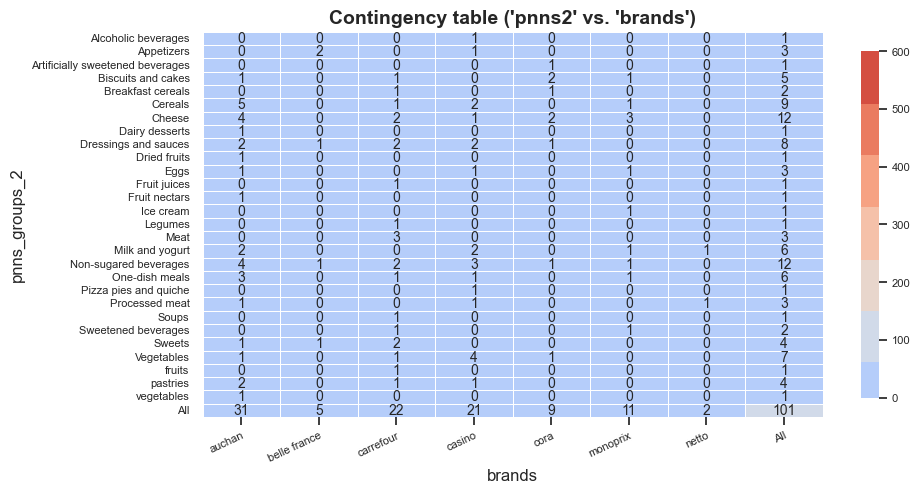

In [355]:
set_cat = set(['Legumes', 'Biscuits and cakes', 'Sweets',
 'Non-sugared beverages' ,'Sweetened beverages', 'Meat',
 'Alcoholic beverages', 'Sandwich' ,'Appetizers', 'Dressings and sauces',
 'Chocolate products', 'Dried fruits', 'Nuts' ,'One-dish meals' ,'Cheese',
 'Fruits' 'Fats' ,'Vegetables', 'Breakfast cereals' ,'Cereals', 'Fruit juices',
 'Milk and yogurt', 'Ice cream' ,'Fish and seafood' 'Bread', 'Tripe dishes',
 'pastries', 'Processed meat' ,'Pizza pies and quiche' ,'Dairy desserts',
 'Artificially sweetened beverages' ,'Eggs', 'Potatoes' ,'vegetables', 'Soups',
 'Fruit nectars', 'fruits', 'legumes', 'cereals', 'Salty and fatty products'])

# -- Getting the brands that makes the 3 categories of food
set_brands = set(['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 
                  'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora'])

# cond1 = df['brands'].isin(set_brands)
# cond2 = df['pnns_groups_2'].isin(set_cats)
# df_ = df.loc[cond1&cond2]

# df_ = df.loc[:, ['pnns_groups_2', 'brands']]

# sélectionner les colonnes de pnns2 et brands_main
df_ = df[['pnns_groups_2', 'brands']]

# filtrer les lignes qui correspondent aux valeurs de pnns_groups_2
df_ = df_[df_['pnns_groups_2'].isin(set_cat)]

# filtrer les lignes qui correspondent aux marques de la liste brands
df_ = df_[df_['brands'].isin(set_brands)]

data_crosstab = pd.crosstab(df_['pnns_groups_2'], df_['brands'], margins = True)
plot_heatmap(data_crosstab,"Contingency table ('pnns2' vs. 'brands')",
             vmin=0, center= 150, vmax=600, fmt='.0f',
             palette=sns.color_palette("coolwarm", 10),figsize=(10,5),shape='rect')

plt.show()

Établissons un classement des marques en fonction du nutriscore moyen

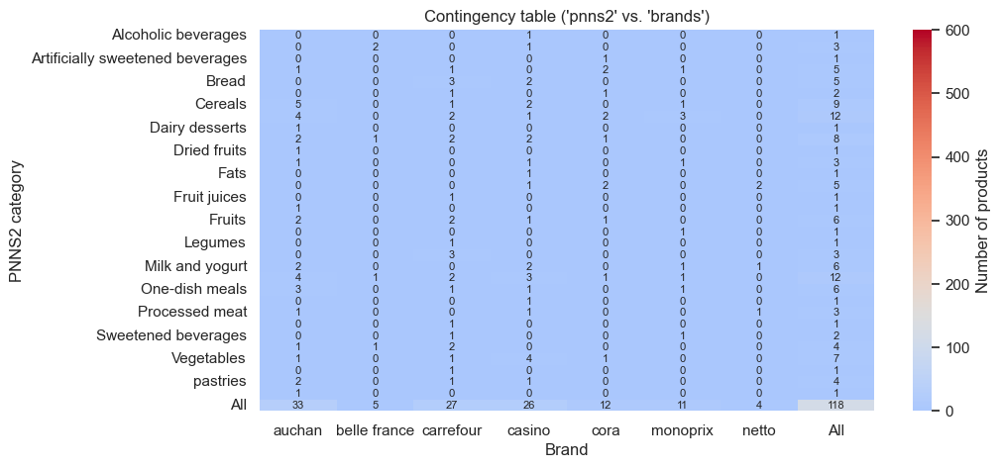

In [356]:
# Sélectionner les catégories de nourriture et les marques à inclure
set_cat = {'Legumes', 'Biscuits and cakes', 'Sweets', 'Non-sugared beverages', 'Sweetened beverages', 'Meat',
           'Alcoholic beverages', 'Sandwich', 'Appetizers', 'Dressings and sauces', 'Chocolate products', 
           'Dried fruits', 'Nuts', 'One-dish meals', 'Cheese', 'Fruits', 'Fats', 'Vegetables', 
           'Breakfast cereals', 'Cereals', 'Fruit juices', 'Milk and yogurt', 'Ice cream', 'Fish and seafood', 
           'Bread', 'Tripe dishes', 'pastries', 'Processed meat', 'Pizza pies and quiche', 'Dairy desserts', 
           'Artificially sweetened beverages', 'Eggs', 'Potatoes', 'vegetables', 'Soups', 'Fruit nectars', 
           'fruits', 'legumes', 'cereals', 'Salty and fatty products'}

set_brands = {'monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 'tu', 'casino', 
              'carrefour', 'delhaize', 'belle france', 'netto', 'cora'}

# Sélectionner les colonnes pnns2 et brands et filtrer selon les catégories de nourriture et les marques sélectionnées
df_ = df.loc[df['pnns_groups_2'].isin(set_cat) & df['brands'].isin(set_brands), ['pnns_groups_2', 'brands']]

# Créer la table de contingence
contingency_table = pd.crosstab(df_['pnns_groups_2'], df_['brands'], margins=True)

# Créer et afficher la heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(contingency_table, cmap='coolwarm', annot=True, fmt='.0f', vmin=0, center=150, vmax=600,
            cbar_kws={'label': 'Number of products'})
plt.title('Contingency table (\'pnns2\' vs. \'brands\')')
plt.xlabel('Brand')
plt.ylabel('PNNS2 category')
plt.show()


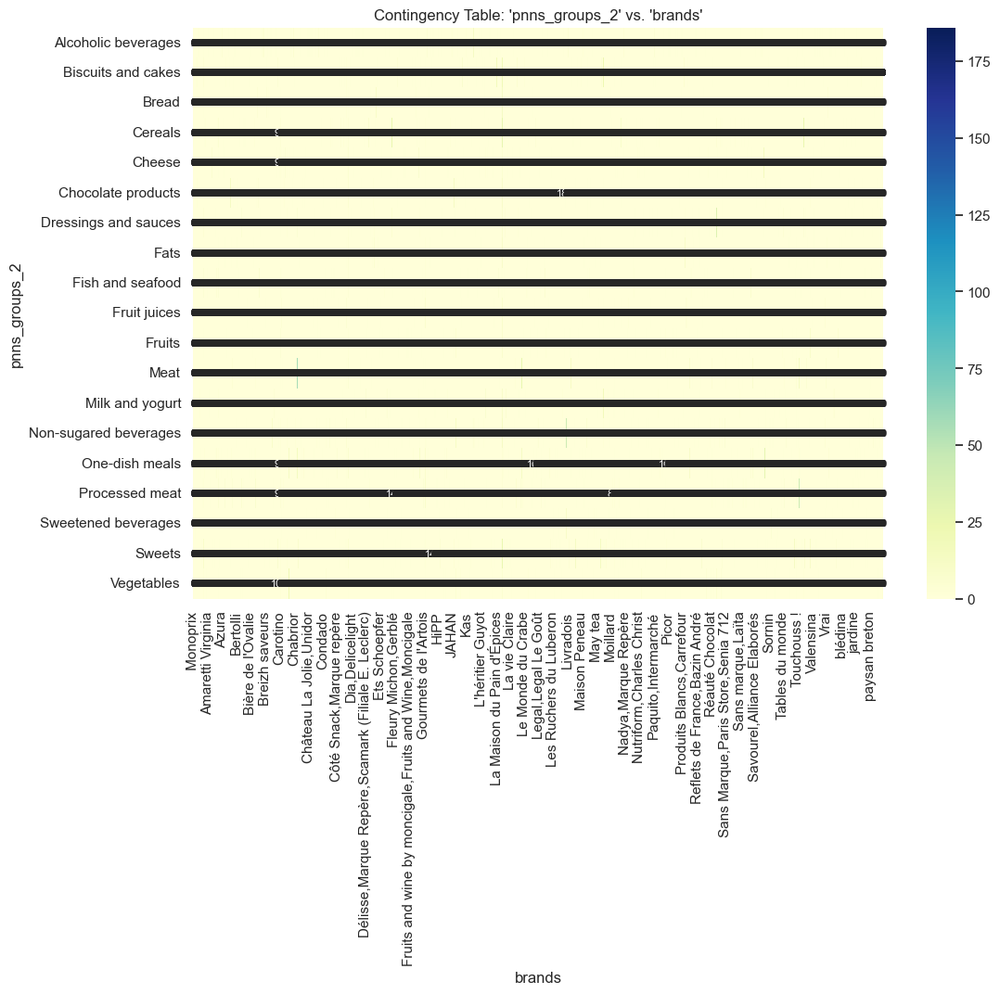

In [380]:
# Sélectionner les colonnes pnns_groups_2 et brands ici
df_sub = df[['pnns_groups_2', 'brands']]

# Filtrer les lignes qui correspondent aux catégories d'aliments souhaitées
set_cats = set(['One-dish meals', 'Cereals', 'Sweets', 'Cheese', 'Non-sugared beverages', 
                'Processed meat', 'Alcoholic beverages', 'Biscuits and cakes', 
                'Dressings and sauces', 'Vegetables', 'Fish and seafood', 'Fruits', 
                'Milk and yogurt', 'Meat', 'Chocolate products', 'Sweetened beverages', 
                'Fats', 'Fruit juices', 'Bread'])

df_sub = df_sub[df_sub['pnns_groups_2'].isin(set_cats)]

# Grouper les données par pnns_groups_2 et brands, puis faire une somme par magasin
df_grouped = df_sub.groupby(['pnns_groups_2', 'brands']).size().reset_index(name='count')
df_summed = df_grouped.groupby(['pnns_groups_2', 'brands'])['count'].agg(['sum', 'count']).reset_index()
df_summed.columns = ['pnns_groups_2', 'brands', 'total_count', 'num_products']

# Transformer df_summed en une table de contingence
contingency_table = df_summed.pivot_table(index='pnns_groups_2', columns='brands', values='total_count', fill_value=0)

# Créer une heatmap à partir de la table de contingence
plt.figure(figsize=(12, 8))
sns.heatmap(contingency_table, annot=True, fmt="d", cmap="YlGnBu")
plt.title("Contingency Table: 'pnns_groups_2' vs. 'brands'")
plt.ylabel('pnns_groups_2')
plt.xlabel('brands')
plt.show()

brands                            auchan  belle france  carrefour  casino  \
pnns_groups_2                                                               
Alcoholic beverages               0       0             0          1        
Appetizers                        0       2             0          1        
Artificially sweetened beverages  0       0             0          0        
Biscuits and cakes                1       0             1          0        
Bread                             0       0             3          2        
Breakfast cereals                 0       0             1          0        
Cereals                           5       0             1          2        
Cheese                            4       0             2          1        
Dairy desserts                    1       0             0          0        
Dressings and sauces              2       1             2          2        
Dried fruits                      1       0             0          0        

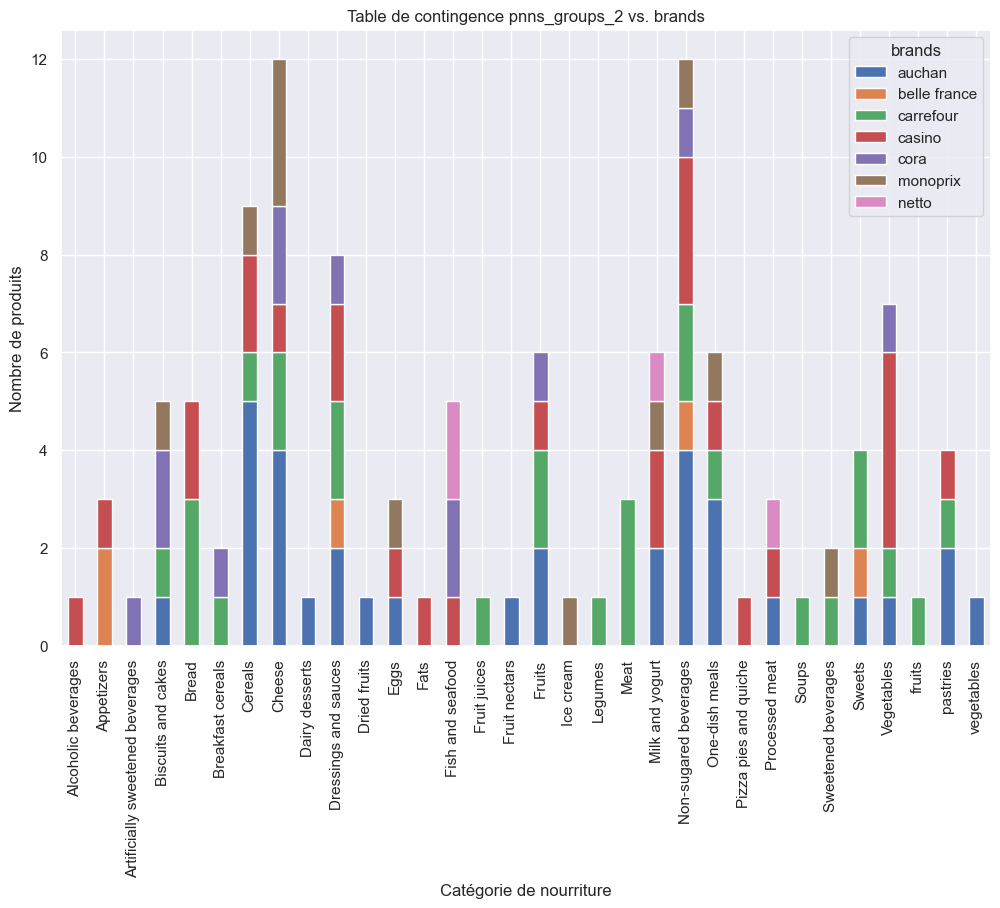

In [357]:
# créer un dataframe filtré
df_filt = df.loc[df['pnns_groups_2'].isin(set_cat) & df['brands'].isin(set_brands)]

# créer la table de contingence
cont_table = pd.crosstab(df_filt['pnns_groups_2'], df_filt['brands'])

# afficher la table de contingence
print(cont_table)

# créer le graphique de la table de contingence
cont_table.plot(kind='bar', stacked=True, figsize=(12,8))
plt.xlabel('Catégorie de nourriture')
plt.ylabel('Nombre de produits')
plt.title('Table de contingence pnns_groups_2 vs. brands')
plt.show()


In [127]:
## Nutriscore ranking the brands for each pnns2 category
set_cat = set(['Legumes', 'Biscuits and cakes', 'Sweets',
 'Non-sugared beverages' ,'Sweetened beverages', 'Meat',
 'Alcoholic beverages', 'Sandwich' ,'Appetizers', 'Dressings and sauces',
 'Chocolate products', 'Dried fruits', 'Nuts' ,'One-dish meals' ,'Cheese',
 'Fruits' 'Fats' ,'Vegetables', 'Breakfast cereals' ,'Cereals', 'Fruit juices',
 'Milk and yogurt', 'Ice cream' ,'Fish and seafood' 'Bread', 'Tripe dishes',
 'pastries', 'Processed meat' ,'Pizza pies and quiche' ,'Dairy desserts',
 'Artificially sweetened beverages' ,'Eggs', 'Potatoes' ,'vegetables', 'Soups',
 'Fruit nectars', 'fruits', 'legumes', 'cereals', 'Salty and fatty products'])

# -- Getting the brands that makes the 3 categories of food
# set_brands = set(df['brands'].dropna().unique())
set_brands = set(['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 
                  'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora'])
# -- Mean nutriscore for each brand and each category
df_nutri_mean, df_nutri_median = pd.DataFrame([]), pd.DataFrame([])
for c in set_cat:
    for b in set_brands:
        c1 = df['brands']==b
        c2 = df['pnns_groups_2']==c
        df_nutri_mean.loc[b,c] = df[c1&c2]['nutrition-score-fr_100g'].mean()
        df_nutri_median.loc[b,c] = df[c1&c2]['nutrition-score-fr_100g'].median()

# -- Rank of each brand for each prodcut
df_rank_mean, df_rank_median = pd.DataFrame([]), pd.DataFrame([])
df_rank_mean = df_nutri_mean.apply(rankdata,axis=0)
df_rank_median = df_nutri_median.apply(rankdata,axis=0)

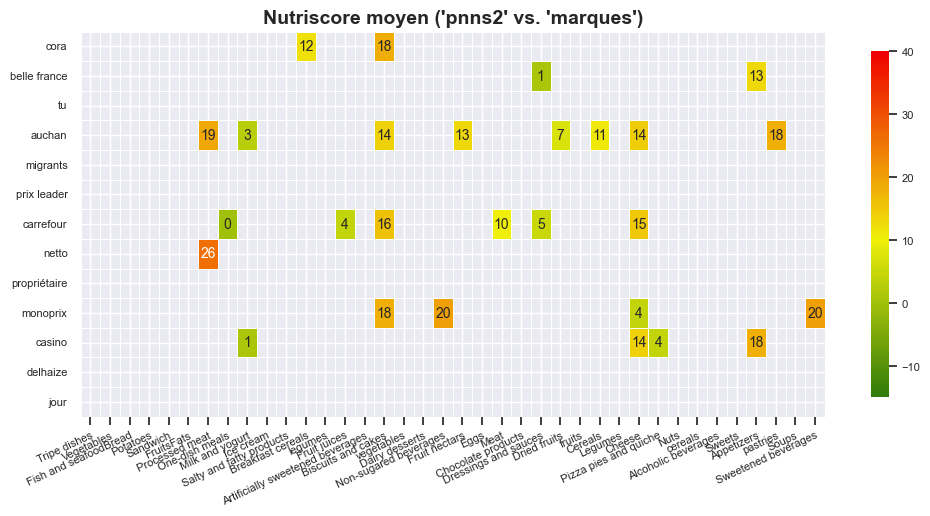

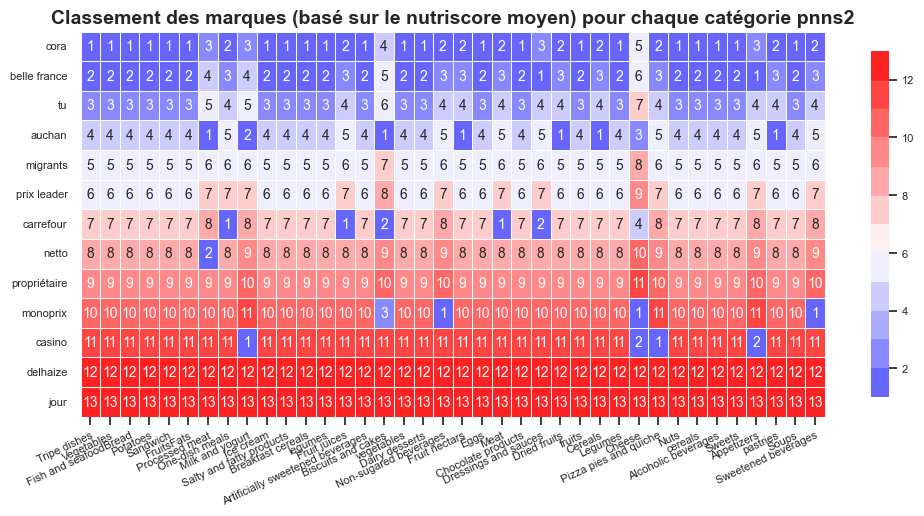

In [128]:
# Importation des bibliothèques nécessaires
from matplotlib.colors import ListedColormap

# Définition de la colormap "Green2Red" allant du vert au rouge
N = 128
vals = np.ones((2*N, 4))
vals[:, 0] = np.concatenate((np.linspace(5/N, 120/N, N), np.linspace(120/N, 120/N, N)))
vals[:, 1] = np.concatenate((np.linspace(50/N, 120/N,  N), np.linspace(120/N, 0/N, N)))
vals[:, 2] = np.concatenate((np.linspace(5/N, 5/N, N), np.linspace(5/N, 0/N, N)))
Green2Red = ListedColormap(vals)

# Plotting du premier heatmap
# Nutriscore moyen pour chaque marque et catégorie pnns2
plot_heatmap(df_nutri_mean,
             "Nutriscore moyen ('pnns2' vs. 'marques')",
             vmin=-15, center=10, vmax=40, fmt='.0f',
             palette=Green2Red,
             figsize=(12, 5), shape='rect')

# Affichage du premier heatmap
plt.show()

# Plotting du deuxième heatmap
# Classement des marques pour chaque catégorie pnns2
plot_heatmap(df_rank_mean,
             "Classement des marques (basé sur le nutriscore moyen) pour chaque catégorie pnns2",
             vmin=1, center=6, vmax=13, fmt='.0f',
             palette=sns.color_palette("bwr", 14),
             figsize=(12, 5), shape='rect')

# Affichage du deuxième heatmap
plt.show()


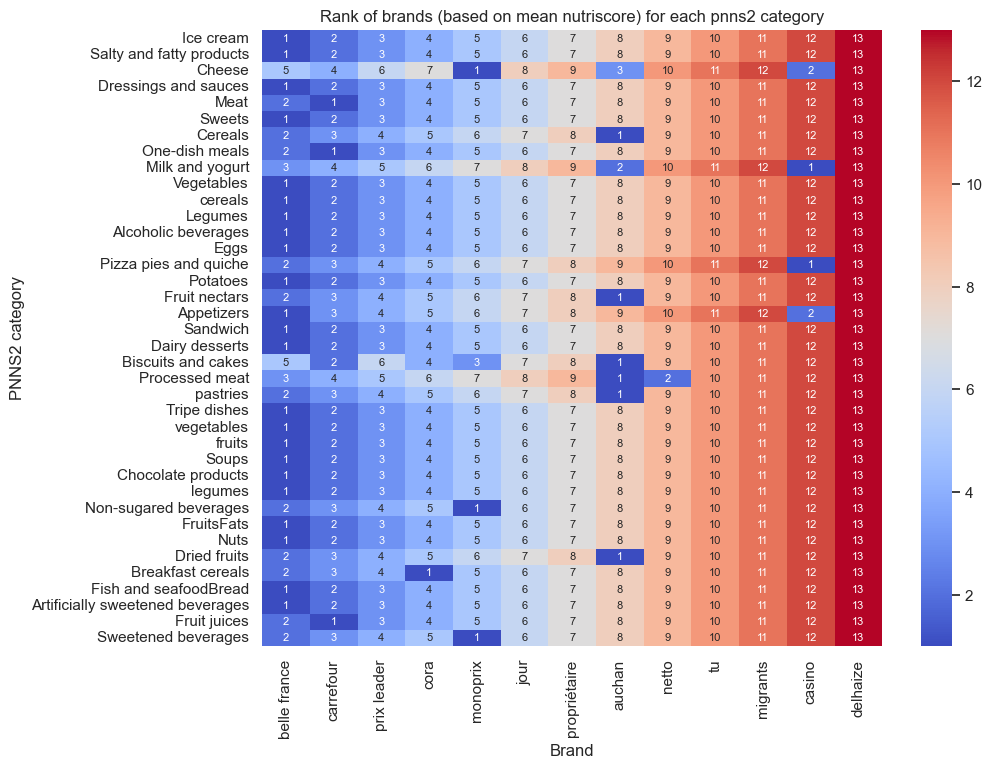

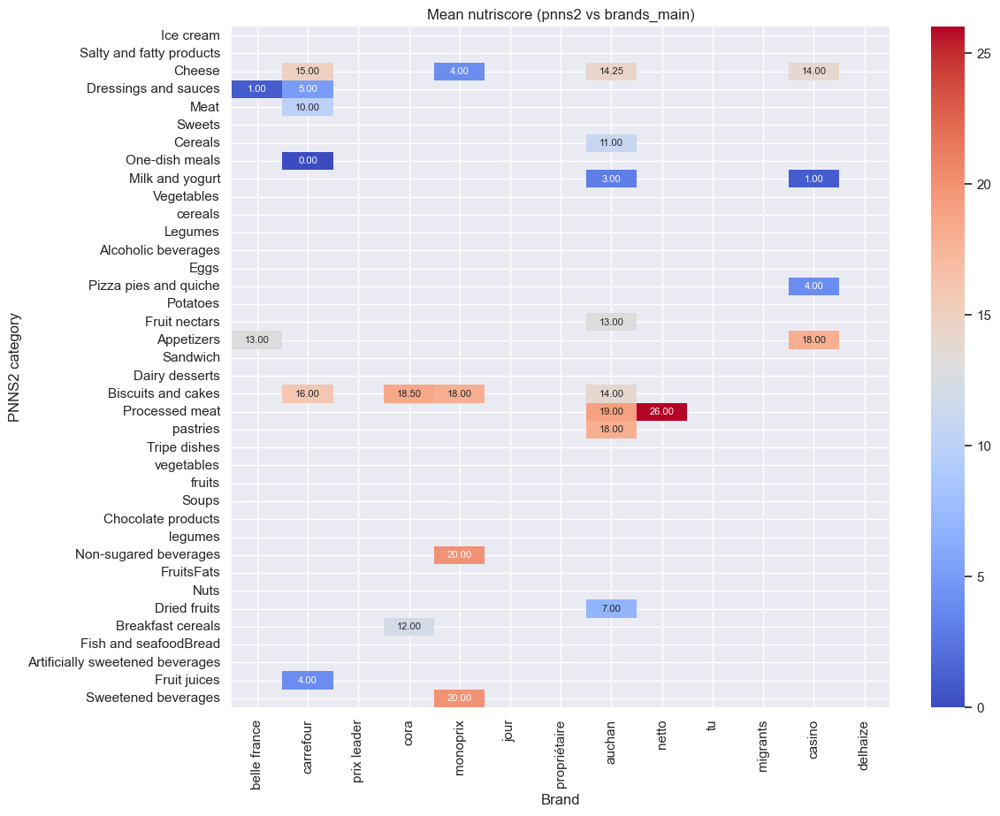

In [341]:
# Heatmap for rank of brands based on mean nutriscore for each pnns2 category
plt.figure(figsize=(10, 8))
sns.heatmap(df_rank_mean.T, cmap='coolwarm', annot=True, fmt='g')
plt.title('Rank of brands (based on mean nutriscore) for each pnns2 category')
plt.xlabel('Brand')
plt.ylabel('PNNS2 category')
plt.show()

# Heatmap for mean nutriscore (pnns2 vs brands_main)
plt.figure(figsize=(12, 10))
sns.heatmap(df_nutri_mean.T, cmap='coolwarm', annot=True, fmt='.2f')
plt.title('Mean nutriscore (pnns2 vs brands_main)')
plt.xlabel('Brand')
plt.ylabel('PNNS2 category')
plt.show()

    

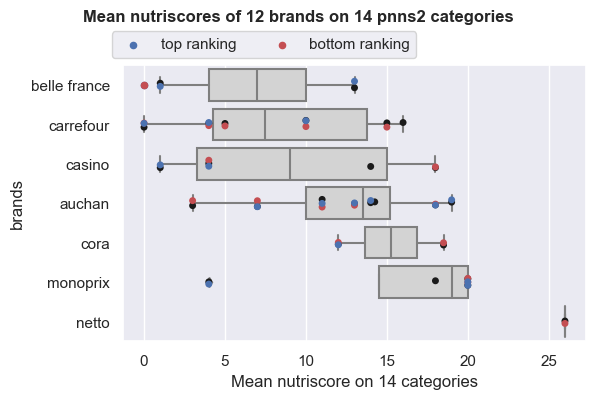

In [360]:
# Showing the ranking of brands for mean nutriscores on pnns2 categories

# -- Preparing unstacked dataframes for easier plotting with seaborn
df_ = df_nutri_mean.T.reset_index().rename(columns={'index':'pnns_groups_2'})
df_ = df_.melt(id_vars=['pnns_groups_2'] , var_name='brand',
                    value_vars=df_nutri_mean.index, value_name='nutri_mean' )
ordered_brands = df_nutri_mean.mean(axis=1).sort_values().index
df_bottom_ = df_nutri_mean.where(df_nutri_mean==df_nutri_mean.max(axis=0))
df_bottom_ = df_bottom_.T.reset_index().rename(columns={'index':'pnns_groups_2'})
df_bottom_ = df_bottom_.melt(id_vars=['pnns_groups_2'] , var_name='brand',
                    value_vars=df_nutri_mean.index, value_name='nutri_mean')

df_top_ = df_nutri_mean.where(df_nutri_mean==df_nutri_mean.min(axis=0))
df_top_ = df_top_.T.reset_index().rename(columns={'index':'pnns_groups_2'})
df_top_ = df_top_.melt(id_vars=['pnns_groups_2'] , var_name='brand',
                    value_vars=df_nutri_mean.index, value_name='nutri_mean' )

# -- Plotting boxplots, stripplots of mean nutriscores and first, last rankings
fig = plt.figure(figsize=(6,4))
sns.boxplot(y='brand' , x='nutri_mean', color='lightgrey',
            data = df_, order = ordered_brands)
sns.stripplot(y='brand' , x='nutri_mean', color='k',
              data = df_, order = ordered_brands)
sns.stripplot(y='brand' , x='nutri_mean', color='r',
              data = df_bottom_, order = ordered_brands)
sns.stripplot(y='brand' , x='nutri_mean', color='b',
              data = df_top_, order = ordered_brands)
ax = plt.gca()
ax.scatter([0],[0], c='b', s=20, label='top ranking')
ax.scatter([0],[0], c='r', s=20, label='bottom ranking')
plt.tight_layout(rect=[0,0,1,0.87])
plt.suptitle('Mean nutriscores of 12 brands on 14 pnns2 categories',
             fontweight='bold', fontsize=12)
ax.set_xlabel('Mean nutriscore on 14 categories'), ax.set_ylabel('brands')
ax.legend(bbox_to_anchor=(0.65,1.15), ncol=2)

plt.show()

In [361]:
# First and last rankings for each brand

df_res = pd.DataFrame([])
df_res['top rank brand'] = df_rank_mean.idxmin(axis=0)
df_res['bottom rank brand'] = df_rank_mean.idxmax(axis=0)

print('--- BETTER RANKING ---')
print(df_res['top rank brand'].value_counts())
print("---- Lists of first ranking -----")
[print(b +': '+ str(list(df_res[df_res['top rank brand']==b].index)))\
                              for b in set(df_res['top rank brand'])];
print('--- WORST RANKING ---')
print(df_res['bottom rank brand'].value_counts())
print("\n---- Lists of last ranking -----")
[print(b +': '+ str(list(df_res[df_res['bottom rank brand']==b].index)))\
                              for b in set(df_res['bottom rank brand'])];

--- BETTER RANKING ---
belle france    23
auchan          6 
monoprix        3 
carrefour       3 
casino          2 
cora            1 
Name: top rank brand, dtype: int64
---- Lists of first ranking -----
belle france: ['Ice cream', 'Salty and fatty products', 'Dressings and sauces', 'Sweets', 'Vegetables', 'cereals', 'Legumes', 'Alcoholic beverages', 'Eggs', 'Potatoes', 'Appetizers', 'Sandwich', 'Dairy desserts', 'Tripe dishes', 'vegetables', 'fruits', 'Soups', 'Chocolate products', 'legumes', 'FruitsFats', 'Nuts', 'Fish and seafoodBread', 'Artificially sweetened beverages']
carrefour: ['Meat', 'One-dish meals', 'Fruit juices']
cora: ['Breakfast cereals']
monoprix: ['Cheese', 'Non-sugared beverages', 'Sweetened beverages']
auchan: ['Cereals', 'Fruit nectars', 'Biscuits and cakes', 'Processed meat', 'pastries', 'Dried fruits']
casino: ['Milk and yogurt', 'Pizza pies and quiche']
--- WORST RANKING ---
delhaize    38
Name: bottom rank brand, dtype: int64

---- Lists of last ranking ----

Ce graphique et les données imprimées ci-dessous montrent que certaines marques ont en effet de meilleurs nutriscores moyens que d'autres. On remarque notamment que :

- belle france et auchan sont les deux premiers du meilleur classement

- Delhaize a le pire classement

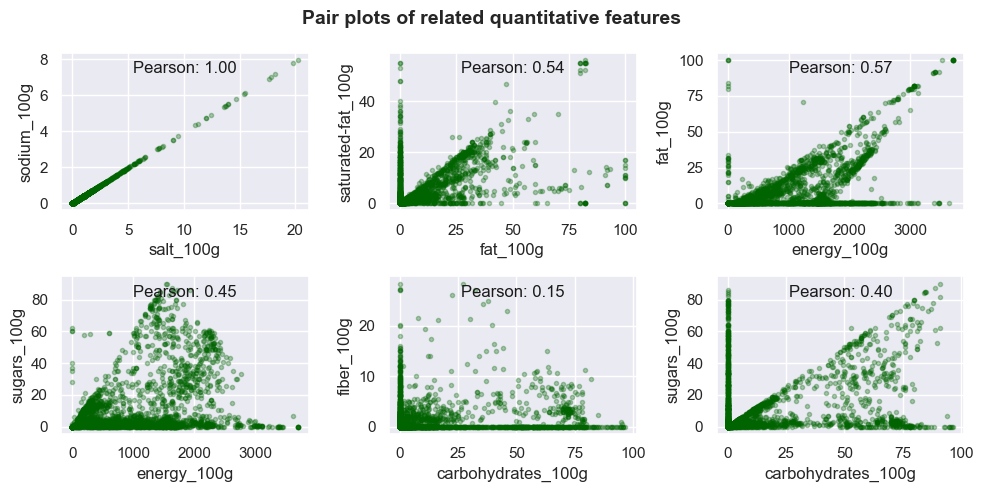

In [283]:
# Function to show scatter plot:

def pair_plot(df,c):
    x, y = c
    plt.scatter(df[x], df[y], marker='.', alpha=0.3, color = 'darkgreen')
    # plt.scatter(df[x], df[y], marker='o', edgecolors='darkblue',
    #             alpha=0.5, color='grey', s=20)
      
    plt.xlabel(x), plt.ylabel(y)
    plt.text(0.5, 0.9, 'Pearson: %.2f'%df[c].corr().iloc[0,1],
        ha='center', va='center', fontsize=12, c='k', transform=ax.transAxes)

dict_couples = {'c1': ['salt_100g', 'sodium_100g'],
                'c2': ['fat_100g', 'saturated-fat_100g'],
                'c3': ['energy_100g', 'fat_100g'],
                'c4': ['energy_100g', 'sugars_100g'],
                'c5': ['carbohydrates_100g', 'fiber_100g'],
                'c6': ['carbohydrates_100g', 'sugars_100g']}

# Plotting related features

fig = plt.figure(figsize=(10,5))
for i, c in enumerate(dict_couples.items(),1):
    ax = fig.add_subplot(2,3,i)
    pair_plot(df.sample(5000),c[1])
plt.tight_layout(rect=[0,0,1,0.93])
plt.suptitle('Pair plots of related quantitative features',
             fontweight='bold', fontsize=14)

plt.show()

Comme prévu, le sodium est corrélé avec le sel et les matières grasses à l'énergie provenant des matières grasses.

Les sucres et les fibres sont inférieurs aux glucides, et l'énergie provenant des graisses est inférieure à l'énergie totale.

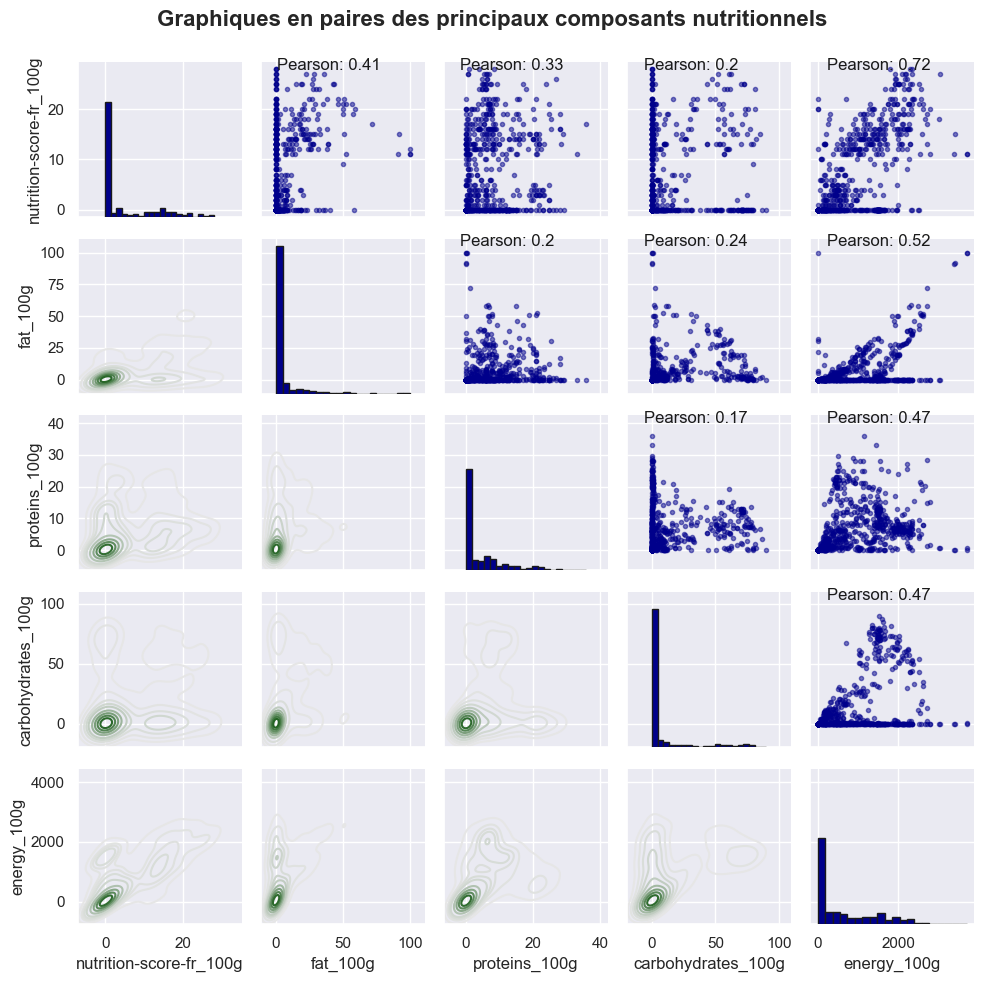

In [270]:
# Scatterplot matrix on main nutritional components (too much data -> on a sample)

# Creating grey to blue colormap
N = 256
vals = np.ones((N, 4))
vals[:, 0] = np.linspace(0.9, 5/N, N)
vals[:, 1] = np.linspace(0.9, 80/N,  N)
vals[:, 2] = np.linspace(0.9, 5/N, N)
Grey2Green = ListedColormap(vals)

# Function that prints Pearson correlation coefficient
def print_corr(x, y, **kwargs):
    label = r'Pearson: ' + str(round(np.corrcoef(x, y)[0][1], 2))
    ax = plt.gca()
    ax.annotate(label, xy = (0.1, 0.95), c='k', size = 12,
                xycoords = ax.transAxes)

cols = ['nutrition-score-fr_100g', 'fat_100g', 'proteins_100g','carbohydrates_100g', 'energy_100g']
df_sample = df.sample(1000)

# Creating the grid
grid = sns.PairGrid(data=df_sample,
                    vars=cols, height=2)

# Mapping the grid with plots and text
# grid = grid.map_upper(plt.scatter, marker='o', edgecolors='darkblue',
#                       alpha=0.5, color='blue', s=20)
grid = grid.map_upper(plt.scatter, marker='.', alpha=0.5, color = 'darkblue')
grid = grid.map_upper(print_corr)
grid = grid.map_diag(plt.hist, bins = 20, color = 'darkblue', edgecolor = 'k')
grid = grid.map_lower(sns.kdeplot, cmap = Grey2Green)

plt.tight_layout(rect=[0,0,1,0.95])
plt.suptitle('Graphiques en paires des principaux composants nutritionnels',
             fontweight='bold', fontsize=16)

plt.show()

Ces diagrammes de paires montrent que :

- le nutriscore augmente avec la teneur en lipides puis en glucides 
- le nutriscore augmente avec l'énergie en général
- les produits à haute teneur en matières grasses ont tendance à contenir moins de glucides et ceux qui contiennent plus de glucides ont tendance à contenir moins de matières grasses.
- peu de produits ont une forte teneur en protéines
- l'énergie a tendance à augmenter de manière cohérente avec la teneur en lipides et en glucides, mais les protéines ont moins d'influence sur la teneur énergétique totale, probablement parce que la plupart des produits contiennent moins de protéines que les lipides et les glucides.

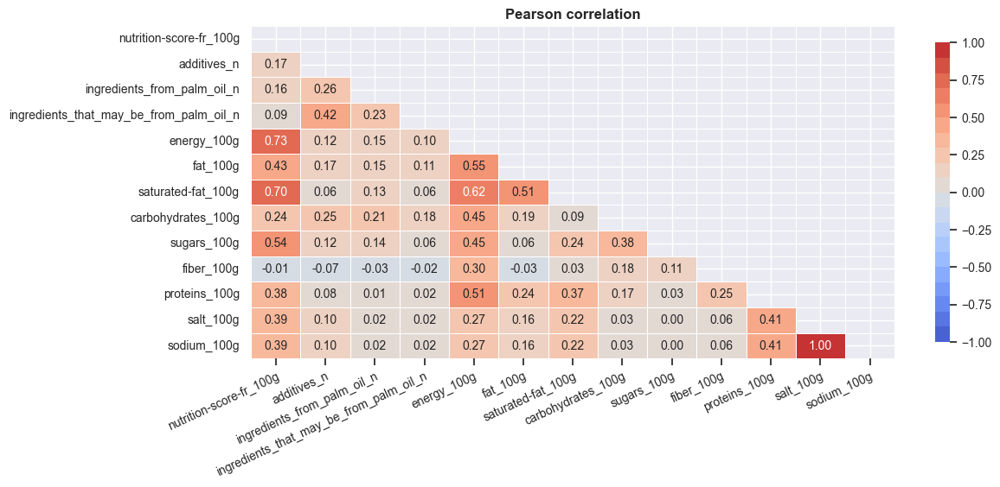

In [260]:
# Linear correlation (Pearson)

cols = quant_cols
pears_corr = df[cols].corr()
plot_heatmap(pears_corr, shape='tri',
             title="Pearson correlation", figsize=(12,5))

plt.show()

Si les distributions étaient normales, on pourrait rejetter l'hypothèse d'indépendance : la moyenne des échantillons de salt_100g est liée à la valeur de nutrition_grade

Comme nous l'avons déjà vu ci-dessus sur les graphiques de paires, certaines des corrélations sont assez évidentes, comme par exemple :

- gras -> énergie
- sucres -> glucides
- lipides, saturés, lipides, sucres, énergie -> nutriscore


Mais, plus surprenant :

plus de fibres peuvent être trouvées dans les produits à haute énergie
Comme nous le savons par sa formule, le nutriscore, sans surprise :

augmente avec l'énergie, les graisses saturées, le sucre et le sel
diminue avec la teneur en fibres, protéines et fruits et légumes

Cependant, pour la plupart des produits, la plupart des facteurs corrélés au nutriscore sont (par ordre décroissant d'importance) :

énergie, gras saturés, lipides, glucides, sucre (coefficient de Pearson >0,4)

les glucides, le sel et les fibres ont moins d'influence sur le nutriscore (abs(coeff de pearson) < 0,25)

=> Pour obtenir de meilleurs nutrigrades, l'industrie alimentaire devrait se concentrer principalement sur la diminution de la teneur en matières grasses, en sucre et en énergie globale de ses produits .



Nous testerons la corrélation linéaire (Pearson) et la relation monotone (Spearman, Kendall).

In [113]:
# Index(['additives_n', 'ingredients_from_palm_oil_n',
#        'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
#        'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
#        'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g'],
#       dtype='object')

# Définir les couples de variables pour effectuer les tests de corrélation
test_couples = [('fat_100g', 'nutrition-score-fr_100g'), ('carbohydrates_100g', 'nutrition-score-fr_100g'),
                ('proteins_100g', 'nutrition-score-fr_100g'), ('energy_100g', 'nutrition-score-fr_100g'),
                ('fiber_100g', 'nutrition-score-fr_100g'), ('sugars_100g', 'nutrition-score-fr_100g'),
                ('fat_100g', 'fiber_100g'), ('fat_100g', 'salt_100g'),
                ('ingredients_from_palm_oil_n', 'fiber_100g'), ('ingredients_from_palm_oil_n', 'salt_100g')]


# # Charger les données
# data = pd.read_csv('data/fr.openfoodfacts.org.products_cleaned5.csv')
# #df = df.fillna(0) # Remplacez les NaN par la valeur 0

# # Copier les données dans un nouveau dataframe
df_ = data.copy()

# Remplacer les valeurs infinies et manquantes par NaN
df_ = df_.replace([np.inf, -np.inf], np.nan).dropna()
nombre_de_lignes = data.shape[0]
print (nombre_de_lignes)
# Effectuer un échantillonnage aléatoire des données pour réduire la taille des données
df_ = df_.sample(min(10000, nombre_de_lignes), replace=True, random_state=42)


# Parcourir la liste des couples de variables et effectuer les tests de corrélation
for tup in test_couples:
    print('------'+str(tup).upper()+'-----')
    c1, c2 = tup
    display(correlation_tests(df_[c1], df_[c2], print_opt=False))


77689
------('FAT_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.406905,0.0
Spearman,0.463616,0.0
Kendall,0.314199,0.0


------('CARBOHYDRATES_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.108224,1.930382e-27
Spearman,0.100300,8.813938e-24
Kendall,0.060477,2.304602e-16


------('PROTEINS_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.134804,9.004171e-42
Spearman,-0.015166,1.294044e-01
Kendall,-0.003101,6.728425e-01


------('ENERGY_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.716715,0.0
Spearman,0.684634,0.0
Kendall,0.457533,0.0


------('FIBER_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,-0.092029,2.934281e-20
Spearman,-0.120538,1.102921e-33
Kendall,-0.115928,4.899596e-55


------('SUGARS_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.573657,0.0
Spearman,0.550789,0.0
Kendall,0.403784,0.0


------('FAT_100G', 'FIBER_100G')-----


,stat,p_value
Pearson,-0.367896,4.043018e-318
Spearman,-0.360452,1.540712e-304
Kendall,-0.298817,0.000000e+00


------('FAT_100G', 'SALT_100G')-----


,stat,p_value
Pearson,-0.300198,2.446135e-207
Spearman,-0.354787,1.909324e-294
Kendall,-0.236100,1.526757e-243


------('INGREDIENTS_FROM_PALM_OIL_N', 'FIBER_100G')-----


,stat,p_value
Pearson,-0.294539,2.586866e-199
Spearman,-0.359260,2.132248e-302
Kendall,-0.305456,1.281697e-282


------('INGREDIENTS_FROM_PALM_OIL_N', 'SALT_100G')-----


,stat,p_value
Pearson,-0.107435,4.599012e-27
Spearman,-0.134243,1.950512e-41
Kendall,-0.112985,4.395554e-41


Les 3 tests indiquent une relation linéaire avec un niveau de confiance de 5 % entre la combinaison des caractéristiques énumérées ci-dessus. Cependant, nous devons tempérer ces conclusions car cette sensibilité élevée peut être principalement due à la grande quantité de données disponibles. Si nous soumettons un échantillon de 1 000 ou 10 000 des données aux mêmes tests, les conclusions sont plus conformes aux conclusions qui peuvent être facilement tirées des diagrammes de paires

In [114]:
##### Analyse en composantes principales #####

# Paramètre l'affichage pour la mise en forme des valeurs
np.set_printoptions(formatter={'float': '{: 6.2f}'.format})

# --Sélection des caractéristiques et des index (dropna) pour l'ACP
pca_cols =  [ 'additives_n', 'ingredients_from_palm_oil_n',
             'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
             'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
             'proteins_100g', 'salt_100g', 'sodium_100g']

# Supprime la caractéristique "nutriscore" des colonnes à considérer
pca_cols = [c for c in pca_cols if c!='nutriscore']

# Sélectionne un échantillon aléatoire de 10000 observations sans valeur manquante 
df_sample = df.loc[:, pca_cols].dropna(how='any').sample(10000)

# Stocke les index des observations sélectionnées
id_code = df_sample.index

# Transforme l'échantillon en matrice numérique
X = df_sample.values

# --Standardisation des données
X_sc = StandardScaler().fit_transform(X)

# -- Détermination des composantes principales
n_comp = 12
pca = PCA(n_components=n_comp).fit(X_sc)

# -- Coefficients des composantes principales (en fonction des caractéristiques initiales)
pca_df = pd.DataFrame(pca.components_,
                      index=['PC'+str(i+1) for i in range(n_comp)],
                      columns=pca_cols).T

# Projection de X sur les composantes principales
X_proj = pca.transform(X_sc)


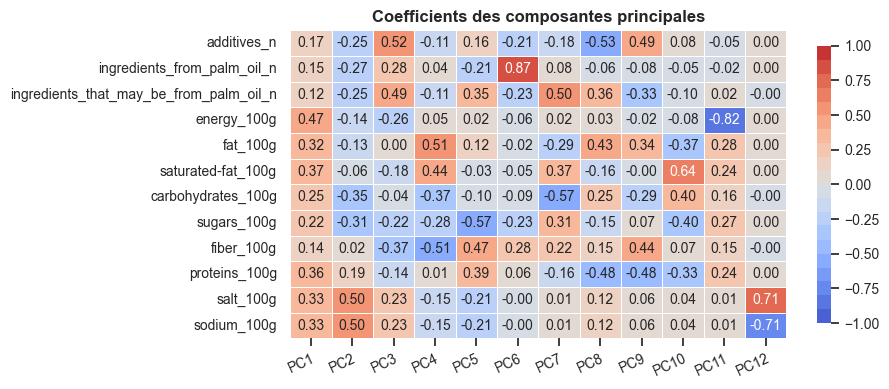

In [115]:
# Plotting principal components coefficient
# Tracé du coefficient des composantes principales

plot_heatmap(pca_df,'Coefficients des composantes principales', vmin=-1, vmax=1, center=0,
             palette=sns.color_palette("coolwarm", 20),figsize=(8,4),shape='rect')
plt.show()

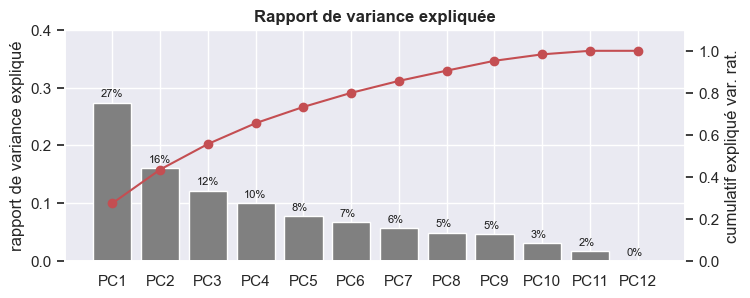

In [116]:
# Plotting explained variance ratio in scree plot
# Tracé du rapport de variance expliquée dans un graphe d'éboulis

# Obtention du ratio de variance expliquée
exp_var_rat = pca.explained_variance_ratio_

# Création d'un graphique à barres pour le ratio de variance expliquée
plt.bar(x=pca_df.columns, height=exp_var_rat, color='grey')

# Configuration de l'axe y principal
ax1 = plt.gca()
ax1.set(ylim=(0,0.4))

# Création d'un deuxième axe y pour la courbe de la variance expliquée cumulée
ax2 = ax1.twinx()
ax2.plot(exp_var_rat.cumsum(), 'ro-')
ax2.set(ylim=(0,1.1))

# Configuration des étiquettes des axes y
ax1.set_ylabel('rapport de variance expliqué')
ax2.set_ylabel('cumulatif expliqué var. rat.')

# Ajout des pourcentages au-dessus des barres
for i, p in enumerate(ax1.patches):
    ax1.text( p.get_width()/5 + p.get_x(), p.get_height()+ p.get_y()+0.01,
             '{:.0f}%'.format(exp_var_rat[i]*100),
                fontsize=8, color='k')

# Configuration de la taille du graphique et ajout d'un titre
plt.gcf().set_size_inches(8,3)
plt.title('Rapport de variance expliquée', fontweight='bold')

# Sauvegarde et affichage du graphique

plt.grid(False)

# Affichage du graphique
plt.show()



In [117]:
pca_cols

['additives_n',
 'ingredients_from_palm_oil_n',
 'ingredients_that_may_be_from_palm_oil_n',
 'energy_100g',
 'fat_100g',
 'saturated-fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'sodium_100g']

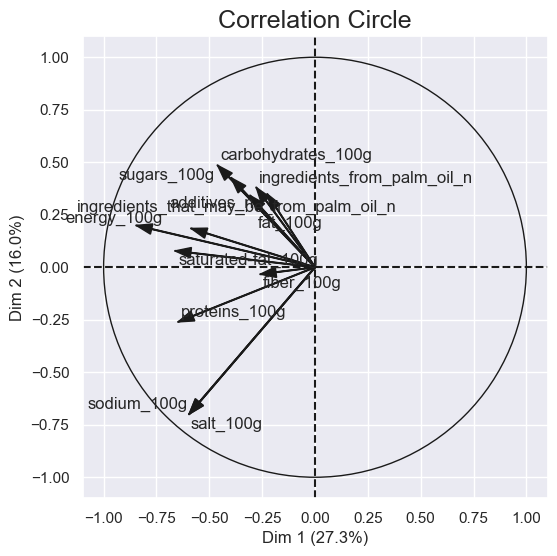

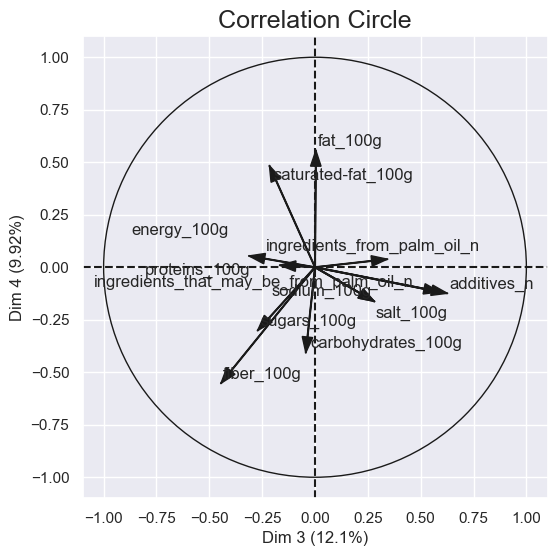

In [118]:
# POUR RECALCULER LA PCA AVEC MLXTEND

figure, correlation_matrix = \
     plot_pca_correlation_graph(X = X_sc, variables_names = pca_cols,
                                dimensions=(1, 2), figure_axis_size=6)
figure, correlation_matrix = \
     plot_pca_correlation_graph(X = X_sc, variables_names = pca_cols,
                                dimensions=(3, 4), figure_axis_size=6)

In [119]:
correlation_matrix

,Dim 1,Dim 2,Dim 3,Dim 4
additives_n,-0.307102,0.341680,0.625945,-0.124115
ingredients_from_palm_oil_n,-0.278033,0.379933,0.342483,0.038530
ingredients_that_may_be_from_palm_oil_n,-0.226083,0.348732,0.589750,-0.117507
energy_100g,-0.845861,0.199169,-0.312392,0.053929
fat_100g,-0.586509,0.184966,0.004297,0.556231
saturated-fat_100g,-0.661927,0.077869,-0.215516,0.483298
carbohydrates_100g,-0.461235,0.485524,-0.043518,-0.406853
sugars_100g,-0.396792,0.425991,-0.271413,-0.301278
fiber_100g,-0.259132,-0.033211,-0.444918,-0.552567
proteins_100g,-0.647638,-0.260308,-0.166400,0.009796


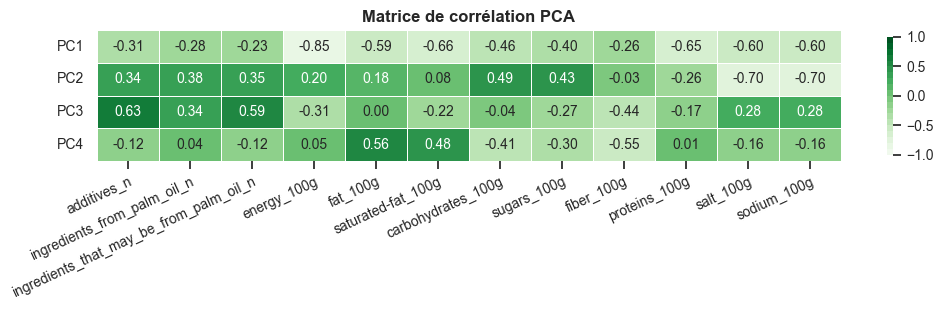

In [120]:
# Tracé de la matrice de corrélation PCA
plot_heatmap(correlation_matrix.T,'Matrice de corrélation PCA', vmin=-1, vmax=1, center=0,
             palette=sns.color_palette("Greens", 20),figsize=(12,1.7),shape='rect')
plt.gca().set_yticklabels(['PC1', 'PC2', 'PC3', 'PC4'])

# Affichage de la figure
plt.show()


In [121]:
# Plotting a sample of values projected on first factorial planes

# id_code_samp = pd.Series(id_code).sample(300)
# X_samp = df.loc[id_code_samp, pca_cols].values
# X_sc_samp = StandardScaler().fit_transform(X_samp)

# Sélection de 300 échantillons aléatoires
id_code_samp = pd.Series(id_code).sample(300)

# Sélection des colonnes PCA et des valeurs correspondantes pour les 300 échantillons sélectionnés
X_samp = df.loc[id_code_samp, pca_cols].values

# Standardisation des données d'échantillons PCA
X_sc_samp = StandardScaler().fit_transform(X_samp)


Ce code sert à sélectionner un échantillon aléatoire de 300 échantillons à partir des données transformées par l'analyse en composantes principales (PCA) et normalisées à l'aide de la StandardScaler. Cela peut être utile pour effectuer des analyses de clustering ou de classification sur un échantillon représentatif des données.

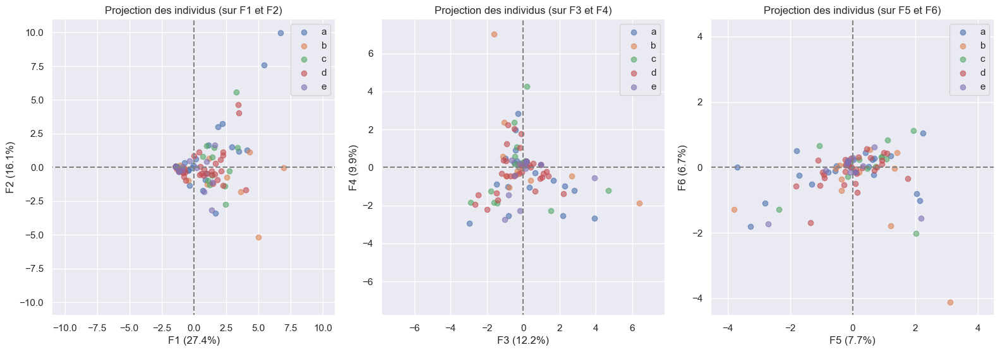

In [122]:
illus_var_p = df.loc[id_code_samp, 'nutrition_grade_fr']
illus_var_p = illus_var_p[illus_var_p.apply(lambda x: isinstance(x, str))]
display_factorial_planes(pca.transform(X_sc_samp), n_comp, pca, [(0,1),(2,3),(4,5)],
                         n_cols=3, labels=np.array(id_code_samp),
                         illus_var= illus_var_p,
                         lab_on=False, alpha=0.6)
plt.show()

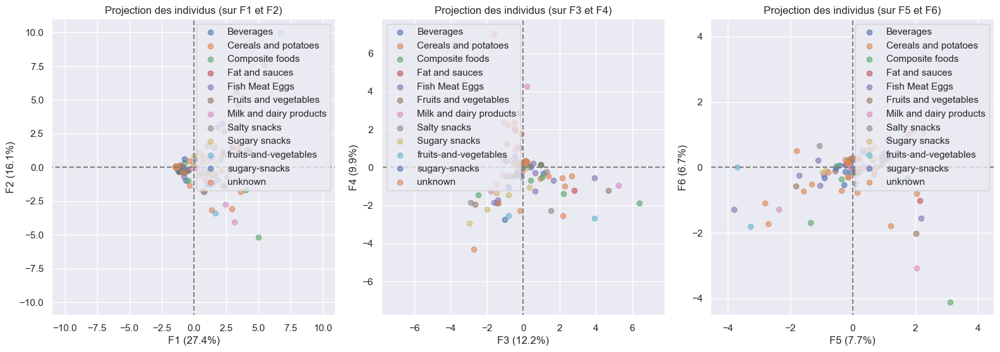

In [123]:
illus_var_p = df.loc[id_code_samp, 'pnns_groups_1']
illus_var_p = illus_var_p[illus_var_p.apply(lambda x: isinstance(x, str))]
display_factorial_planes(pca.transform(X_sc_samp), n_comp, pca, [(0,1),(2,3),(4,5)],
                         n_cols=3, labels=np.array(id_code_samp),
                         illus_var= illus_var_p,
                         lab_on=False, alpha=0.6)

plt.show()

### 4.2 Regroupement ou Clustering
Les quatre premières CP (Composantes Principales) expliquent 73 % de la variance totale. Nous allons garder ces 4 et essayer de trouver des clusters.

In [127]:
# KMeans Clustering
# Regroupement de KMeans

# --Sélection des caractéristiques et des index (dropna) pour l'ACP
numeric_cols =  [ 'additives_n', 'ingredients_from_palm_oil_n',
             'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
             'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
             'proteins_100g', 'salt_100g', 'sodium_100g']

# Nombre de clusters
n_clust = 5

# Création d'un objet KMeans avec 5 clusters et entraînement du modèle sur les données projetées X_proj
km = KMeans(n_clusters=n_clust).fit(X_proj)

# Attribution des labels de cluster pour chaque individu
clustK = km.labels_

# Ajout de la colonne 'cluster_Kmeans' dans le DataFrame df pour stocker les labels de cluster pour chaque individu
df.loc[id_code, 'cluster_Kmeans'] = clustK

# Suppression des individus qui n'ont pas de label de cluster dans le DataFrame df
df.dropna(subset=['cluster_Kmeans'], inplace=True)

# Suppression des valeurs manquantes dans les colonnes numériques du DataFrame df
df[numeric_cols].dropna()

# Affichage des labels de clusters uniques
df['cluster_Kmeans'].unique()


array([1, 3, 0, 2, 4])

Ce code effectue un clustering KMeans sur un ensemble de données numériques et assigne chaque observation à un cluster. Cela permet de regrouper des observations similaires ensemble en fonction de leurs caractéristiques numériques.

La variable n_clust définit le nombre de clusters souhaité pour l'algorithme de clustering KMeans. Ensuite, la méthode KMeans.fit() est utilisée pour ajuster le modèle KMeans à nos données projetées X_proj. La variable clustK contient les étiquettes de cluster prédites pour chaque observation de X_proj.

En tirant des conclusions sur la taille et la composition de chaque cluster, il est possible d'identifier des groupes de données similaires qui peuvent aider à comprendre les relations et les tendances sous-jacentes dans les données. Cela peut aider à prendre des décisions éclairées et à formuler des stratégies de manière plus efficace en fonction des caractéristiques communes des différents groupes.

In [129]:
## KMeans Clustering

n_clust = 5
km = KMeans(n_clusters=n_clust).fit(X_proj)
clustK = km.labels_
df.loc[id_code, 'cluster_Kmeans'] = clustK

NameError: name 'X_proj' is not defined

ValueError: could not convert string to float: 'additives_n'

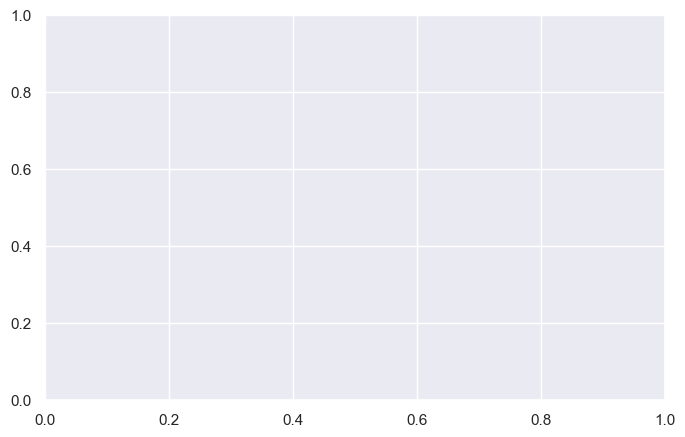

In [135]:
# Sampled Predictive Power Score (ppscore)

cols = pca_cols + ['cluster_Kmeans']

pps_corr = pps.matrix(df[cols])
plot_heatmap(pps_corr, title="Predictive Score", 
             vmin=0, center=0.5, figsize=(8,5), shape='rect',
             palette=sns.color_palette("inferno", 20), fmt='.1f')

plt.show()

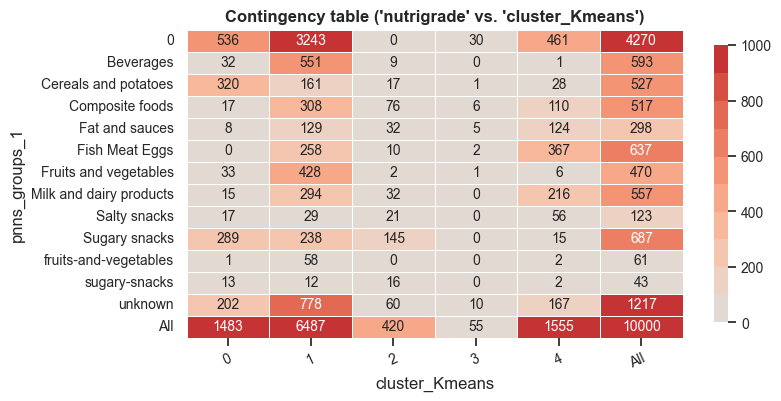

In [136]:
## Creating table of contingency

data_crosstab = pd.crosstab(df['pnns_groups_1'], 
                            df['cluster_Kmeans'],  
                               margins = True)

plot_heatmap(data_crosstab,"Contingency table ('nutrigrade' vs. 'cluster_Kmeans')",
             vmin=0, vmax=1000, palette=sns.color_palette("coolwarm", 20),
             figsize=(8,4), shape='rect', fmt='.0f')
plt.show()

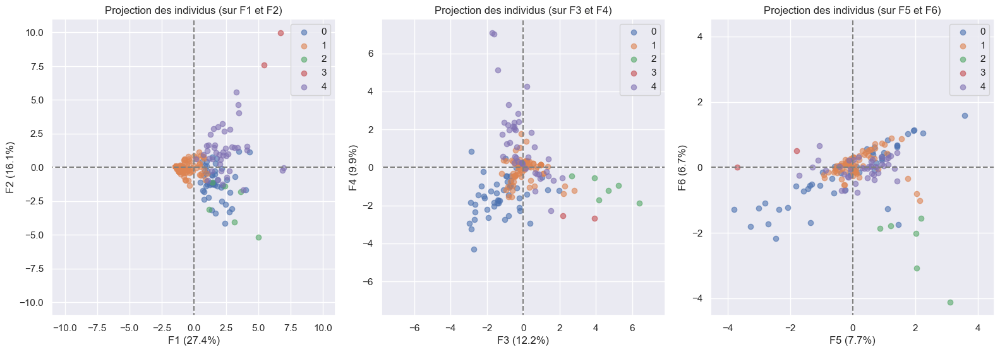

In [137]:
display_factorial_planes(pca.transform(X_sc_samp), n_comp, pca, [(0,1),(2,3),(4,5)],
                         n_cols=3, labels=np.array(id_code_samp),
                         illus_var= df.loc[id_code_samp, 'cluster_Kmeans'],
                         lab_on=False, alpha=0.6)

plt.show()

---Chi-squared
stat=4460.386, p=0.000
Probably dependent


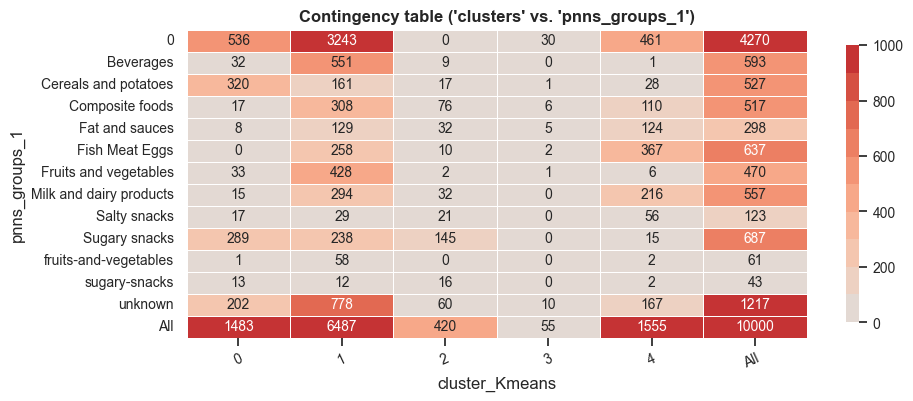

In [138]:
# Importer la bibliothèque Pandas et la fonction crosstab de Pandas pour créer une table de contingence
import pandas as pd
from pandas.api.types import CategoricalDtype

# --Sélection des caractéristiques et des index (dropna) pour l'ACP
pca_cols =  [ 'additives_n', 'ingredients_from_palm_oil_n',
             'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
             'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
             'proteins_100g', 'salt_100g', 'sodium_100g']


# Créer une table de contingence qui croise les catégories 'pnns_groups_1' et 'cluster_Kmeans'
data_crosstab = pd.crosstab(df['pnns_groups_1'], df['cluster_Kmeans'], margins=True)

# Importer la bibliothèque SciPy et la fonction chi2_contingency pour effectuer le test du chi2
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(data_crosstab)

# Imprimer les résultats du test du chi2
print('---'+"Chi-squared")
print('stat=%.3f, p=%.3f' % (stat, p))
print('Probably independent') if p > 0.05 else print('Probably dependent')

# Définir une liste de noms de colonnes à utiliser dans la matrice des composantes principales
# pca_cols = df[numeric_cols].columns.tolist() + ['PC12']

# Créer une DataFrame à partir de la matrice des composantes principales obtenue par la fonction PCA
# Ici, on transpose la matrice obtenue par pca.components_ pour avoir la forme correcte de la matrice des composantes principales
pca_df = pd.DataFrame(pca.components_.T, columns=pca_cols)

# Créer un heatmap pour visualiser la table de contingence
plot_heatmap(data_crosstab,"Contingency table ('clusters' vs. 'pnns_groups_1')",
             vmin=0, vmax=1000,figsize=(10,4),shape='rect', fmt='.0f',
             palette=sns.color_palette("coolwarm", 20))

# Afficher le heatmap
plt.show()


# QUESTION 4

**Élaborer une idée d’application. Identifier des arguments justifiant la faisabilité (ou non) de l’application à partir des données Open Food Facts.**

Idées : 
* Identifier les caractéristiques nutritionnelles des produits mauvais nutriscores et étiqueter automatiquement les produits qui ont des caractéristiques similaires
* **Calcul automatique de nutriscore**
* Vérifier si le nombre d'additifs est lié au nutriscore / mettre un indicateur sur le nombre d'additifs

## Calcul automatique de nutri score par régression linéaire

In [142]:
data.head(1)

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


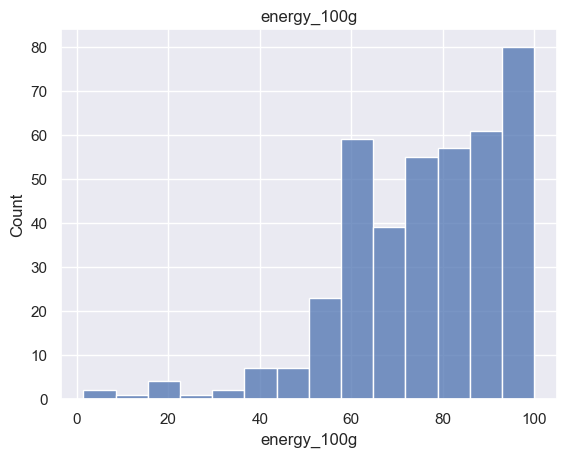

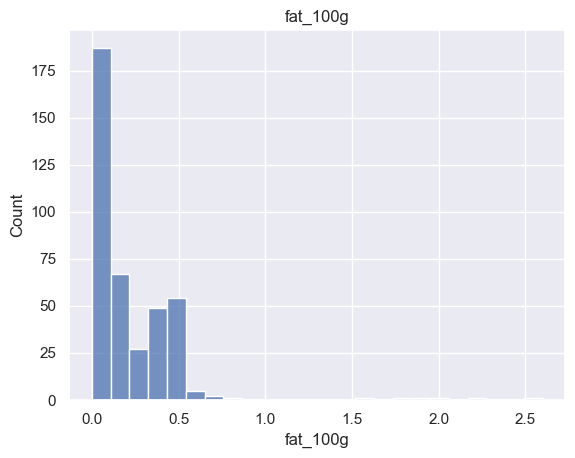

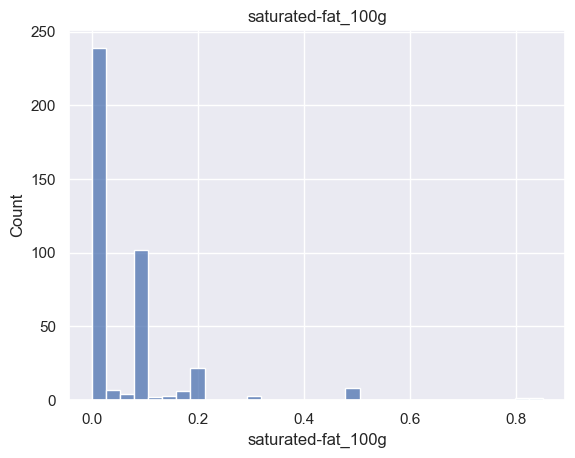

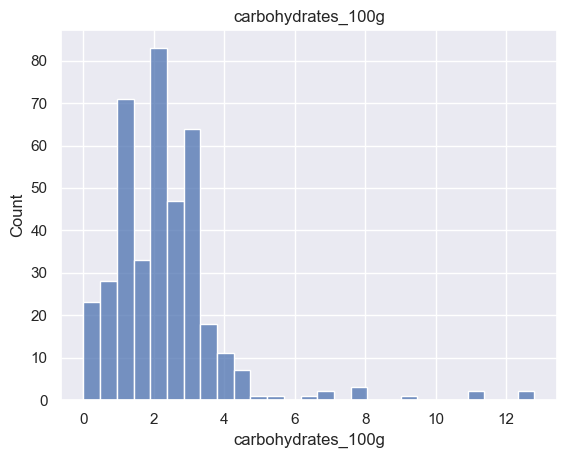

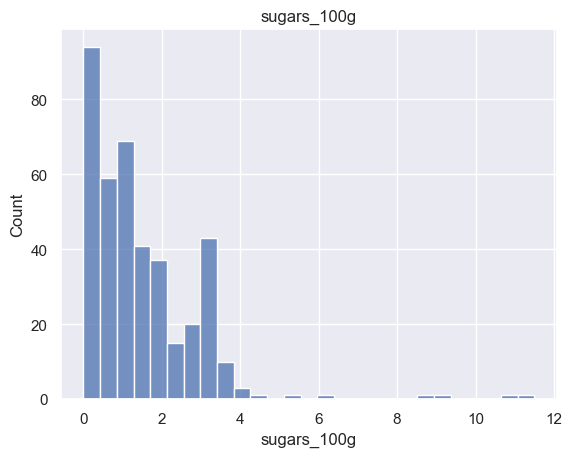

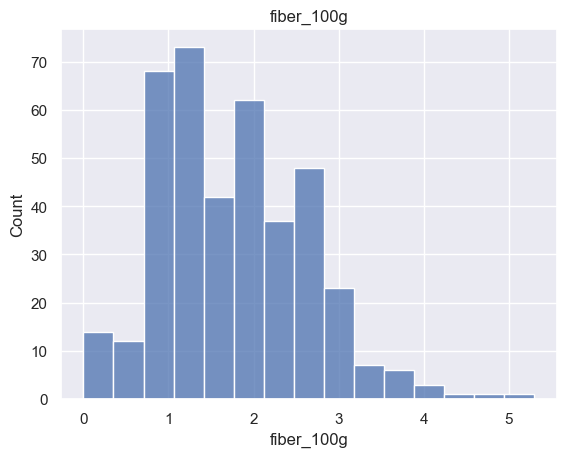

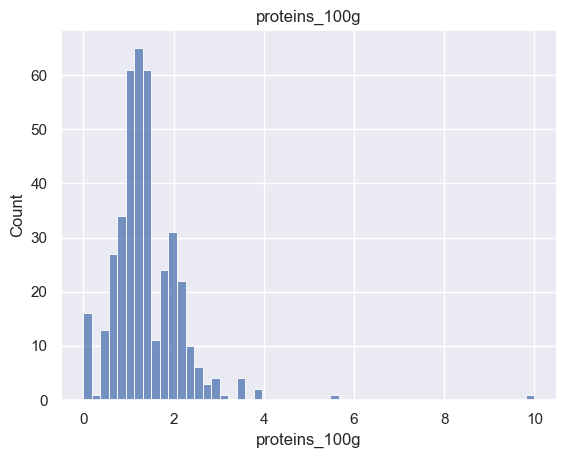

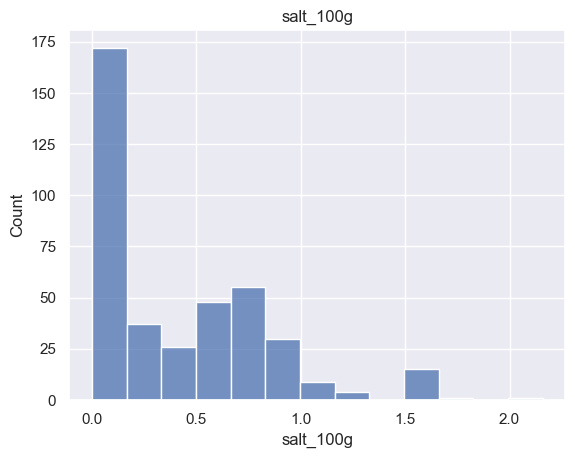

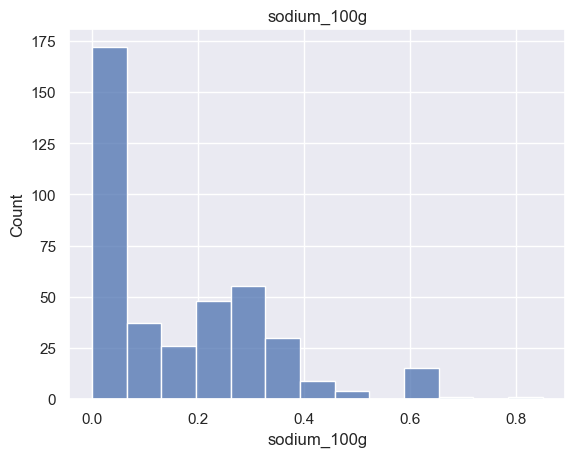

In [149]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Charger les données
data = pd.read_csv('data/fr.openfoodfacts.org.products_cleaned6.csv')

# Variables pertinentes
variables = ["product_name", "categories_fr", "ingredients_text", "energy_100g",
             "fat_100g", "saturated-fat_100g", "carbohydrates_100g", "sugars_100g",
             "fiber_100g", "proteins_100g", "salt_100g", "sodium_100g",'nutrition_grade_fr']

# Filtrer les données
filtered_data = data[variables]

# Traiter les valeurs manquantes
filtered_data = filtered_data.dropna()

# Traiter les valeurs aberrantes
for col in filtered_data.columns:
    if col.endswith("_100g"):
        filtered_data = filtered_data[filtered_data[col] >= 0]
        filtered_data = filtered_data[filtered_data[col] <= 100]

# Visualisations univariées
for col in filtered_data.columns:
    if col.endswith("_100g"):
        plt.figure()
        sns.histplot(data=filtered_data, x=col)
        plt.title(col)
        plt.show()


# Calcul du Nutri-Score
def compute_nutriscore(row):
    # Calcul des points selon les critères du Nutri-Score (simplifié)
    # Adaptez cette fonction selon les règles officielles du Nutri-Score
    score = 0
    score += row["energy_100g"] / 100
    score += row["saturated-fat_100g"] * 2
    score += row["sugars_100g"] / 5
    score -= row["fiber_100g"] / 2
    score -= row["proteins_100g"] / 10
    return score

filtered_data["nutriscore"] = filtered_data.apply(compute_nutriscore, axis=1)

# Sauvegarder le résultat
filtered_data.to_csv("nutriscore_data_v1.csv", index=False)

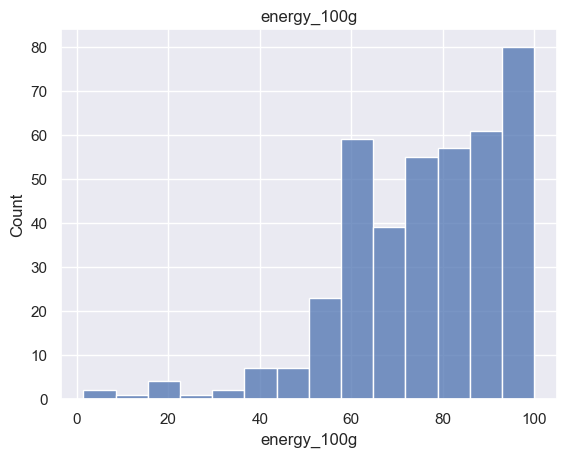

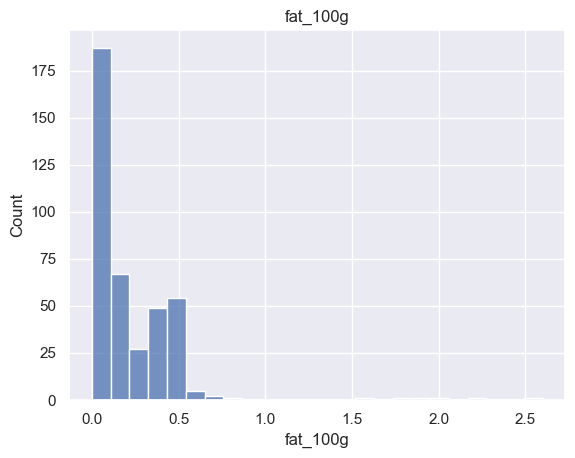

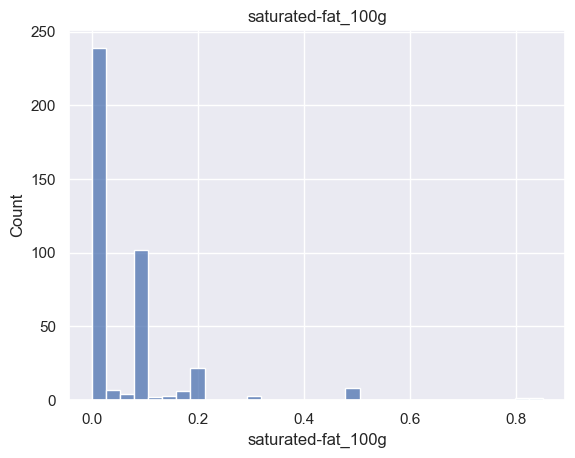

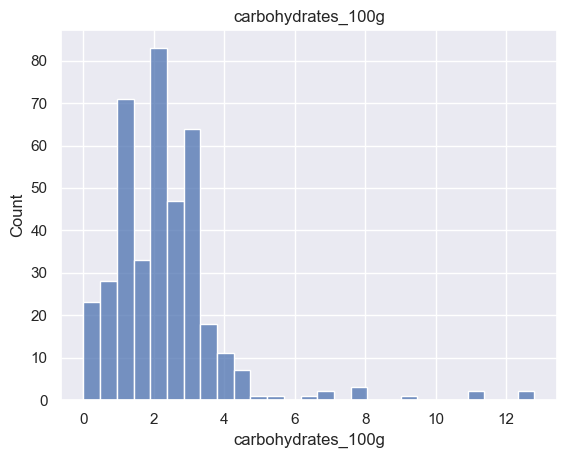

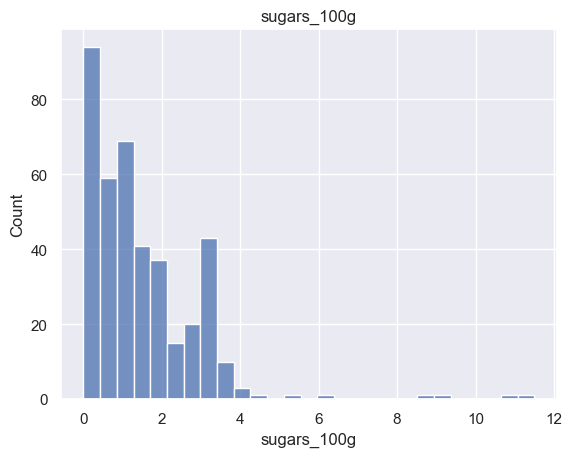

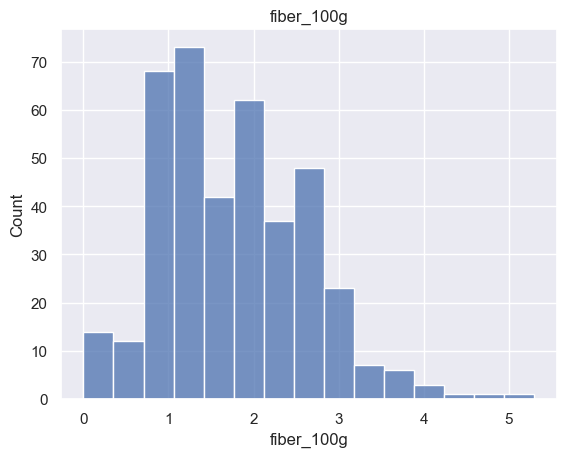

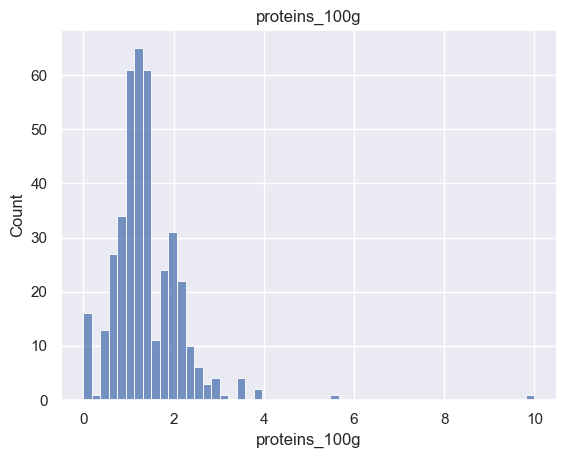

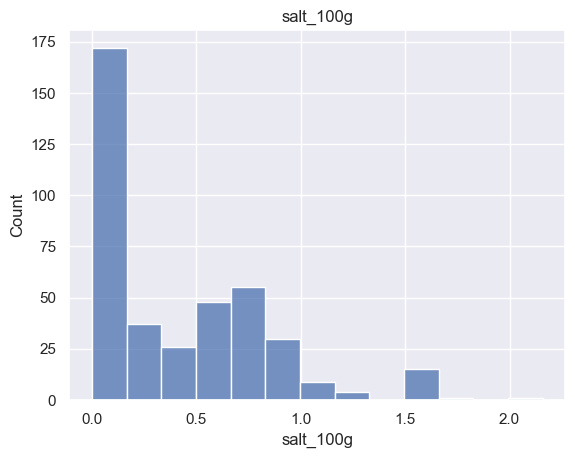

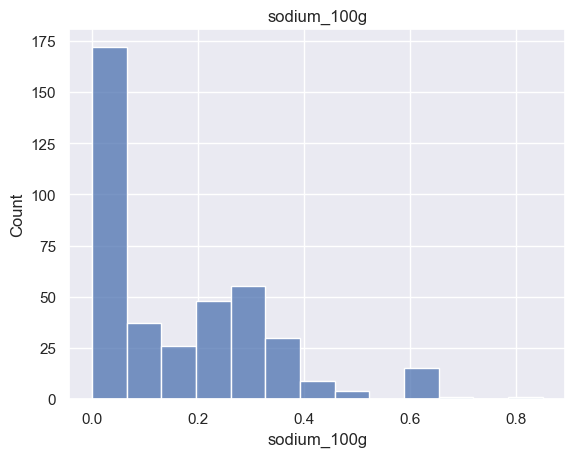

In [148]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Charger les données
# data = pd.read_csv("open_food_facts.csv")

# Variables pertinentes
variables = ["product_name", "categories_fr", "ingredients_text", "energy_100g", "fat_100g", "saturated-fat_100g", 
             "carbohydrates_100g", "sugars_100g","fiber_100g", "proteins_100g", "salt_100g", "sodium_100g",'nutrition_grade_fr']  

# Filtrer les données
filtered_data = data[variables]  

# Traiter les valeurs manquantes
filtered_data = filtered_data.dropna()  

# Traiter les valeurs aberrantes
for col in filtered_data.columns:
    if col.endswith("_100g"):
        filtered_data = filtered_data[filtered_data[col] >= 0]
        filtered_data = filtered_data[filtered_data[col] <= 100]  

# Visualisations univariées
for col in filtered_data.columns:
    if col.endswith("_100g"):
        plt.figure()
        sns.histplot(data=filtered_data, x=col)
        plt.title(col)
        plt.show()  

# Calcul du Nutri-Score
def compute_nutriscore(row):
    # Calcul des points selon les règles officielles du Nutri-Score 
    score = 0
    score += row["energy_100g"]
    score += row["saturated-fat_100g"] * 2
    score += row["sugars_100g"]
    score -= row["fiber_100g"]
    score -= row["proteins_100g"] / 2
    
    if score <= -1:
        return "A"
    elif score <= 2:
        return "B"
    elif score <= 10:
        return "C"
    elif score <= 18:
        return "D"
    else:
        return "E"

filtered_data["nutriscore_f"] = filtered_data.apply(compute_nutriscore, axis=1)  

# Sauvegarder le résultat
filtered_data.to_csv("nutriscore_data_v2.csv", index=False)

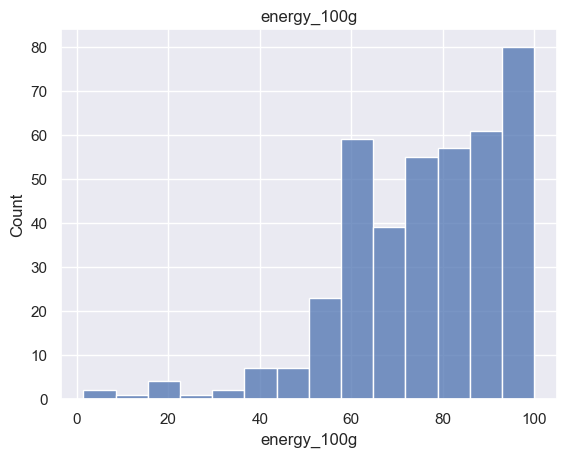

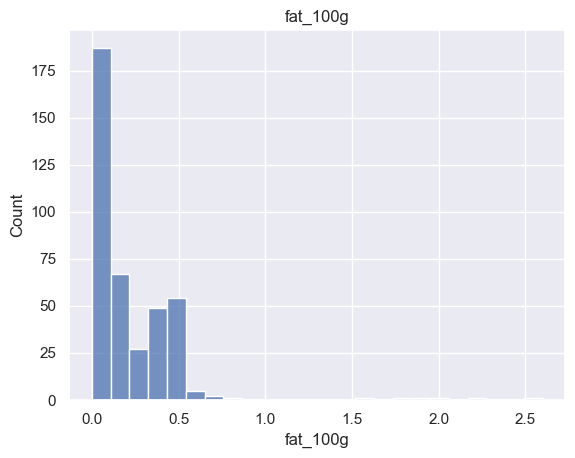

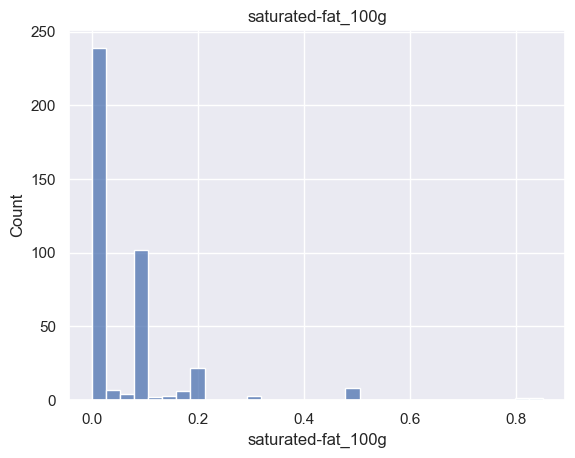

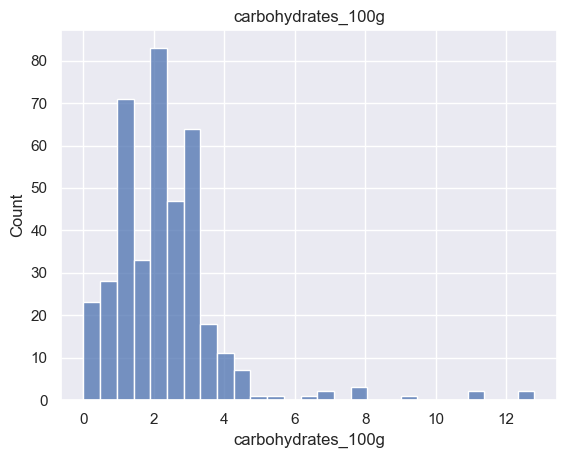

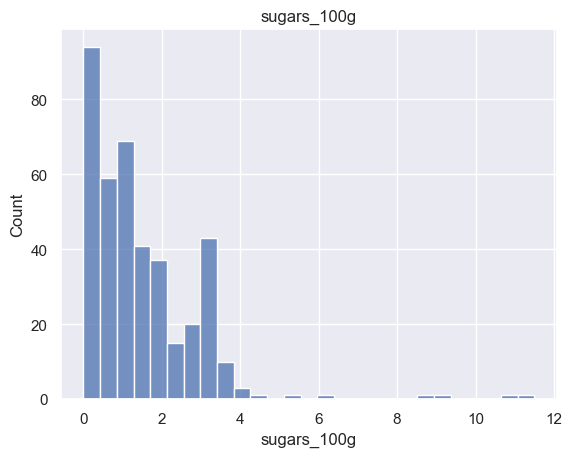

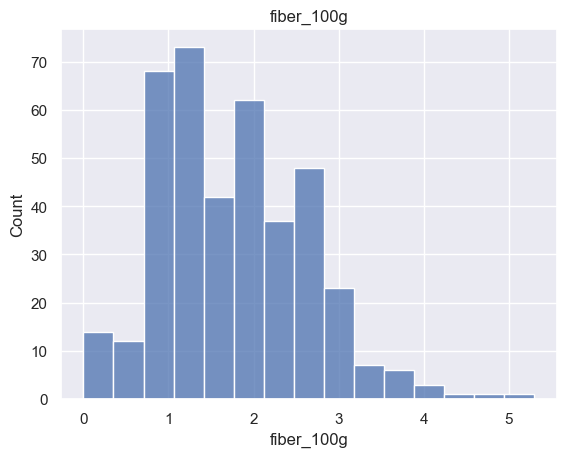

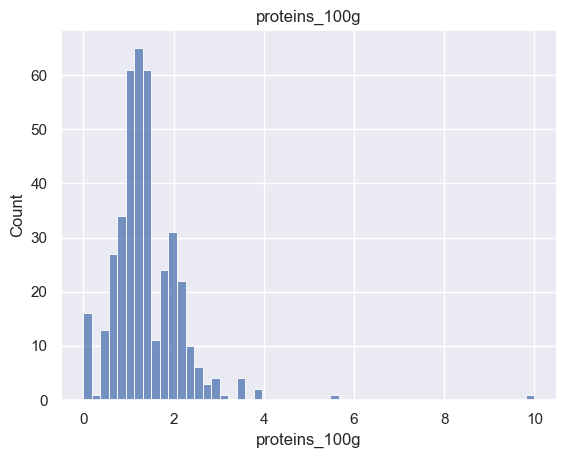

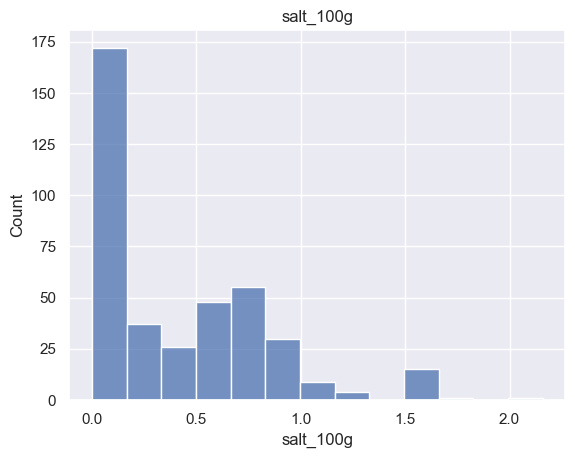

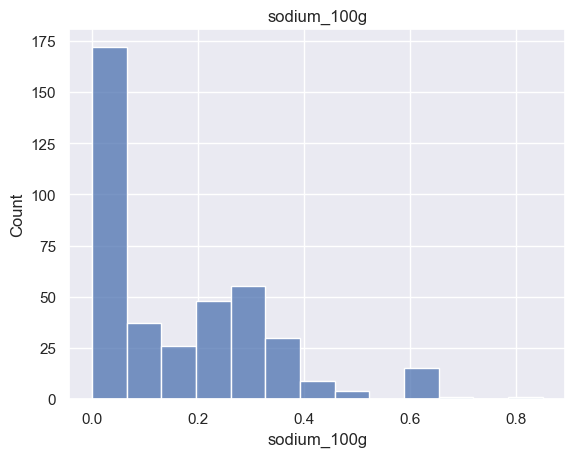

In [152]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Charger les données
data = pd.read_csv('data/fr.openfoodfacts.org.products_cleaned6.csv')

# Variables pertinentes
variables = ["product_name", "categories_fr", "ingredients_text", "energy_100g", "fat_100g", "saturated-fat_100g",
             "carbohydrates_100g", "sugars_100g", "fiber_100g", "proteins_100g", "salt_100g", "sodium_100g",'nutrition_grade_fr']

# Filtrer les données
filtered_data = data[variables]

# Traiter les valeurs manquantes
filtered_data = filtered_data.dropna()

# Traiter les valeurs aberrantes
for col in filtered_data.columns:
    if col.endswith("_100g"):
        filtered_data = filtered_data[filtered_data[col] >= 0]
        filtered_data = filtered_data[filtered_data[col] <= 100]

# Calcul du Nutri-Score
def compute_nutriscore(row):
    # Calcul des points selon les règles officielles du Nutri-Score 
    score = 0
    energy_points = 0
    saturated_fat_points = 0
    sugars_points = 0
    sodium_points = 0
    fiber_points = 0
    proteins_points = 0
    
    # Points pour l'énergie
    if row["energy_100g"] <= 335:
        energy_points = 0
    elif row["energy_100g"] <= 670:
        energy_points = 1
    elif row["energy_100g"] <= 1005:
        energy_points = 2
    elif row["energy_100g"] <= 1340:
        energy_points = 3
    elif row["energy_100g"] <= 1675:
        energy_points = 4
    else:
        energy_points = 5
        
    # Points pour les acides gras saturés
    if row["saturated-fat_100g"] <= 1:
        saturated_fat_points = 0
    elif row["saturated-fat_100g"] <= 2:
        saturated_fat_points = 1
    elif row["saturated-fat_100g"] <= 3:
        saturated_fat_points = 2
    elif row["saturated-fat_100g"] <= 4:
        saturated_fat_points = 3
    elif row["saturated-fat_100g"] <= 5:
        saturated_fat_points = 4
    else:
        saturated_fat_points = 5
    
    # Points pour les sucres
    if row["sugars_100g"] <= 4.5:
        sugars_points = 0
    elif row["sugars_100g"] <= 9:
        sugars_points = 1
    elif row["sugars_100g"] <= 13.5:
        sugars_points = 2
    elif row["sugars_100g"] <= 18:
        sugars_points = 3
    elif row["sugars_100g"] <= 22.5:
        sugars_points = 4
    else:
        sugars_points = 5
    
    # Points pour le sodium ou sel
    if row["sodium_100g"] <= 90:
        sodium_points = 0
    elif row["sodium_100g"] <= 180:
        sodium_points = 1
    elif row["sodium_100g"] <= 270:
        sodium_points = 2
    elif row["sodium_100g"] <= 360:
        sodium_points = 3
    elif row["sodium_100g"] <= 450:
        sodium_points = 4
    else:
        sodium_points = 5
        
    # Points pour les fibres
    if row["fiber_100g"] >= 3:
        fiber_points = 1
        
    # Points pour les protéines
    if row["proteins_100g"] >= 1.6:
        proteins_points = 0.5 * np.floor((row["proteins_100g"] - 1.6) / 0.8)
        
    # Score final
    score = energy_points + saturated_fat_points + sugars_points + sodium_points - fiber_points - proteins_points
    
    if score <= -1:
        return "A"
    elif score <= 2:
        return "B"
    elif score <= 10:
        return "C"
    elif score <= 18:
        return "D"
    else:
        return "E"

filtered_data["nutriscore_f"] = filtered_data.apply(compute_nutriscore, axis=1)

# Visualisations univariées
for col in filtered_data.columns:
    if col.endswith("_100g"):
        plt.figure()
        sns.histplot(data=filtered_data, x=col)
        plt.title(col)
        plt.show()

# Sauvegarder le résultat
filtered_data.to_csv("nutriscore_data_v3.csv", index=False)

### Random Forest Regressor

Le modèle par régression linéaire ne semble pas donner de bons résultats. Essayons un modèle non linéaire (modèle d'ensemble : Random Forest)

In [176]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

params = {
    'n_estimators': [50],
    'verbose' : [1]
}

rfr = GridSearchCV(RandomForestRegressor(), params, cv = 5)

In [177]:
rfr.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'n_estimators': [50], 'verbose': [1]})

In [178]:
rfr.best_estimator_

RandomForestRegressor(n_estimators=50, verbose=1)

In [524]:

print('R² sur jeu d\'entraînement : ', rfr.best_estimator_.score(X_train,y_train))
print('R² sur jeu de test', rfr.best_estimator_.score(X_test,y_test))


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.1s finished


R² sur jeu d'entraînement :  0.9907021597770415
R² sur jeu de test 0.9399302983634974


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished


In [181]:
print('RMSE = ', sqrt(mean_squared_error(y_test, rfr.best_estimator_.predict(X_test))))

RMSE =  1.8987755787471137


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


(-1.4000000000000001, 29.4, -1.982163429260254, 41.62543201446533)

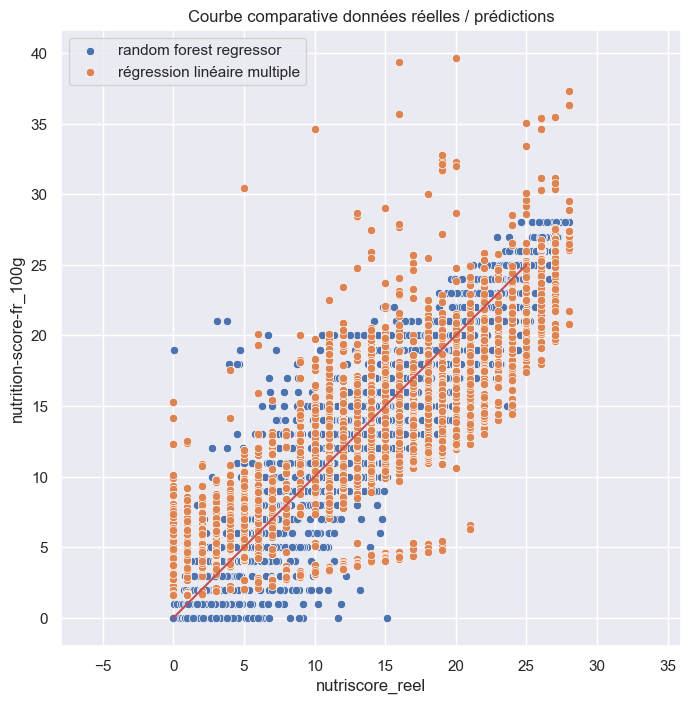

In [183]:
plt.figure(figsize=(8,8))
plt.title('Courbe comparative données réelles / prédictions')
sns.scatterplot(x = rfr.predict(X_test),y = y_test)
sns.scatterplot(x = resultat['nutriscore_reel'], y = resultat['prediction'])
plt.legend(['random forest regressor', 'régression linéaire multiple'])
sns.lineplot([0,25],[0,25], color='r')
ax = plt.gca()
ax.set_xlim(0,25)
ax.set_ylim(0,25)
ax.axis('equal')

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


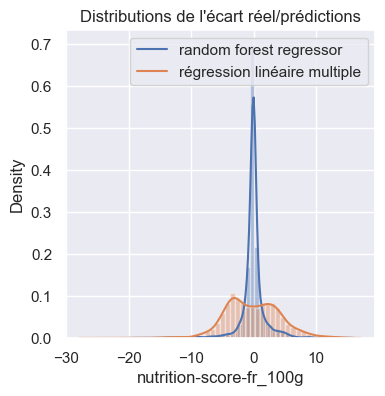

In [184]:
plt.figure(figsize=(4,4))
plt.title('Distributions de l\'écart réel/prédictions')
sns.distplot(rfr.predict(X_test) -  y_test)
sns.distplot(resultat['nutriscore_reel'] - resultat['prediction'])
plt.legend(['random forest regressor', 'régression linéaire multiple'])

In [185]:
rfr.best_estimator_.feature_importances_

array([0.50682837, 0.01670931, 0.1875935 , 0.01912755, 0.10642359,
       0.0422758 , 0.0597439 , 0.06129797])

In [186]:
random_forest_features = pd.DataFrame({'feature' : data_reg.drop(['nutrition-score-fr_100g'],axis=1).columns,
                                      'importance' : rfr.best_estimator_.feature_importances_})

In [187]:
random_forest_features.sort_values(by='importance',ascending=False, inplace=True)

<Axes: title={'center': 'Importance des variables dans le random forest'}, xlabel='importance', ylabel='feature'>

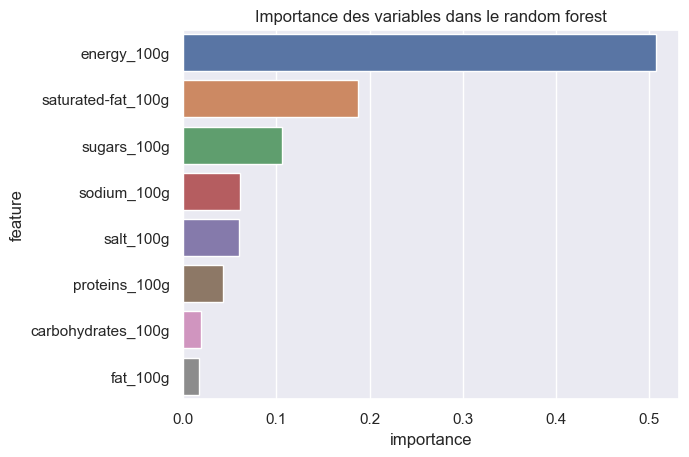

In [188]:
plt.title('Importance des variables dans le random forest')

sns.barplot(y = random_forest_features['feature'], x=random_forest_features['importance'])

Graphiquement, on observe assez nettement que le random forest décrit mieux la variance du jeu de données que le modèle par régression linéaire multiple :
* écart quasi nul pour une partie plus importante des données, 
* pour les écarts plus important, la porportion est plus faible que pour la régression linéaire.

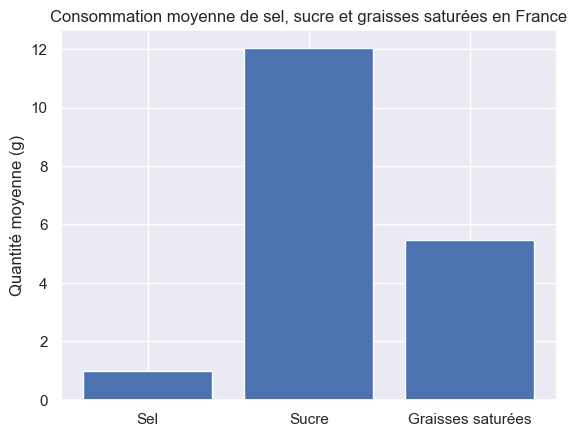

In [154]:
import pandas as pd
import matplotlib.pyplot as plt

# Charger les données
df = pd.read_csv('data/fr.openfoodfacts.org.products_cleaned6.csv')

# Nettoyer les données
df = df.dropna(subset=["salt_100g", "sugars_100g", "saturated-fat_100g"])
df = df[df["salt_100g"] > 0]
df = df[df["sugars_100g"] > 0]
df = df[df["saturated-fat_100g"] > 0]

# Calculer la quantité moyenne de sel, de sucre et de graisses saturées
mean_salt = df["salt_100g"].mean()
mean_sugar = df["sugars_100g"].mean()
mean_sat_fat = df["saturated-fat_100g"].mean()

# Créer le graphique
labels = ["Sel", "Sucre", "Graisses saturées"]
values = [mean_salt, mean_sugar, mean_sat_fat]
plt.bar(labels, values)
plt.ylabel("Quantité moyenne (g)")
plt.title("Consommation moyenne de sel, sucre et graisses saturées en France")
plt.show()


In [173]:
# # Importer les données
# # df = pd.read_csv("data/fr.openfoodfacts.org.products.csv")
# df = pd.read_csv("data/fr.openfoodfacts.org.products.csv", sep='\t')

# # Nettoyer les données
# df = df.dropna(subset=["fruit-and-vegetable-juices_100g", "fruits-vegetables-nuts_100g"])
# df = df[df["fruit-and-vegetable-juices_100g"] > 0]
# df = df[df["fruits-vegetables-nuts_100g"] > 0]

# # Calculer la quantité moyenne de fruits et légumes
# mean_fruits_veggies = df["fruits-vegetables-nuts_100g"].mean()

# # Créer le graphique
# labels = ["Fruits et légumes"]
# values = [mean_fruits_veggies]
# plt.bar(labels, values)
# plt.ylabel("Quantité moyenne (g)")
# plt.title("Consommation moyenne de fruits et légumes en France")
# plt.show()


***************homemade***********************
        energy_100g  salt_100g  sugars_100g  fat_100g  \
175278  1120.0       0.14100    23.7         15.4       
178647  1603.0       0.66040    13.3         1.0        
178663  229.0        0.01000    11.7         0.1        
185345  1384.0       1.20000    12.9         7.8        
188263  290.0        0.00762    14.1         0.5        
188490  778.0        0.46000    18.5         9.1        
189756  75.0         93.60000   1.5          0.5        
191078  1146.0       0.21000    30.0         10.0       
192597  318.0        0.01000    15.0         0.5        
195690  1592.0       0.93000    19.0         1.5        
200075  644.0        0.07000    17.0         3.5        
200193  1502.0       1.01600    19.0         12.0       
203496  1182.0       1.60000    1.8          11.0       
203802  1537.0       0.10000    3.0          4.6        
203830  1485.0       0.99060    19.0         12.0       
205987  1454.0       1.10000    11.7     

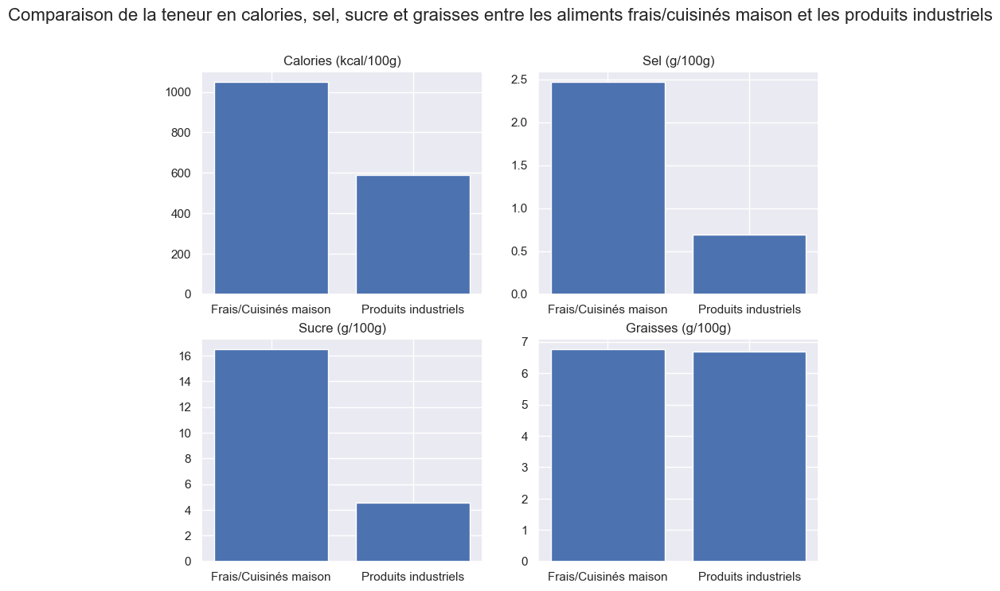

In [189]:
import pandas as pd
import matplotlib.pyplot as plt

# Charger le fichier csv dans un dataframe pandas
df = pd.read_csv("data/fr.openfoodfacts.org.products.csv", sep='\t')

# Filtrer les données pour ne garder que les aliments et les boissons
df = df[df["categories"].str.contains("food|drink", na=False)]

# Sélectionner les variables d'intérêt
df = df[["energy_100g", "salt_100g", "sugars_100g", "fat_100g","ingredients_text"]]

# Supprimer toutes les valeurs nulles des colonnes
df = df.dropna()

# Calculer la moyenne des valeurs pour les aliments frais ou cuisinés maison et pour les produits industriels
# homemade = df[(df["ingredients_text"].str.contains("home made", case=False))]
# industrial = df[(df["ingredients_text"].str.contains("industrial", case=False))]

homemade = df[(df["ingredients_text"].str.contains("home made|fait maison|frais|cuisinés", case=False))]
industrial = df[(df["ingredients_text"].str.contains("industrial|industriel|transformé", case=False))]

homemade_mean = homemade.mean()
industrial_mean = industrial.mean()
print("***************homemade***********************")
print(homemade)
print("***************industrial***********************")
print(industrial)
print("***************homemade_mean***********************")
print(homemade_mean)
print("***************industrial_mean***********************")
print(industrial_mean)
print("***************df***********************")
print(df)

# Créer un graphique en barres pour chaque variable
fig, ax = plt.subplots(2, 2, figsize=(10, 8))
fig.suptitle("Comparaison de la teneur en calories, sel, sucre et graisses entre les aliments frais/cuisinés maison et les produits industriels", fontsize=16)

ax[0, 0].bar(["Frais/Cuisinés maison", "Produits industriels"], [homemade_mean["energy_100g"], industrial_mean["energy_100g"]])
ax[0, 0].set_title("Calories (kcal/100g)")

ax[0, 1].bar(["Frais/Cuisinés maison", "Produits industriels"], [homemade_mean["salt_100g"], industrial_mean["salt_100g"]])
ax[0, 1].set_title("Sel (g/100g)")

ax[1, 0].bar(["Frais/Cuisinés maison", "Produits industriels"], [homemade_mean["sugars_100g"], industrial_mean["sugars_100g"]])
ax[1, 0].set_title("Sucre (g/100g)")

ax[1, 1].bar(["Frais/Cuisinés maison", "Produits industriels"], [homemade_mean["fat_100g"], industrial_mean["fat_100g"]])
ax[1, 1].set_title("Graisses (g/100g)")

plt.show()


In [168]:
df.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name',
       'generic_name', 'quantity',
       ...
       'ph_100g', 'fruits-vegetables-nuts_100g',
       'collagen-meat-protein-ratio_100g', 'cocoa_100g', 'chlorophyl_100g',
       'carbon-footprint_100g', 'nutrition-score-fr_100g',
       'nutrition-score-uk_100g', 'glycemic-index_100g',
       'water-hardness_100g'],
      dtype='object', length=162)

In [184]:
print (df) 

        energy_100g  salt_100g  sugars_100g  fat_100g  \
236     144.0        0.000000   2.50         0.90       
628     1554.0       0.010008   1.50         1.30       
884     1554.0       0.010008   1.50         1.30       
1719    1050.0       1.220000   7.14         1.79       
1727    1120.0       1.470000   2.22         2.22       
...        ...            ...    ...          ...       
320318  3404.0       0.000000   0.00         92.00      
320378  690.0        8.407400   11.20        1.00       
320399  1210.0       0.876300   11.70        4.00       
320431  1325.0       1.978660   2.20         5.50       
320471  1150.0       0.025400   63.50        0.10       

                                                                                                                                                                                                                                                                                                                           

# QUESTION 5

**Rédiger un rapport d’exploration et pitcher votre idée durant la soutenance du projet.** : voir support de présentation